# Week 4 [GenHack 4] - LATENT-SPACE [16]

Urban Heat Islands (UHI) occur when densely built urban areas retain more heat than the surrounding rural landscape.
This effect is amplified by:

- Low vegetation cover
- Heat-absorbing materials (concrete, asphalt)
- Reduced evaporative cooling
- Waste heat from buildings and traffic
- Urban geometry that traps longwave radiation


**Use Cases**:
- **Real Estate**: Heat-related property value adjustments
- **Energy**: Cooling demand forecasting and grid stress prediction
- **Public Health**: Heat mortality risk mapping for vulnerable populations
- **Urban Planning**: Green space optimization for climate adaptation
- **ESG Reporting**: Quantitative climate risk disclosure metrics


No single dataset provides both spatial detail and temporal coverage needed for urban heat assessment. Therefore, we combine complementary sensors:
1. **ERA5**: Complete spatial coverage but coarse resolution → regional context
2. **Sentinel-2**: Fine spatial detail → identify UHI hotspots
3. **Sentinel-3**: High temporal frequency → track seasonal dynamics
4. **Stations**: Point accuracy → validate and calibrate gridded products


In week [3], we quantify the Urban Heat Island (UHI) effect using satellite NDVI (Sentinel-2 & 3), ERA5 temperature, ECA&D weather stations, wind, and land cover context. We extend the analysis to contrast Wien vs SE England (maritime)

Most importantly, we address the “Graal Question”:

> **Does NDVI explain the temperature errors between satellite/reanalysis data and weather stations?**


In [1]:
#!/usr/bin/env python3

import glob
from pathlib import Path

import numpy as np
import pandas as pd
import xarray as xr

import numpy as np
import pandas as pd


# Geospatial Processing
import geopandas as gpd
import rasterio
import rasterio.warp
from rasterio.mask import mask as rasterio_mask

import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
from shapely.geometry import Point
import geopandas as gpd
from pathlib import Path

# Statistics & Regression
from scipy import stats
from scipy.stats import linregress, probplot
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

import torch, torch.nn as nn, torch.optim as optim
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from tqdm import tqdm

# paths to datasets :

BASE_DIR = Path("/Users/mohammedakramlrhorfi/Library/Mobile Documents/com~apple~CloudDocs/hackathon_data")

# Administrative boundaries
GADM_EUROPE_PATH = BASE_DIR / "gadm_410_europe.gpkg"

# ERA5-Land daily statistics
ERA5_LAND_DIR = BASE_DIR / "derived-era5-land-daily-statistics"

# Sentinel-2 NDVI (high spatial resolution)
SENTINEL2_NDVI_PATH = Path(
    "/Users/mohammedakramlrhorfi/Library/CloudStorage/GoogleDrive-akramlrhorfi12@hotmail.fr/"
    ".shortcut-targets-by-id/1peXqRQL4qCKhb1ldDYEjcM_I1gxXAJ0V/data_genhack/main/sentinel2_ndvi"
)

# Sentinel-3 OLCI NDVI (high temporal frequency)
SENTINEL3_NDVI_DIR = Path(
    "/Users/mohammedakramlrhorfi/Library/CloudStorage/GoogleDrive-akramlrhorfi12@hotmail.fr/"
    ".shortcut-targets-by-id/1peXqRQL4qCKhb1ldDYEjcM_I1gxXAJ0V/data_genhack/outdated/sentinel3-olci-ndvi"
)

# ECA&D station data
ECAD_TX_DIR = BASE_DIR / "ECA_blend_tx"

# Parameters
TARGET_YEAR = 2023
TARGET_CRS = "EPSG:4326"  # coordinate system used in the pipeline
STUDY_REGION_NAME = "Wien"  # keep the string; actual region GDF comes later

CRS_WGS84 = "EPSG:4326"
CRS_METRIC = "EPSG:3857"

---
## WEEK 1 — DATA EXPLORATION & INTEGRATION


## 1. Administrative Boundaries

Before working with climate datasets, it is essential to define the geographical context of the study.
In this cell, we load the GADM administrative boundaries for Europe, reproject them into the notebook’s target coordinate reference system, and extract key metadata such as:
	-	Number of administrative polygons
	-	Coordinate reference system (CRS)
	-	Spatial extent (bounding box) of Europe

In [65]:
# Load Europe GADM
gadm_europe = gpd.read_file(GADM_EUROPE_PATH).to_crs(TARGET_CRS)

print("GADM Europe dataset")
print(f"  - Shape: {gadm_europe.shape}")
print(f"  - CRS:   {gadm_europe.crs}")
print(f"  - Countries: {gadm_europe['NAME_0'].nunique()}")

bounds_europe = { "minx": gadm_europe.total_bounds[0], "miny": gadm_europe.total_bounds[1], "maxx": gadm_europe.total_bounds[2], "maxy": gadm_europe.total_bounds[3], }

print("\nEurope bounding box:")
print(f"  Longitude: {bounds_europe['minx']:.4f} to {bounds_europe['maxx']:.4f}")
print(f"  Latitude:  {bounds_europe['miny']:.4f} to {bounds_europe['maxy']:.4f}")

print("\n=== Italy Level-1 regions (NAME_1) ===")
italy_lvl1 = gadm_europe[gadm_europe["NAME_0"] == "Italy"]["NAME_1"].unique()
print(italy_lvl1)

#  study region
STUDY_REGION = gadm_europe[gadm_europe["NAME_1"] == STUDY_REGION_NAME].copy()
STUDY_REGION = STUDY_REGION.dissolve()
STUDY_REGION.head()

GADM Europe dataset
  - Shape: (106252, 21)
  - CRS:   EPSG:4326
  - Countries: 54

Europe bounding box:
  Longitude: -31.2682 to 69.0745
  Latitude:  32.4036 to 82.5375

=== Italy Level-1 regions (NAME_1) ===
['Abruzzo' 'Apulia' 'Basilicata' 'Calabria' 'Campania' 'Emilia-Romagna'
 'Friuli-Venezia Giulia' 'Lazio' 'Liguria' 'Lombardia' 'Marche' 'Molise'
 'Piemonte' 'Sardegna' 'Sicily' 'Toscana' 'Trentino-Alto Adige' 'Umbria'
 "Valle d'Aosta" 'Veneto']


,geometry,UID,GID_0,NAME_0,GID_1,NAME_1,ENGTYPE_1,GID_2,NAME_2,ENGTYPE_2,...,NAME_3,ENGTYPE_3,GID_4,NAME_4,ENGTYPE_4,GID_5,NAME_5,ENGTYPE_5,COUNTRY,CONTINENT
0,"POLYGON ((16.3262 48.13677, 16.32612 48.13664,...",11723,AUT,Austria,AUT.9_1,Wien,State,AUT.9.1_2,Wien Stadt,Statutory City,...,Wien,Municipality,AUT.9.1.1.1_2,Albern,Cadastral community,,,,Austria,Europe




Before working with climate data, it is useful to understand how the GADM administrative hierarchy is organized across Europe.
GADM provides 3 main levels:

	-	NAME_1 — First-level administrative regions (states, provinces, Länder, regions)
	-	NAME_2 — Second-level divisions (districts, counties, arrondissements, etc.)
	-	NAME_3 — Local subdivisions (municipalities, communes, boroughs), when available

Because countries differ greatly in how they subdivide administratively, the number of Level-2 units varies dramatically :

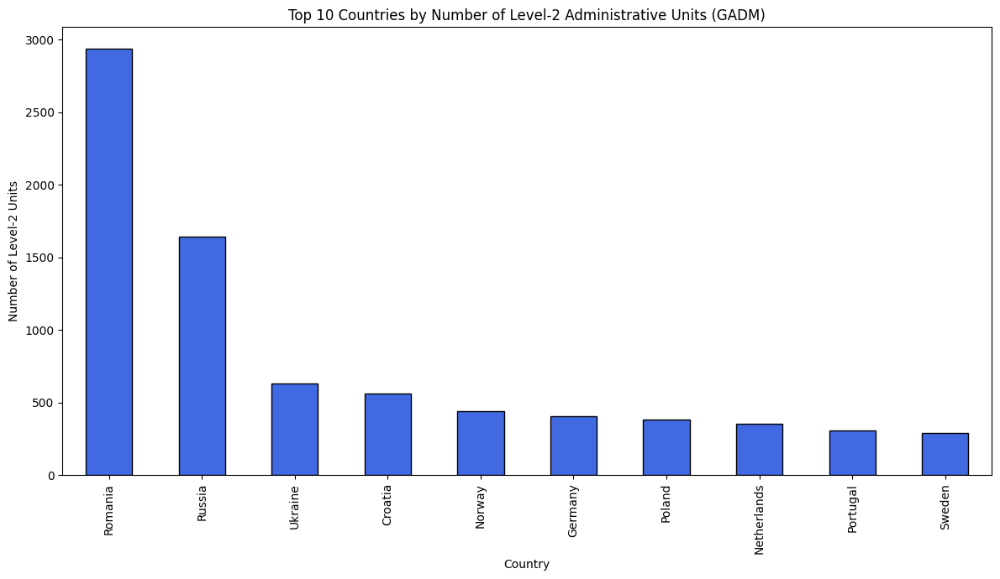

In [3]:
top10_data = ( gadm_europe.drop_duplicates("GID_2") .groupby("NAME_0") .size() .sort_values(ascending=False) )

plt.figure(figsize=(12, 7))
top10_data.head(10).plot(kind="bar", color="royalblue", edgecolor="black")
plt.title("Top 10 Countries by Number of Level-2 Administrative Units (GADM)")
plt.xlabel("Country")
plt.ylabel("Number of Level-2 Units")
plt.tight_layout()
plt.show()


## 2. Wien : A Climate-Sensitive Central European Capital

Wien (Vienna) presents an ideal case for UHI analysis due to:

- High population density concentrated in the urban core
- Compact, highly built-up historic core with dense residential districts → **strong Urban Heat Island (UHI)** expected
- Austria’s political, cultural, and economic center → **high asset exposure**
- Sharp land-cover transitions between city districts, parks, and the Wienerwald forest
- Frequent summer heatwaves (2013, 2015, 2019, 2022)
- Rich observational data from the Wien meteorological network
- Strong temperature gradients between densely built zones and green surroundings
- - Strong land-cover transitions:
  - Dense urban core (Innere Stadt, Neubau, Favoriten, Ottakring)
  - Large green areas, Danube river corridor, vineyards, and the **Wienerwald** forest
  → **Ideal for urban–suburban–rural contrast analysis**
- Representative of **Central European continental climate risks**


Wien
  - Sub-regions: 89
  - CRS: EPSG:4326


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/2025826207.py:20: UserWarning: Legend does not support handles for str instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/users/explain/axes/legend_guide.html#controlling-the-legend-entries
  leg = ax.legend( [""], [""], loc="upper left", frameon=True, facecolor="white", edgecolor="darkred", framealpha=0.95, )


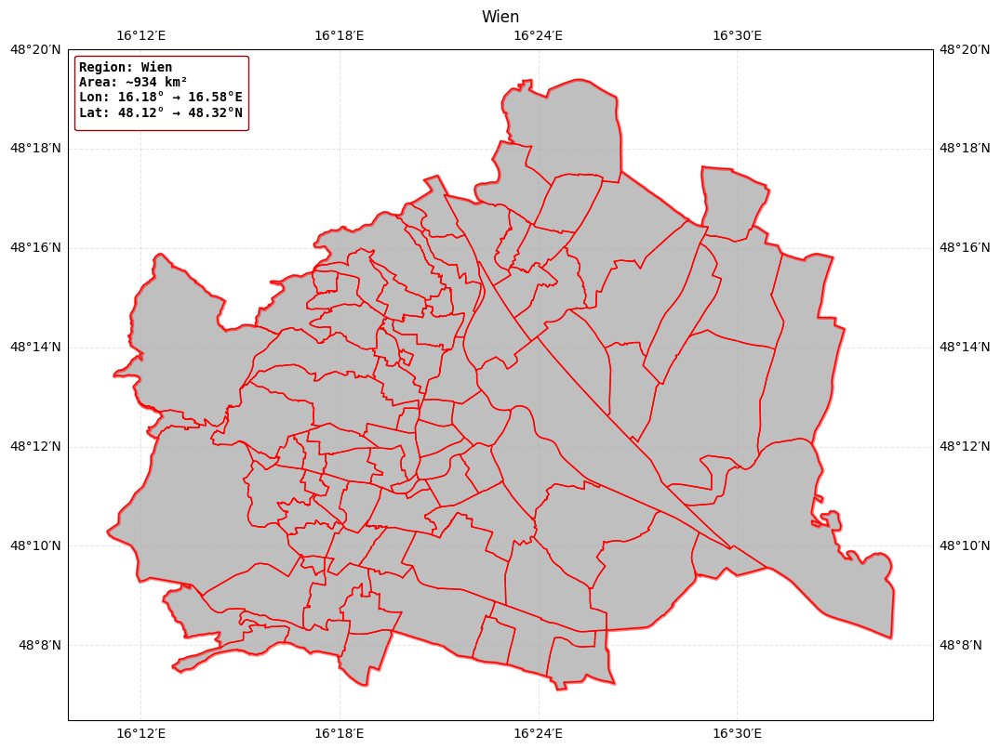

In [4]:
region_name = STUDY_REGION["NAME_1"].iloc[0]
subregions_gdf = gadm_europe[gadm_europe["NAME_1"] == region_name]

print(f"\n{region_name}")
print(f"  - Sub-regions: {len(subregions_gdf)}")
print(f"  - CRS: {STUDY_REGION.crs}")

b = STUDY_REGION.total_bounds
area_km2 = STUDY_REGION.to_crs(CRS_METRIC).area.sum() / 1e6

fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={"projection": ccrs.PlateCarree()})

STUDY_REGION.plot( ax=ax, facecolor="grey", edgecolor="red", linewidth=2.5, alpha=0.5, transform=ccrs.PlateCarree(), )
subregions_gdf.boundary.plot( ax=ax, edgecolor="red", linewidth=1, linestyle="-", transform=ccrs.PlateCarree(), )

ax.set( title=region_name, xlabel="Longitude", ylabel="Latitude", )
ax.grid(True, alpha=0.3, linestyle="--")

info = ( f"Region: {region_name}\n" f"Area: ~{area_km2:.0f} km²\n" f"Lon: {b[0]:.2f}° → {b[2]:.2f}°E\n" f"Lat: {b[1]:.2f}° → {b[3]:.2f}°N" )
leg = ax.legend( [""], [""], loc="upper left", frameon=True, facecolor="white", edgecolor="darkred", framealpha=0.95, )
leg.set_title(info, prop={"weight": "bold", "family": "monospace"})

ax.gridlines( draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.3, linestyle="--", )

plt.show()


## 3. ERA5-Land Temperature Analysis [2023]

- **Source**: ECMWF Copernicus Climate Data Store.
- **Spatial Resolution**: ~9 km (0.1° × 0.1°).
- **Temporal Resolution**: Hourly.
- **Coverage**: Global, 1950–present.
- **Variables**: Temperature, precipitation, u/v wind.
- **Pros:** temporal completeness.
- **Cons:** coarse spatial resolution → underestimates true UHI.




In [5]:
def load_era5_var(variable: str, year: int, directory=ERA5_LAND_DIR, chunks=None):
    """
    Load a single ERA5 variable for a given year and normalize dimension names.
    """
    if chunks is None:
        chunks = {"time": 64}

    pattern = str(Path(directory) / f"{year}_{variable}.nc")
    files = glob.glob(pattern)

    ds = xr.open_dataset(files[0], chunks=chunks)

    rename_dict = {}
    if "valid_time" in ds.dims and "time" not in ds.dims:
        rename_dict["valid_time"] = "time"
    if "lat" in ds.dims and "latitude" not in ds.dims:
        rename_dict["lat"] = "latitude"
    if "lon" in ds.dims and "longitude" not in ds.dims:
        rename_dict["lon"] = "longitude"

    if rename_dict:
        ds = ds.rename(rename_dict)

    return ds


ds_temp = load_era5_var("2m_temperature_daily_maximum", TARGET_YEAR, ERA5_LAND_DIR)

print(f"\n  Dimensions: {dict(ds_temp.dims)}")
print(f"  Coordinates: {list(ds_temp.coords)}")
print(f"  Data variables: {list(ds_temp.data_vars)}")

var_name = list(ds_temp.data_vars)[0]
print(f"  Primary variable: '{var_name}'")
print(f"  Attributes: {ds_temp[var_name].attrs}")

time_start = pd.Timestamp(ds_temp.time.values[0])
time_end = pd.Timestamp(ds_temp.time.values[-1])
n_timesteps = len(ds_temp.time)
print("\n  Temporal coverage:")
print(f"    Start: {time_start.strftime('%Y-%m-%d')}")
print(f"    End:   {time_end.strftime('%Y-%m-%d')}")
print(f"    Time steps: {n_timesteps} days")

lat_min, lat_max = float(ds_temp.latitude.min()), float(ds_temp.latitude.max())
lon_min, lon_max = float(ds_temp.longitude.min()), float(ds_temp.longitude.max())
print("\n  Spatial extent:")
print(f"    Latitude:  {lat_min:.2f}° to {lat_max:.2f}°N")
print(f"    Longitude: {lon_min:.2f}° to {lon_max:.2f}°E")
print(f"    Grid cells: {len(ds_temp.latitude)} × {len(ds_temp.longitude)}")

# Kelvin → Celsius
ds_temp["t2m_celsius"] = ds_temp[var_name] - 273.15
ds_temp["t2m_celsius"].attrs.update( { "units": "°C", "long_name": "2m air temperature daily maximum (Celsius)", "standard_name": "air_temperature", } )

temp_min = float(ds_temp["t2m_celsius"].min())
temp_max = float(ds_temp["t2m_celsius"].max())
temp_mean = float(ds_temp["t2m_celsius"].mean())
print(f"\n  Temperature stats ({TARGET_YEAR}):")
print(f"    Minimum: {temp_min:.2f}°C")
print(f"    Maximum: {temp_max:.2f}°C")
print(f"    Mean:    {temp_mean:.2f}°C")

/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/3194240110.py:29: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  print(f"\n  Dimensions: {dict(ds_temp.dims)}")



  Dimensions: {'time': 365, 'latitude': 350, 'longitude': 660}
  Coordinates: ['number', 'latitude', 'time', 'longitude']
  Data variables: ['t2m']
  Primary variable: 't2m'
  Attributes: {'GRIB_paramId': np.int64(167), 'GRIB_dataType': 'fc', 'GRIB_numberOfPoints': np.int64(6483600), 'GRIB_typeOfLevel': 'surface', 'GRIB_stepUnits': np.int64(1), 'GRIB_stepType': 'instant', 'GRIB_gridType': 'regular_ll', 'GRIB_uvRelativeToGrid': np.int64(0), 'GRIB_NV': np.int64(0), 'GRIB_Nx': np.int64(3600), 'GRIB_Ny': np.int64(1801), 'GRIB_cfName': 'unknown', 'GRIB_cfVarName': 't2m', 'GRIB_gridDefinitionDescription': 'Latitude/Longitude Grid', 'GRIB_iDirectionIncrementInDegrees': np.float64(0.1), 'GRIB_iScansNegatively': np.int64(0), 'GRIB_jDirectionIncrementInDegrees': np.float64(0.1), 'GRIB_jPointsAreConsecutive': np.int64(0), 'GRIB_jScansPositively': np.int64(0), 'GRIB_latitudeOfFirstGridPointInDegrees': np.float64(90.0), 'GRIB_latitudeOfLastGridPointInDegrees': np.float64(-90.0), 'GRIB_longitudeOfF

/Users/mohammedakramlrhorfi/miniforge3/lib/python3.12/site-packages/dask/array/reductions.py:292: RuntimeWarning: All-NaN slice encountered
  return np.nanmin(x_chunk, axis=axis, keepdims=keepdims)



  Temperature stats (2023):
    Minimum: -32.83°C
    Maximum: 49.04°C
    Mean:    12.46°C


Plotting ERA5 fields for 2023-01-01


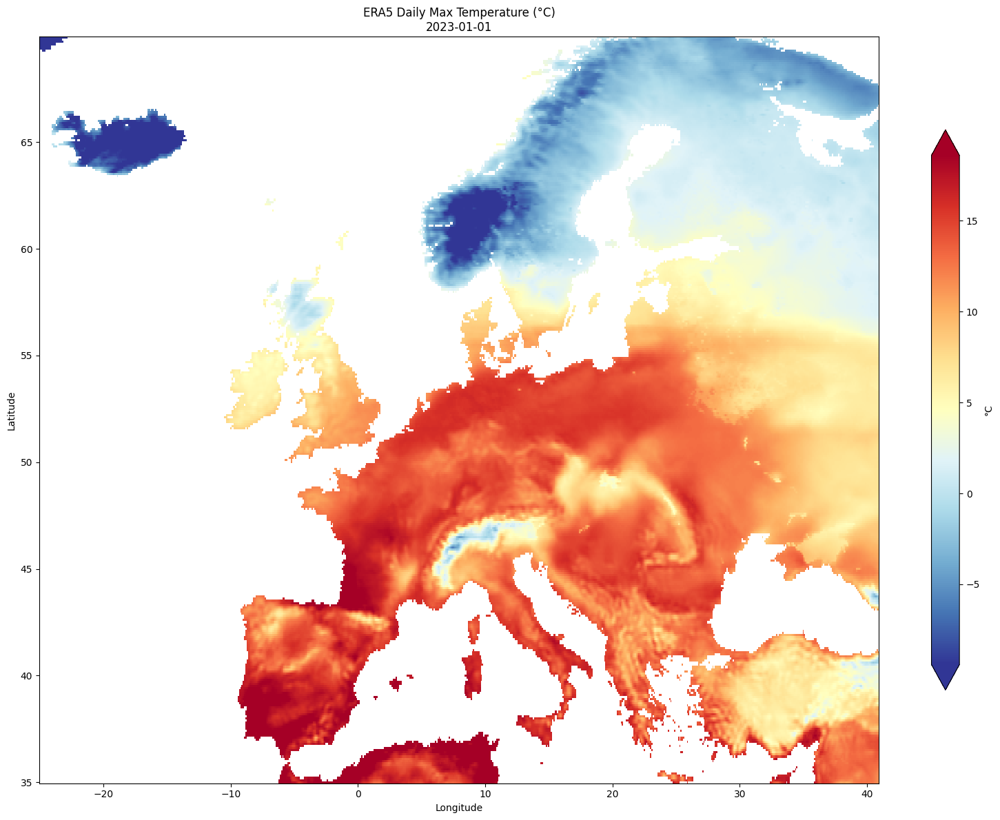

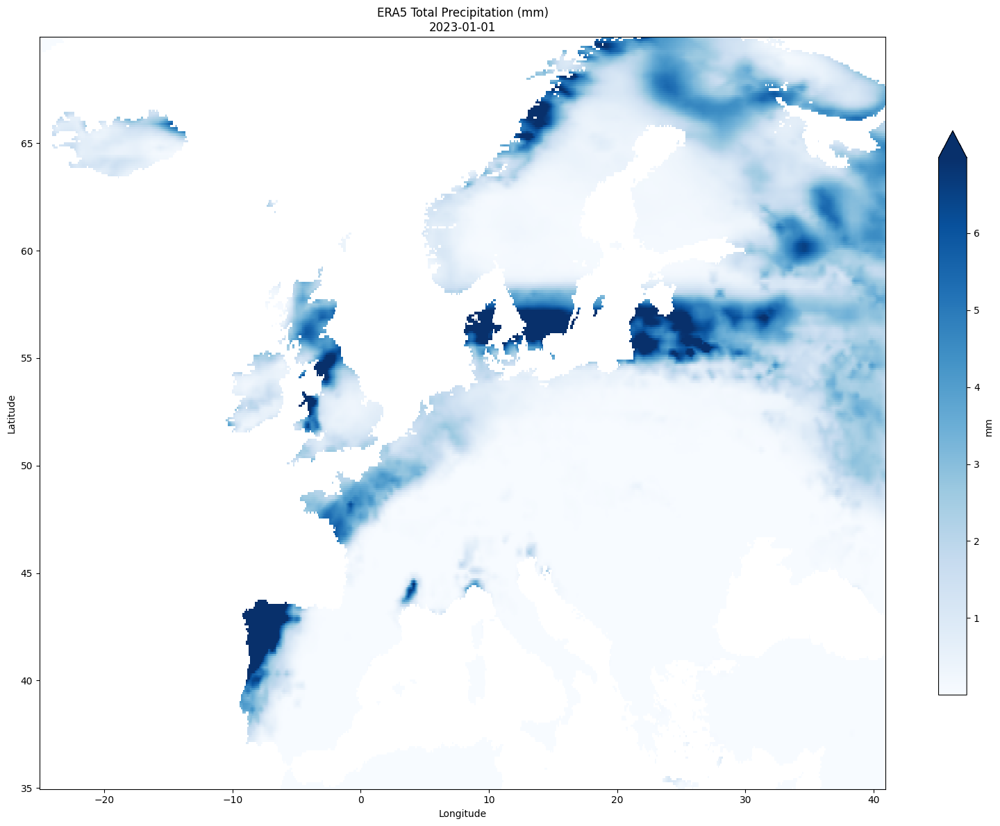

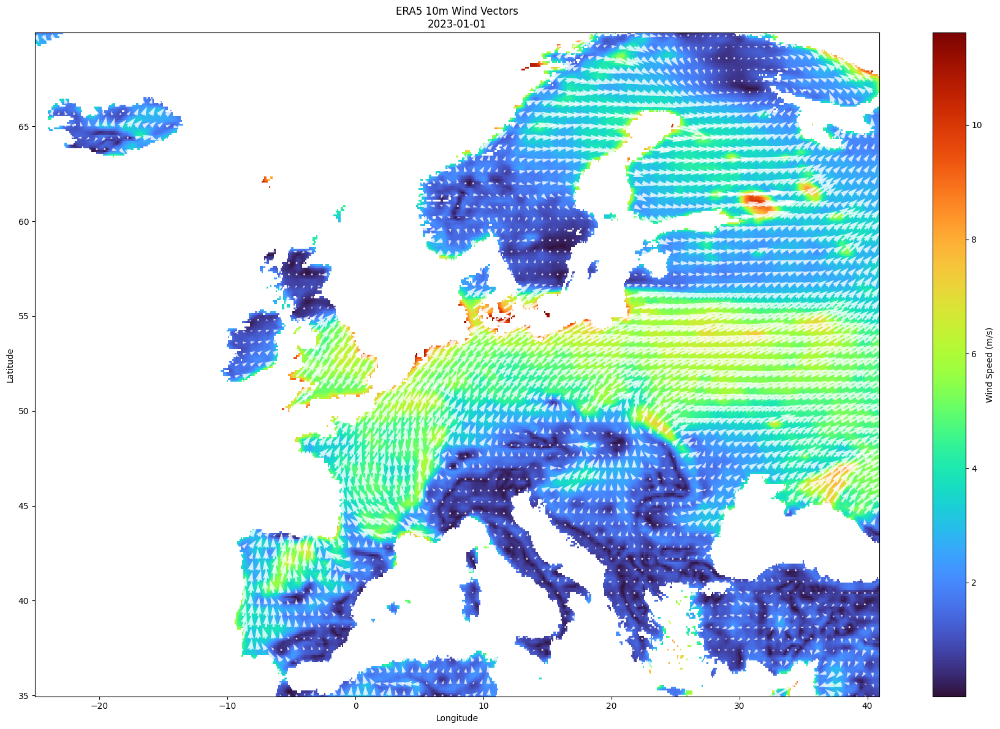

In [6]:
# Load ERA5 variables
ds_prec = load_era5_var("total_precipitation_daily_mean", TARGET_YEAR, ERA5_LAND_DIR)
ds_u10  = load_era5_var("10m_u_component_of_wind_daily_mean", TARGET_YEAR, ERA5_LAND_DIR)
ds_v10  = load_era5_var("10m_v_component_of_wind_daily_mean", TARGET_YEAR, ERA5_LAND_DIR)

#  precipitation to mm
ds_prec["tp_mm"] = ds_prec["tp"] * 1000.0

# Merge into one dataset
ds_all = xr.merge([ds_temp, ds_prec, ds_u10, ds_v10], compat="override")

# Clip to Europe
ds_roi = ds_all.sel( longitude=slice(bounds_europe["minx"], bounds_europe["maxx"]), latitude=slice(bounds_europe["maxy"], bounds_europe["miny"]), ).sortby("latitude")

DaY = ds_roi.isel(time=0)
day_str = pd.Timestamp(DaY.time.values).strftime("%Y-%m-%d")
print(f"Plotting ERA5 fields for {day_str}")

# Temperature plot
fig, ax = plt.subplots(figsize=(16, 12))
DaY["t2m_celsius"].plot( ax=ax, cmap="RdYlBu_r", vmin=float(DaY["t2m_celsius"].quantile(0.02)), vmax=float(DaY["t2m_celsius"].quantile(0.98)), add_colorbar=True, cbar_kwargs={"label": "°C", "shrink": 0.75}, )
ax.set(title=f"ERA5 Daily Max Temperature (°C)\n{day_str}", xlabel="Longitude", ylabel="Latitude")
plt.tight_layout()
plt.show()

# Precipitation plot
fig, ax = plt.subplots(figsize=(16, 12))
DaY["tp_mm"].plot( ax=ax, cmap="Blues", vmin=float(DaY["tp_mm"].quantile(0.02)), vmax=float(DaY["tp_mm"].quantile(0.98)), add_colorbar=True, cbar_kwargs={"label": "mm", "shrink": 0.75}, )
ax.set(title=f"ERA5 Total Precipitation (mm)\n{day_str}", xlabel="Longitude", ylabel="Latitude")
plt.tight_layout()
plt.show()

# Wind plot
u, v = DaY["u10"], DaY["v10"]
wind_speed = np.sqrt(u**2 + v**2)

stride = 6
lat_s = ds_roi.latitude.values[::stride]
lon_s = ds_roi.longitude.values[::stride]
U = u.values[::stride, ::stride]
V = v.values[::stride, ::stride]

fig, ax = plt.subplots(figsize=(18, 12))
pcm = ax.pcolormesh(ds_roi.longitude, ds_roi.latitude, wind_speed, cmap="turbo", shading="auto")
plt.colorbar(pcm, ax=ax, label="Wind Speed (m/s)")

ax.quiver(lon_s, lat_s, U, V, color="white", scale=250, width=0.0025, alpha=0.8)

ax.set(title=f"ERA5 10m Wind Vectors\n{day_str}", xlabel="Longitude", ylabel="Latitude")
plt.tight_layout()
plt.show()

We aim to analyse any trend within the variables by computing its rolling 30 days averages ( and sum in the case of precipitation ),
these rolling windows reveal seasonal trends, anomalies, and persistence patterns that strongly influence UHI intensity.

Wien
  Lon: 16.18 → 16.58
  Lat: 48.12 → 48.32


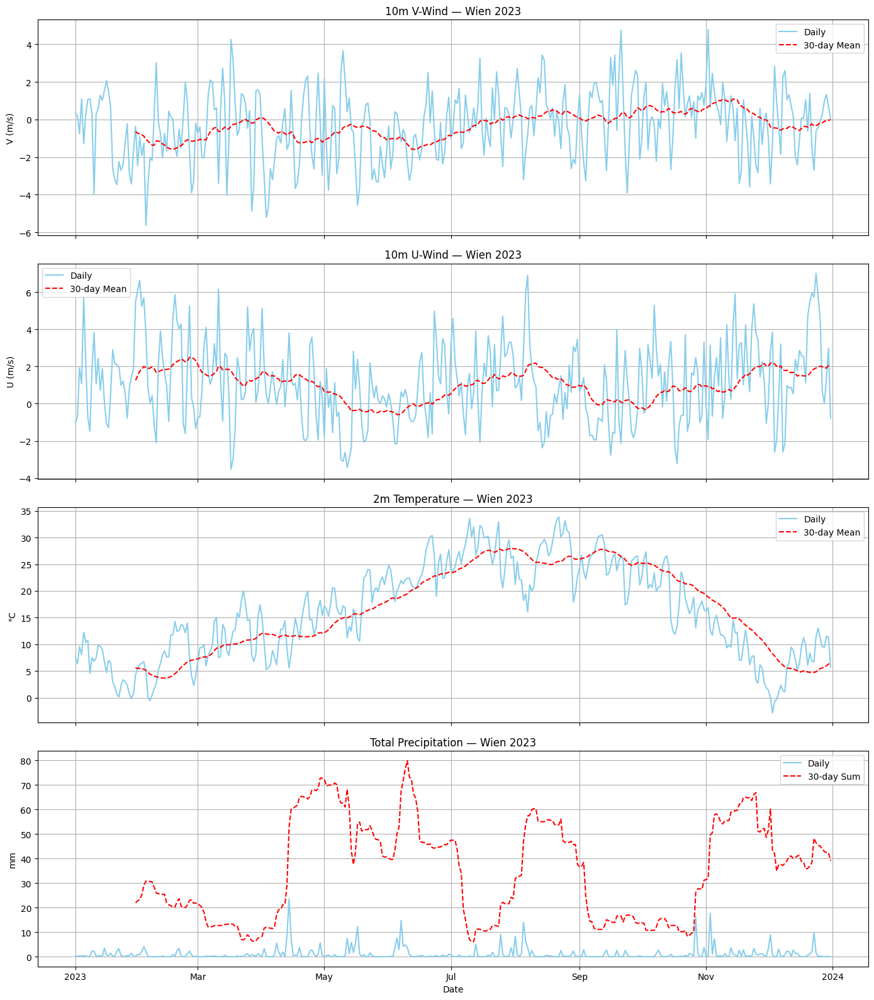

In [7]:
STUDY_REGION = STUDY_REGION.to_crs(CRS_WGS84)
minx, miny, maxx, maxy = STUDY_REGION.total_bounds
region_name = STUDY_REGION["NAME_1"].iloc[0]

print(
    f"{region_name}\n"
    f"  Lon: {minx:.2f} → {maxx:.2f}\n"
    f"  Lat: {miny:.2f} → {maxy:.2f}"
)

ds_sg = ds_all.sel( longitude=slice(minx, maxx), latitude=slice(maxy, miny), )

sg_series = ds_sg[["v10", "u10", "t2m_celsius", "tp_mm"]].mean(("latitude", "longitude"))

# Rolling 30-day mean
vars_main = ["v10", "u10", "t2m_celsius"]
roll = xr.Dataset({f"{v}_30d": sg_series[v].rolling(time=30).mean() for v in vars_main})
roll["tp_30d"] = sg_series["tp_mm"].rolling(time=30).sum()

titles = {
    "v10": f"10m V-Wind — {region_name} {TARGET_YEAR}",
    "u10": f"10m U-Wind — {region_name} {TARGET_YEAR}",
    "t2m_celsius": f"2m Temperature — {region_name} {TARGET_YEAR}",
    "tp": f"Total Precipitation — {region_name} {TARGET_YEAR}",
}
ylabels = {"v10": "V (m/s)", "u10": "U (m/s)", "t2m_celsius": "°C", "tp": "mm"}

fig, axes = plt.subplots(4, 1, figsize=(14, 16), sharex=True)

for ax, v in zip(axes[:3], vars_main):
    sg_series[v].plot(ax=ax, color="skyblue", label="Daily")
    roll[f"{v}_30d"].plot(ax=ax, color="red", linestyle="--", label="30-day Mean")
    ax.set(title=titles[v], ylabel=ylabels[v])
    ax.set_xlabel("")
    ax.grid(True)
    ax.legend()

sg_series["tp_mm"].plot(ax=axes[3], color="skyblue", label="Daily")
roll["tp_30d"].plot(ax=axes[3], color="red", linestyle="--", label="30-day Sum")
axes[3].set(title=titles["tp"], ylabel=ylabels["tp"])
axes[3].grid(True)
axes[3].legend()

axes[-1].set_xlabel("Date")
plt.tight_layout()
plt.show()


 1. Wind Dynamics (u10 & v10)

Both wind components display strong day-to-day variability, often shifting direction and magnitude as synoptic weather systems pass over Central Europe.

	-	Short-term fluctuations (peaks and troughs) reflect active frontal systems and cyclonic activity.
	-	The 30-day rolling means reveal a smoother seasonal cycle with:
	-	Slightly stronger winds in winter and early spring, a typical pattern for mid-latitude regions.
	-	More frequent low-wind periods during summer, which is important because weak ventilation amplifies Urban Heat Islands.

This behaviour confirms that wind is a major modulator of temperature discrepancies between ERA5 and local stations.


 2. 2m Air Temperature (Daily Maximum)

The temperature time series captures a very clear seasonal structure:

	-	Rapid warming begins in March–April.
	-	The warm-season plateau (June–August) reaches 30–35°C on many days, aligning with known heatwave periods in 2023.
	-	Temperatures fall sharply after September, marking the transition to autumn and winter.
	-	The rolling 30-day mean smooths out weather noise, revealing the broad seasonal envelope.

These thermal characteristics strongly shape vegetation activity (NDVI), heat storage in the city, and therefore UHI intensity.


 3. Total Precipitation (Daily + 30-Day Sum)

Precipitation behaves differently from temperature and wind:

	-	Daily precipitation is sporadic, with many zero-rainfall days.
	-	The 30-day cumulative rainfall shows clusters of wet periods (e.g., spring and early autumn) and extended dry spells during mid-summer.

This hydrological behaviour influences:
	-	Soil moisture
	-	Vegetation greenness (NDVI)
	-	Land-surface heat capacity

Dry periods typically intensify UHI effects, while wet periods dampen them.




## 4. Correlation Between ERA5 Meteorological Variables

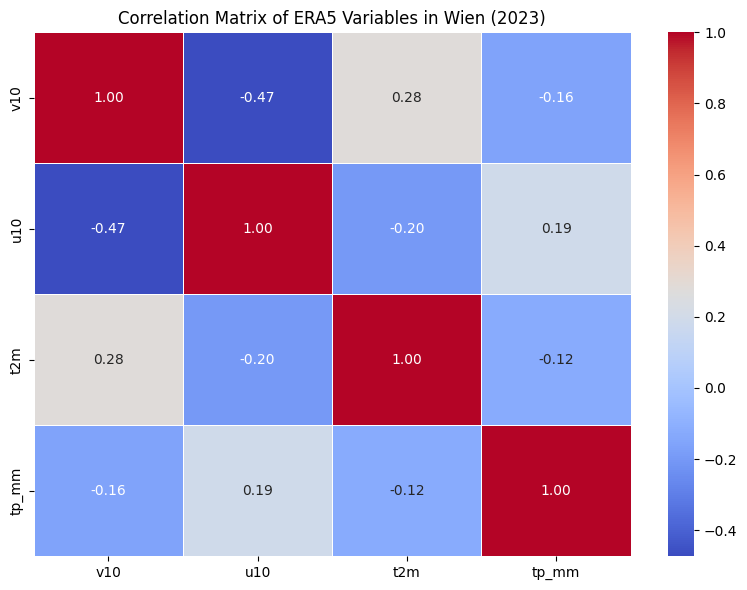

In [8]:
df_for_corr = pd.DataFrame({ "v10": sg_series["v10"].to_pandas(), "u10": sg_series["u10"].to_pandas(), "t2m": sg_series["t2m_celsius"].to_pandas(), "tp_mm": sg_series["tp_mm"].to_pandas(), })

correlation_matrix = df_for_corr.corr(method="pearson")

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title(f"Correlation Matrix of ERA5 Variables in {region_name} ({TARGET_YEAR})")
plt.tight_layout()
plt.show()

1. Wind Components: u10 vs v10 (–0.47)

	-	When the north–south (v10) flow strengthens in one direction, the east–west (u10) flow tends to weaken or reverse.
	-	This indicates directional shifts in the dominant wind regime, typical of Wien where weather alternates between:
	-	Atlantic westerlies (positive u10),
	-	Continental northerlies/southerlies (positive/negative v10).

This confirms that wind direction is highly variable, reinforcing why using sin/cos encodings later in the notebook is essential.


2. Temperature vs Wind (t2m vs u10: –0.20, t2m vs v10: +0.28)

Temperature shows weak correlations with wind components — but the signs are meaningful:
	-	t2m vs u10 (–0.20):
Stronger west–east winds tend to slightly reduce temperatures, consistent with:
	-	frontal passages,
	-	increased ventilation,
	-	and cool advection.
	-	t2m vs v10 (+0.28):
Warm periods in Wien often coincide with southerly flows (positive v10) bringing warm continental air.

This asymmetry hints at direction-dependent thermal advection, which is a realistic regional climatological behavior.


3. Temperature vs Precipitation (–0.12)

The weak negative correlation reflects that:
	-	Rainy days are slightly cooler,
	-	Hot days are generally dry, especially during summer blocking events.

This relationship is weak because precipitation is episodic, while temperature has strong seasonal structure.


4. Wind vs Precipitation (|corr| < 0.2)

Both u10 and v10 components show very weak correlations with precipitation.
This is expected because:
	-	Frontal systems (windy and rainy) alternate with dry, windy advections,
	-	And Wien experiences localized convective precipitation, which is not strongly tied to large-scale winds.

This reinforces the idea that precipitation is not a strong driver of ΔT in the UHI context.


## 5. Sentinel-2 NDVI Data

Load the Sentinel-2 NDVI GeoTIFF file for vegetation analysis:

- Values range from -1 (water) to +1 (dense vegetation)
- High-resolution vegetation structure
- Reveals parks, forests, and low-vegetation urban surfaces
- Enables **urban vs rural land-cover classification**

In [9]:
ndvi_files = sorted(glob.glob(f"{SENTINEL2_NDVI_PATH}/*.tif", recursive=False))

ndvi_path = ndvi_files[0]
print(f"\nFound {len(ndvi_files)} NDVI file(s).")
print(f"Using: {Path(ndvi_path).name}")

# nvdi conversion
def convert_ndvi(ndvi, nodata=255):
    ndvi = ndvi.astype("float32")
    ndvi[ndvi == nodata] = np.nan
    return ndvi * (2.0 / 254.0) - 1.0   # map [0,254] → [-1,1]

with rasterio.open(ndvi_path) as src:

    roi_proj = STUDY_REGION.to_crs(src.crs)
    geom = [g for g in roi_proj.geometry]
    out, transform = rasterio.mask.mask(src, geom, crop=True, all_touched=False)
    ndvi_scaled = convert_ndvi(out[0], nodata=src.meta.get("nodata", 255))

valid = ndvi_scaled[~np.isnan(ndvi_scaled)]

print(f"Shape: {ndvi_scaled.shape}")
print(f"Valid pixels: {valid.size:,}")
print(f"Nodata pixels: {np.isnan(ndvi_scaled).sum():,}")
print("\nNDVI Statistics:")
pd.DataFrame(valid).describe()


Found 16 NDVI file(s).
Using: ndvi_2019-12-01_2020-03-01.tif
Shape: (292, 373)
Valid pixels: 64,844
Nodata pixels: 44,072

NDVI Statistics:


,0
count,64844.000000
mean,0.316035
std,0.179604
min,-0.748031
25%,0.196850
50%,0.354331
75%,0.440945
max,0.842520


---
## 6. Sentinel-3 NDVI Data

- High temporal frequency
- Captures **seasonal vegetation dynamics** across the year
- Complements Sentinel-2 with strong temporal detail

In [10]:
s3_files = sorted(glob.glob(f"{SENTINEL3_NDVI_DIR}/SENTINEL3_OLCI_Europe_NDVI_*.tif"))

s3_path = s3_files[0]
print(f"Found {len(s3_files)} file(s). Using: {Path(s3_path).name}")

def convert_s3(ndvi, nodata):
    ndvi = ndvi.astype("float32")
    ndvi[ndvi == nodata] = np.nan
    return ndvi / 255 * 2 - 1  # map [0,255] → [-1,1]

with rasterio.open(s3_path) as src:
    print(f"\nSource CRS: {src.crs}")
    print(f"Image shape: {src.shape}")
    print(f"NoData: {src.nodata}")

    roi = STUDY_REGION.to_crs(src.crs)
    geoms = [geom for geom in roi.geometry]
    clipped, transform = rasterio_mask(src, geoms, crop=True)
    ndvi_s3 = convert_s3(clipped[0], src.nodata)

s3_valid = ndvi_s3[~np.isnan(ndvi_s3)]

print("\n Sentinel-3 NDVI loaded & clipped")
print(f"Clipped shape: {ndvi_s3.shape}")
print(f"Valid pixels: {len(s3_valid):,}")
print(f"NoData pixels: {np.isnan(ndvi_s3).sum():,}")

print("\nNDVI Statistics:")
pd.DataFrame(s3_valid).describe()

Found 156 file(s). Using: SENTINEL3_OLCI_Europe_NDVI_20200701.tif

Source CRS: EPSG:4326
Image shape: (14449, 23185)
NoData: 255.0

 Sentinel-3 NDVI loaded & clipped
Clipped shape: (70, 134)
Valid pixels: 5,664
NoData pixels: 3,716

NDVI Statistics:


,0
count,5664.000000
mean,0.196044
std,0.405971
min,-0.788235
25%,-0.098039
50%,0.137255
75%,0.482353
max,0.960784



## 7. ECA&D Station Data (TX - Daily Maximum Temperature)

The European Climate Assessment & Dataset (ECA&D) station observations for daily maximum temperature:
- Ground-truth temperature observations
- Essential to validate ERA5 and detect systematic biases



In [11]:
stations_filepath = f"{ECAD_TX_DIR}/stations.txt"


def dms_to_decimal(dms):
    sign = 1 if dms[0] == '+' else -1
    d, m, s = map(float, dms[1:].split(':'))
    return sign * (d + m / 60 + s / 3600)


df = pd.read_csv(stations_filepath, skiprows=17, skipinitialspace=True)
df.columns = df.columns.str.strip().str.upper()

# Convert DMS → decimal degrees
df["LAT_DEC"] = df["LAT"].apply(dms_to_decimal)
df["LON_DEC"] = df["LON"].apply(dms_to_decimal)

#build the geodtaframe
stations_gdf = gpd.GeoDataFrame(df.drop(columns=["LAT", "LON"]),
                                geometry=gpd.points_from_xy(df["LON_DEC"], df["LAT_DEC"]), crs="EPSG:4326").rename(
    columns={"LAT_DEC": "lat", "LON_DEC": "lon"})

stations_gdf.head()

,STAID,STANAME,CN,HGHT,lat,lon,geometry
0,1,VAEXJOE,SE,166,56.866667,14.800000,POINT (14.8 56.86667)
1,2,FALUN,SE,160,60.616667,15.616667,POINT (15.61667 60.61667)
2,3,STENSELE,SE,325,65.066667,17.166389,POINT (17.16639 65.06667)
3,4,LINKOEPING,SE,93,58.400000,15.533056,POINT (15.53306 58.4)
4,5,LINKOEPING-MALMSLAETT,SE,93,58.400000,15.533056,POINT (15.53306 58.4)


___
# Week 2 — UHI Visualization & Communication

## 1. Visualization of the NDVI2 distribution 
To better understand the vegetation structure across the city - Wien, we visualize the NDVI distribution. This cell generates both the NDVI histogram and cumulative curve, and displays the NDVI map to illustrate spatial patterns.



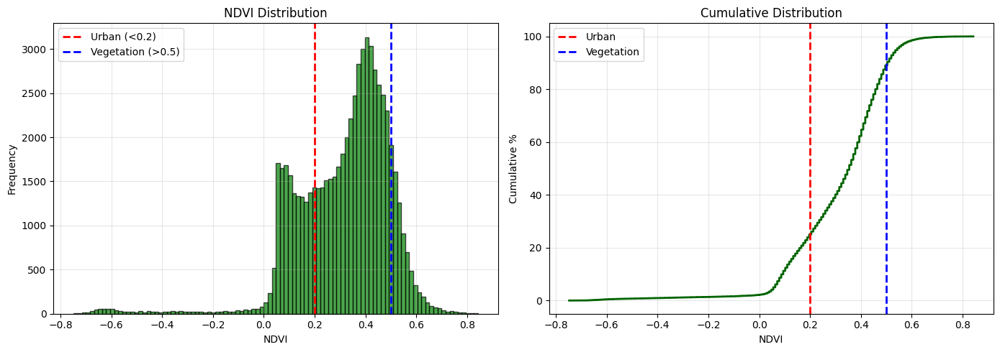

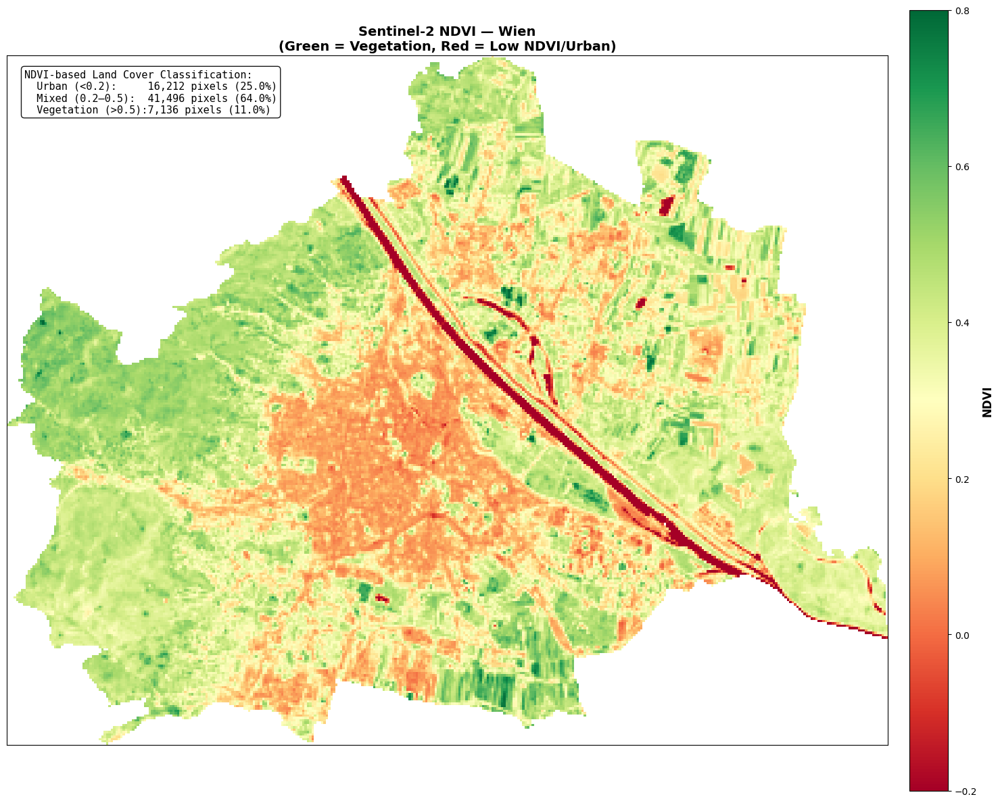

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
axes[0].hist(valid, bins=100, color='green', alpha=0.7, edgecolor='black')
for thr, col, label in [(0.2, "red", "Urban (<0.2)"),
                        (0.5, "blue", "Vegetation (>0.5)")]:
    axes[0].axvline(thr, color=col, linestyle='--', linewidth=2, label=label)

axes[0].set(title="NDVI Distribution", xlabel="NDVI", ylabel="Frequency")
axes[0].legend(); axes[0].grid(alpha=0.3)

# Cumulative distribution
sorted_vals = np.sort(valid)
cum = np.linspace(0, 100, len(sorted_vals))

axes[1].plot(sorted_vals, cum, color='darkgreen', linewidth=2)
for thr, col, label in [(0.2, "red", "Urban"), (0.5, "blue", "Vegetation")]:
    axes[1].axvline(thr, color=col, linestyle='--', linewidth=2, label=label)

axes[1].set(title="Cumulative Distribution", xlabel="NDVI", ylabel="Cumulative %")
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# NDVI-Based Land Cover
urban = (valid < 0.2).sum()
veg = (valid > 0.5).sum()
mixed = len(valid) - urban - veg
tot = len(valid)

fig, ax = plt.subplots(figsize=(16, 12))

im = ax.imshow(ndvi_scaled, cmap="RdYlGn", vmin=-0.2, vmax=0.8)
cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label("NDVI", fontsize=12, fontweight="bold")

ax.set_title(f"Sentinel-2 NDVI — {STUDY_REGION['NAME_1'].iloc[0]}\n" "(Green = Vegetation, Red = Low NDVI/Urban)", fontsize=14, fontweight='bold')
ax.set_xticks([]); ax.set_yticks([])
text = (
    f"NDVI-based Land Cover Classification:\n"
    f"  Urban (<0.2):     {urban:,} pixels ({urban/tot*100:.1f}%)\n"
    f"  Mixed (0.2–0.5):  {mixed:,} pixels ({mixed/tot*100:.1f}%)\n"
    f"  Vegetation (>0.5):{veg:,} pixels ({veg/tot*100:.1f}%)"
)
ax.text(0.02, 0.98, text, transform=ax.transAxes, fontsize=11, va="top", family="monospace", bbox=dict(boxstyle="round", facecolor="white", alpha=0.9))

plt.tight_layout()
plt.show()

The histogram and cumulative curve show how NDVI values are distributed, with most pixels falling in mid-to-high NDVI ranges.  
The map reveals the spatial pattern: greener areas appear around parks and the urban fringe, while lower NDVI values correspond to denser built-up zones.





## 2. Temporal vegetation dynamics 
These dynamics provide crucial insights into Urban Heat Island patterns and seasonal variations.




/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1958729887.py:12: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  COMP_GDF = gpd.GeoDataFrame(geometry=[ring.unary_union], crs=3857).to_crs(4326)


City area: 933.7 km²
Rural area: 6946.1 km²
Processing Sentinel-3 NDVI time series...


Processing Sentinel-3: 100%|██████████| 156/156 [02:50<00:00,  1.09s/it]



NDVI TIME SERIES:
  City (Wien): 36 dates
  Rural Ring (Wien + 30 km ring): 36 dates


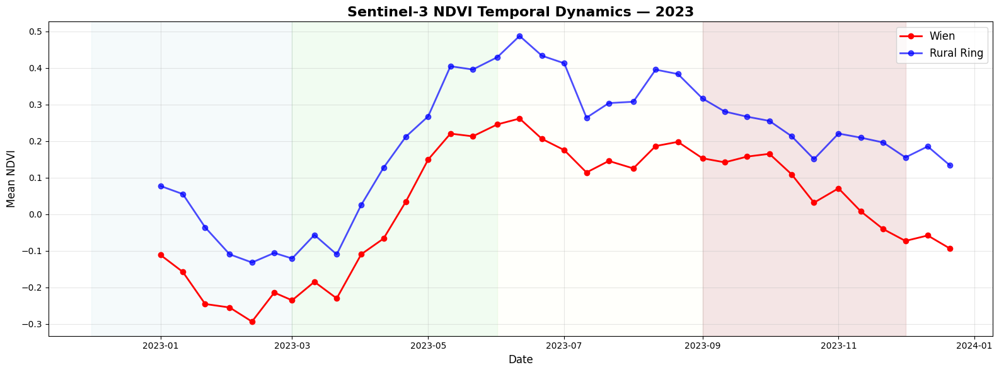


Seasonal NDVI Statistics (2023):
  City  — Min: -0.293, Max: 0.262, Mean: 0.021
  Rural — Min: -0.132, Max: 0.488, Mean: 0.192


In [13]:
RURAL_RING = 30   # ring width in km

# some geometry fixes :

one_city = STUDY_REGION.copy().to_crs(4326)
one_city = one_city.set_geometry(one_city.buffer(0))

city_3857 = one_city.to_crs(3857).buffer(0)
outer = city_3857.buffer(RURAL_RING * 1000)
ring = outer.difference(city_3857)

COMP_GDF = gpd.GeoDataFrame(geometry=[ring.unary_union], crs=3857).to_crs(4326)
COMP_LABEL = f"{STUDY_REGION['NAME_1'].iloc[0]} + {RURAL_RING} km ring"

print(f"City area: {one_city.to_crs(3857).area.sum() / 1e6:.1f} km²")
print(f"Rural area: {COMP_GDF.to_crs(3857).area.sum() / 1e6:.1f} km²")

# time series
ts_city = {}
ts_ring = {}

print("Processing Sentinel-3 NDVI time series...")

for f in tqdm(s3_files, desc="Processing Sentinel-3"):
    date = pd.to_datetime(Path(f).stem.split("_")[-1])
    if date.year != TARGET_YEAR:
        continue

    with rasterio.open(f) as src:
        city_geom = one_city.to_crs(src.crs).geometry
        ring_geom = COMP_GDF.to_crs(src.crs).geometry

        city_clip, _ = rasterio_mask(src, list(city_geom), crop=True)
        ring_clip, _ = rasterio_mask(src, list(ring_geom), crop=True)

        ndvi_city = convert_s3(city_clip[0], src.meta.get("nodata", 255))
        ndvi_ring = convert_s3(ring_clip[0], src.meta.get("nodata", 255))

        ts_city[date] = np.nanmean(ndvi_city)
        ts_ring[date] = np.nanmean(ndvi_ring)

ts_city = pd.Series(ts_city).sort_index()
ts_ring = pd.Series(ts_ring).sort_index()

print(f"\nNDVI TIME SERIES:")
print(f"  City ({STUDY_REGION['NAME_1'].iloc[0]}): {len(ts_city)} dates")
print(f"  Rural Ring ({COMP_LABEL}): {len(ts_ring)} dates")

# plot
fig, ax = plt.subplots(figsize=(16, 6))

ax.plot(ts_city.index, ts_city.values, "o-", color="red", label=STUDY_REGION["NAME_1"].iloc[0], linewidth=2, markersize=6)

ax.plot(ts_ring.index, ts_ring.values, "o-", color="blue", label="Rural Ring", linewidth=2, markersize=6, alpha=0.7)

ax.set_title(f"Sentinel-3 NDVI Temporal Dynamics — {TARGET_YEAR}", fontsize=16, fontweight="bold")
ax.set_xlabel("Date", fontsize=12)
ax.set_ylabel("Mean NDVI", fontsize=12)

ax.grid(True, alpha=0.3)
ax.legend(fontsize=12)

year = TARGET_YEAR

# Winter: Dec → Mar
ax.axvspan(pd.Timestamp(f"{year-1}-12-01"), pd.Timestamp(f"{year}-03-01"), alpha=0.12, color="lightblue", label="Winter")
# Spring: Mar → Jun
ax.axvspan(pd.Timestamp(f"{year}-03-01"), pd.Timestamp(f"{year}-06-01"), alpha=0.12, color="lightgreen", label="Spring")
# Summer: Jun → Sep
ax.axvspan(pd.Timestamp(f"{year}-06-01"), pd.Timestamp(f"{year}-09-01"), alpha=0.12, color="lightyellow", label="Summer")
# Autumn: Sep → Dec
ax.axvspan(pd.Timestamp(f"{year}-09-01"), pd.Timestamp(f"{year}-12-01"), alpha=0.12, color="brown", label="Autumn")

plt.tight_layout()
plt.show()

print(f"\nSeasonal NDVI Statistics ({TARGET_YEAR}):")
print(f"  City  — Min: {ts_city.min():.3f}, Max: {ts_city.max():.3f}, Mean: {ts_city.mean():.3f}")
print(f"  Rural — Min: {ts_ring.min():.3f}, Max: {ts_ring.max():.3f}, Mean: {ts_ring.mean():.3f}")


**Observed Patterns**:

Sentinel-3 NDVI time-series for the city and surrounding ring reveal:

- Low NDVI in winter due to vegetation dormancy
- Rapid increase during spring green-up
- Peak greenness in summer
- Decline during autumn

Urban NDVI remains **consistently lower** across all seasons, indicating reduced evaporative cooling capacity and higher susceptibility to heat accumulation.

This seasonal mapping helps explain **why UHI is strongest in summer**.




## 3. Side-by-side comparison of high-resolution Sentinel-2 and high-frequency Sentinel-3 NDVI 

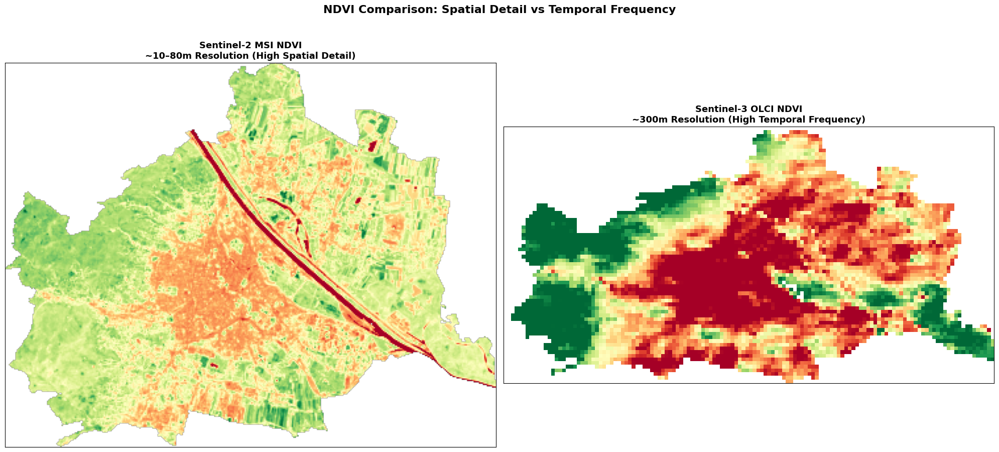

In [14]:
s3_data = globals()['ndvi_s3']

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].imshow(ndvi_scaled, cmap="RdYlGn", vmin=-0.2, vmax=0.8)
axes[0].set_title("Sentinel-2 MSI NDVI\n~10–80m Resolution (High Spatial Detail)", fontsize=13, fontweight="bold")
axes[0].set_xticks([]); axes[0].set_yticks([])

axes[1].imshow(s3_data, cmap="RdYlGn", vmin=-0.2, vmax=0.8)
axes[1].set_title("Sentinel-3 OLCI NDVI\n~300m Resolution (High Temporal Frequency)", fontsize=13, fontweight="bold")
axes[1].set_xticks([]); axes[1].set_yticks([])

plt.suptitle("NDVI Comparison: Spatial Detail vs Temporal Frequency", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

In this side-by-side view, we see the NDVI map of the city produced by two different satellite missions : 

The left panel shows Sentinel-2 NDVI at ~10–20 m resolution, revealing detailed spatial patterns such as parks, street-level vegetation, agricultural fields, and the built-up core. The road network, river corridor, and small green patches are clearly distinguishable.

The right panel shows Sentinel-3 NDVI at ~300 m resolution. At this coarser scale, individual neighbourhoods and small features disappear, and the vegetation pattern becomes more aggregated. Only broad spatial gradients remain visible, with large green areas and large low-NDVI areas replacing the fine structure seen in Sentinel-2.

This output visually demonstrates how spatial resolution influences the representation of vegetation in urban environments. Sentinel-2 captures fine-grained detail, while Sentinel-3 provides a more general overview suitable for regional-scale or temporal analyses.




## 4. Visualization of the temperature time series from the selected stations :



Region: Wien
 22 station(s) found
  IDs: [16, 23975, 24028, 24029, 24030, 24031, 24034, 24035, 24037, 24393] ...

Loaded 954,397 temperature values
  Stations: 22
  Date range: 1853-03-19 00:00:00 → 2025-06-10 00:00:00
  Temp range: -17.6 → 39.5 °C
  Records in 2023: 8,028


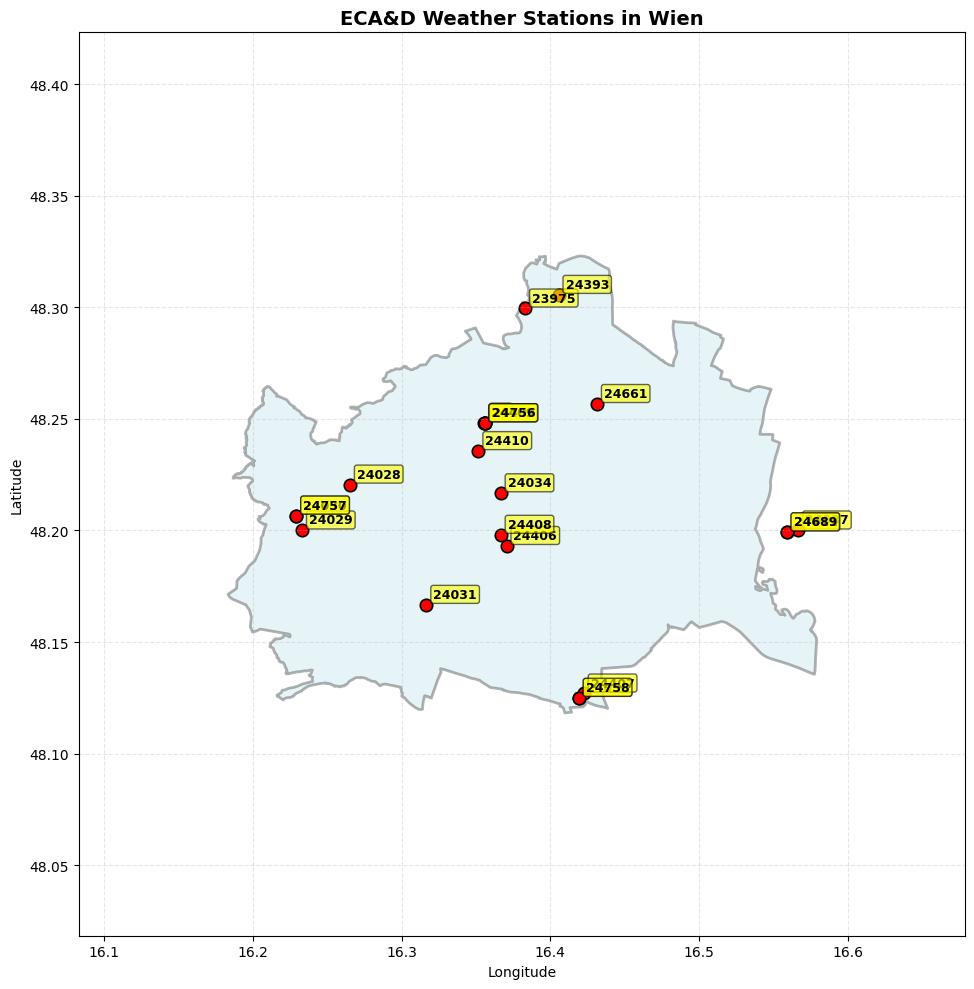

Station Time Series

Station 16 — WIEN-HOHE WARTE                             
  Records: 62,131
  Range: 1853-03-19 00:00:00 → 2025-06-10 00:00:00
  TX Range: -17.6 → 38.5 °C
  Mean: 14.1 °C

Station 24393 — WIEN/STAMMERSDORF                           
  Records: 62,131
  Range: 1853-03-19 00:00:00 → 2025-06-10 00:00:00
  TX Range: -17.6 → 38.8 °C
  Mean: 14.2 °C

Station 24756 — WIEN-HOHE WARTE                             
  Records: 62,131
  Range: 1853-03-19 00:00:00 → 2025-06-10 00:00:00
  TX Range: -17.6 → 38.5 °C
  Mean: 14.1 °C

Station 24410 — WIEN HOHE WARTE (MIT 21 UHR TERMINEN)       
  Records: 62,131
  Range: 1853-03-19 00:00:00 → 2025-06-10 00:00:00
  TX Range: -17.6 → 38.5 °C
  Mean: 14.1 °C

Station 24409 — WIEN-HOHE WARTE HANNHUETTE                  
  Records: 62,131
  Range: 1853-03-19 00:00:00 → 2025-06-10 00:00:00
  TX Range: -17.6 → 38.5 °C
  Mean: 13.9 °C


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1072563158.py:129: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly = plot_df.set_index("date")["tx_celsius"].resample("M").mean()
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1072563158.py:129: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly = plot_df.set_index("date")["tx_celsius"].resample("M").mean()
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1072563158.py:129: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly = plot_df.set_index("date")["tx_celsius"].resample("M").mean()
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1072563158.py:129: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly = plot_df.set_index("date")["tx_celsius

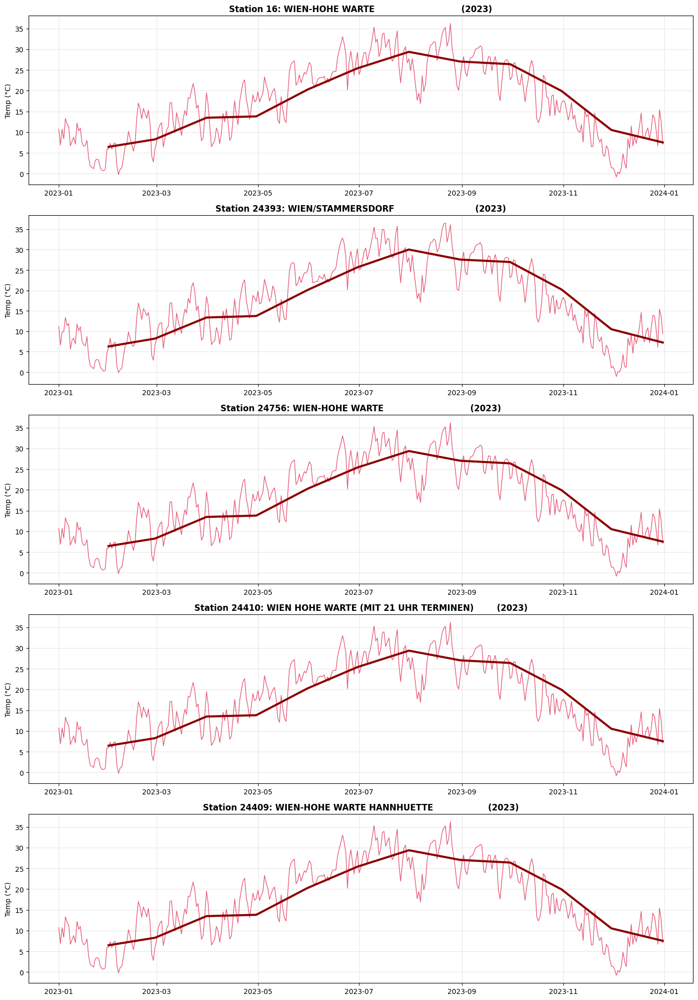

stations_in_city_gdf len = 22
      STAID                                          name    CN    LAT_DMS  \
15       16  WIEN-HOHE WARTE                               AT    +48:14:54   
5766  23975  WIEN-STREBERSDORF                             AT    +48:17:58   
5809  24028  WIEN-JUBILAEUMSWARTE                          AT    +48:13:14   
5810  24029  WIEN-MARIABRUNN                               AT    +48:12:00   
5811  24030  WIEN-MARIABRUNN                               AT    +48:12:24   

         LON_DMS  HGHT        lat        lon                   geometry  
15    +016:21:23   198  48.248333  16.356389  POINT (16.35639 48.24833)  
5766  +016:22:59   169  48.299444  16.383056  POINT (16.38306 48.29944)  
5809  +016:15:55   450  48.220556  16.265278  POINT (16.26528 48.22056)  
5810  +016:13:59   226  48.200000  16.233056      POINT (16.23306 48.2)  
5811  +016:13:45   225  48.206667  16.229167  POINT (16.22917 48.20667)  


In [15]:
stations_path = stations_filepath

stations_df = pd.read_csv(stations_path, skiprows=19, names=["STAID", "name", "CN", "LAT_DMS", "LON_DMS", "HGHT"],
                          encoding="utf-8", on_bad_lines="skip", engine="python", )


def dms_to_decimal_col(col):
    s = col.str.strip()
    sign = s.str[0].map({"+": 1, "-": -1}).fillna(1)
    s = s.str.lstrip("+-")
    parts = s.str.split(":", expand=True).astype(float)

    deg = parts[0]
    minutes = parts[1].fillna(0)
    secs = parts[2].fillna(0)

    return sign * (deg + minutes / 60 + secs / 3600)


stations_df["lat"] = dms_to_decimal_col(stations_df["LAT_DMS"])
stations_df["lon"] = dms_to_decimal_col(stations_df["LON_DMS"])

stations_df["STAID"] = pd.to_numeric(stations_df["STAID"], errors="coerce").astype("Int64")
stations_df = stations_df.dropna(subset=["STAID", "lat", "lon"])
stations_df["STAID"] = stations_df["STAID"].astype(int)

# Restrict to study region bounding box
roi = STUDY_REGION
roi_4326 = roi.to_crs(CRS_WGS84)
minx, miny, maxx, maxy = roi_4326.total_bounds

mask = ((stations_df["lon"] >= minx) & (stations_df["lon"] <= maxx) & (stations_df["lat"] >= miny) & (
            stations_df["lat"] <= maxy))

stations_in_city = stations_df[mask].copy()
stations_in_city_gdf = gpd.GeoDataFrame(stations_in_city,
                                        geometry=gpd.points_from_xy(stations_in_city["lon"], stations_in_city["lat"]),
                                        crs=CRS_WGS84, )

region_label = roi.iloc[0].get("NAME_1", "Selected region")
print(f"Region: {region_label}")
print(f" {len(stations_in_city_gdf)} station(s) found")
print("  IDs:", list(stations_in_city_gdf["STAID"].head(10)), "...")
station_ids = stations_in_city_gdf["STAID"].tolist()

# LOAD & CLEAN TX TEMPERATURE DATA
tx_records = []

for sid in station_ids:
    fp = ECAD_TX_DIR / f"TX_STAID{sid:06d}.txt"
    df = pd.read_csv(fp, skiprows=21, header=None, names=["STAID", "SOUID", "DATE", "TX", "Q_TX"], sep=",",
                     skipinitialspace=True, encoding="utf-8", on_bad_lines="skip", engine="python", )

    df = df[["STAID", "DATE", "TX", "Q_TX"]]
    df["STAID"] = sid

    df["DATE"] = pd.to_numeric(df["DATE"], errors="coerce")
    df = df.dropna(subset=["DATE"])

    tx_records.append(df)

# Merge all stations
tx_df = pd.concat(tx_records, ignore_index=True).dropna(subset=["DATE"])
tx_df["STAID"] = tx_df["STAID"].astype(int)
tx_df["DATE"] = tx_df["DATE"].astype(int)

# DATE → datetime
tx_df["date"] = pd.to_datetime(tx_df["DATE"].astype(str), format="%Y%m%d", errors="coerce")

# Remove missing/invalid TX and convert 0.1°C → °C
tx_df = tx_df[tx_df["TX"] != -9999].copy()
tx_df["tx_celsius"] = pd.to_numeric(tx_df["TX"], errors="coerce") / 10.0

tx_roi = tx_df.dropna(subset=["STAID", "date"])[["STAID", "date", "tx_celsius", "Q_TX"]]

print(f"\nLoaded {len(tx_roi):,} temperature values")
print(f"  Stations: {tx_roi['STAID'].nunique()}")
print(f"  Date range: {tx_roi['date'].min()} → {tx_roi['date'].max()}")
print(f"  Temp range: {tx_roi['tx_celsius'].min():.1f} → {tx_roi['tx_celsius'].max():.1f} °C")

tx_roi_year = tx_roi[tx_roi["date"].dt.year == TARGET_YEAR]
print(f"  Records in {TARGET_YEAR}: {len(tx_roi_year):,}")

# Map of stations
boundary_gdf = roi_4326
stations_plot = stations_in_city_gdf.to_crs(CRS_WGS84)

fig, ax = plt.subplots(figsize=(12, 10))
boundary_gdf.plot(ax=ax, facecolor="lightblue", edgecolor="black", alpha=0.3, linewidth=2)
stations_plot.plot(ax=ax, color="red", markersize=80, marker="o", edgecolor="black", linewidth=1.2)

for _, r in stations_plot.iterrows():
    ax.annotate(str(r["STAID"]), (r.geometry.x, r.geometry.y), xytext=(5, 5), textcoords="offset points", fontsize=9,
                weight="bold", bbox=dict(boxstyle="round,pad=0.2", fc="yellow", alpha=0.6), )

minx, miny, maxx, maxy = boundary_gdf.total_bounds
ax.set_xlim(minx - 0.1, maxx + 0.1)
ax.set_ylim(miny - 0.1, maxy + 0.1)

ax.set_title(f"ECA&D Weather Stations in {region_label}", fontsize=14, weight="bold")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(alpha=0.3, linestyle="--")

plt.tight_layout()
plt.show()

# TIME SERIES –  5 stations
print("=" * 60)
print("Station Time Series")
print("=" * 60)

top_ids = (tx_roi.groupby("STAID").size().sort_values(ascending=False).head(5).index.tolist())

fig, axes = plt.subplots(len(top_ids), 1, figsize=(14, 4 * len(top_ids)))
axes = np.atleast_1d(axes)

for ax, staid in zip(axes, top_ids):
    df_st = tx_roi[tx_roi["STAID"] == staid].sort_values("date")
    name = stations_plot.loc[stations_plot["STAID"] == staid, "name"].iloc[0]

    year_df = df_st[df_st["date"].dt.year == TARGET_YEAR]
    plot_df = year_df if not year_df.empty else df_st
    year_label = TARGET_YEAR if not year_df.empty else f"{df_st['date'].min().year}-{df_st['date'].max().year}"

    ax.plot(plot_df["date"], plot_df["tx_celsius"], lw=1, color="crimson", alpha=0.7)

    if len(plot_df) > 30:
        monthly = plot_df.set_index("date")["tx_celsius"].resample("M").mean()
        ax.plot(monthly.index, monthly.values, lw=3, color="darkred")

    ax.set_title(f"Station {staid}: {name} ({year_label})", fontsize=12, weight="bold")
    ax.set_ylabel("Temp (°C)")
    ax.grid(alpha=0.3)

    print(f"\nStation {staid} — {name}")
    print(f"  Records: {len(df_st):,}")
    print(f"  Range: {df_st['date'].min()} → {df_st['date'].max()}")
    print(f"  TX Range: {df_st['tx_celsius'].min():.1f} → {df_st['tx_celsius'].max():.1f} °C")
    print(f"  Mean: {df_st['tx_celsius'].mean():.1f} °C")

plt.tight_layout()
plt.show()

print("stations_in_city_gdf len =", len(stations_in_city_gdf))
print(stations_in_city_gdf.head())

The selected ECA&D stations around Vienna show highly consistent temperature behaviour throughout the year.  


Across all stations, the 2023 time series follow the same seasonal cycle : cold conditions in winter, a steady rise during spring, peak temperatures in July–August, and a gradual decline through autumn.

Despite being located in different parts of the city and surrounding areas, the stations display nearly identical seasonal curves, with only minor day-to-day variability. This strong similarity confirms that the regional temperature signal is stable and coherently captured by all stations.

The individual plots also highlight small differences in local conditions (e.g., slightly warmer or cooler days depending on elevation or micro-environment), but these do not affect the overall trend.

Overall, the station network provides a robust and consistent reference for validating ERA5 data and examining potential Urban Heat Island effects at the city scale.


___
# Week 3 — Metrics & Quantitative Analysis

## NDVI-Temperature Correlation

Comparison of NDVI time series with ERA5 temperature to explore the vegetation-UHI relationship.

Correlation (NDVI vs ERA5 Temp): 0.822


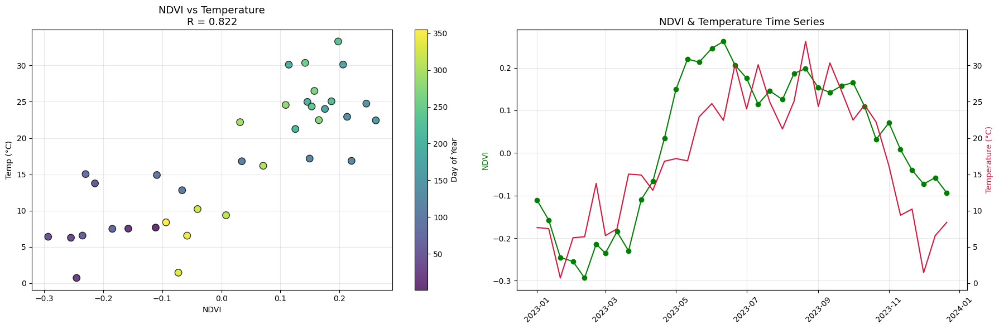

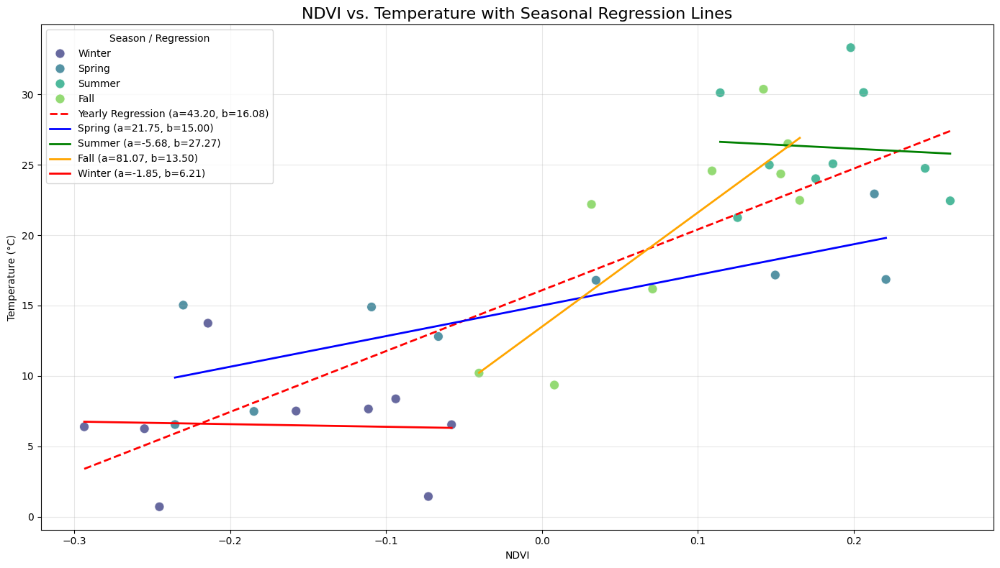

/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/3258047305.py:92: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=seasonal_corr.index, y=seasonal_corr.values, palette="coolwarm")


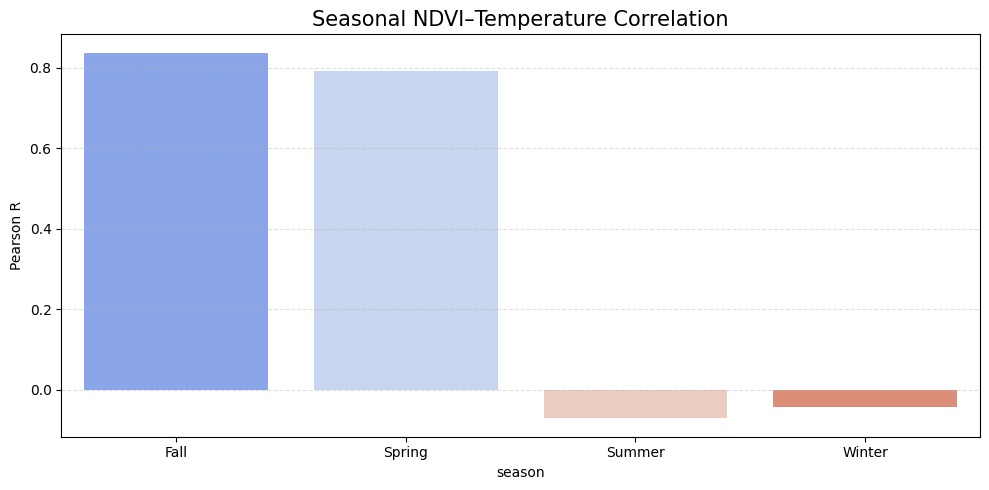

In [16]:
ndvi_df = ( ts_city.rename("ndvi") .reset_index() .rename(columns={"index": "date"}) )
ndvi_df["date"] = pd.to_datetime(ndvi_df["date"])

era_region = ds_all[["t2m_celsius"]].sel( longitude=slice(minx, maxx), latitude=slice(maxy, miny) )

era_daily = ( era_region["t2m_celsius"] .mean(("latitude", "longitude")) .to_dataframe() .reset_index() .rename(columns={"time": "date", "t2m_celsius": "temp"}) )
era_daily["date"] = pd.to_datetime(era_daily["date"])

merged = pd.merge_asof( ndvi_df.sort_values("date"), era_daily.sort_values("date"), on="date", direction="nearest", tolerance=pd.Timedelta(days=3) ).dropna()

corr = merged[["ndvi", "temp"]].corr().iloc[0, 1]
print(f"Correlation (NDVI vs ERA5 Temp): {corr:.3f}")


# plots :

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Scatter NDVI vs temp
sc = axes[0].scatter( merged["ndvi"], merged["temp"], c=merged["date"].dt.dayofyear, cmap="viridis", s=80, edgecolor="black", alpha=0.8 )
axes[0].set_title(f"NDVI vs Temperature\nR = {corr:.3f}", fontsize=13)
axes[0].set_xlabel("NDVI")
axes[0].set_ylabel("Temp (°C)")
axes[0].grid(alpha=0.3)
plt.colorbar(sc, ax=axes[0], label="Day of Year")

# Time series NDVI + Temperature
axes[1].plot(merged["date"], merged["ndvi"], "o-", color="green", label="NDVI")
ax2 = axes[1].twinx()
ax2.plot(merged["date"], merged["temp"], "-", color="crimson", label="Temp")

axes[1].set_title("NDVI & Temperature Time Series", fontsize=13)
axes[1].set_ylabel("NDVI", color="green")
ax2.set_ylabel("Temperature (°C)", color="crimson")
axes[1].grid(alpha=0.3)

for tick in axes[1].get_xticklabels():
    tick.set_rotation(45)

plt.tight_layout()
plt.show()


# Seasonal NDVI–Temp regression

season_map = {
    12: "Winter", 1: "Winter", 2: "Winter",
    3: "Spring", 4: "Spring", 5: "Spring",
    6: "Summer", 7: "Summer", 8: "Summer",
    9: "Fall",   10: "Fall",   11: "Fall"
}
merged["season"] = merged["date"].dt.month.map(season_map)

# ---- Yearly regression
year_coef = linregress(merged["ndvi"], merged["temp"])
a_year, b_year = year_coef.slope, year_coef.intercept

# ---- Seasonal regressions
seasonal_lines = {}
for season in ["Spring", "Summer", "Fall", "Winter"]:
    df_s = merged[merged["season"] == season]
    if len(df_s) >= 3:
        coef = linregress(df_s["ndvi"], df_s["temp"])
        seasonal_lines[season] = (coef.slope, coef.intercept, df_s["ndvi"].min(), df_s["ndvi"].max())

# Plotting again aaaaaaah
plt.figure(figsize=(14, 8))
sns.scatterplot( data=merged, x="ndvi", y="temp", hue="season", palette="viridis", s=90, alpha=0.8, edgecolor="white" )

# Yearly regression line
ndvi_min, ndvi_max = merged["ndvi"].min(), merged["ndvi"].max()
plt.plot( [ndvi_min, ndvi_max], [a_year*ndvi_min + b_year, a_year*ndvi_max + b_year], "r--", linewidth=2, label=f"Yearly Regression (a={a_year:.2f}, b={b_year:.2f})" )

# Seasonal lines
colors = {"Spring": "blue", "Summer": "green", "Fall": "orange", "Winter": "red"}
for season, (a, b, x0, x1) in seasonal_lines.items():
    plt.plot( [x0, x1], [a*x0 + b, a*x1 + b], color=colors[season], linewidth=2, label=f"{season} (a={a:.2f}, b={b:.2f})" )

plt.title("NDVI vs. Temperature with Seasonal Regression Lines", fontsize=16)
plt.xlabel("NDVI")
plt.ylabel("Temperature (°C)")
plt.grid(alpha=0.3)
plt.legend(title="Season / Regression", fontsize=10)
plt.tight_layout()
plt.show()


# Seasonal correlation
seasonal_corr = ( merged.groupby("season")[["ndvi", "temp"]] .corr() .unstack() .iloc[:, 1] )

plt.figure(figsize=(10, 5))
sns.barplot(x=seasonal_corr.index, y=seasonal_corr.values, palette="coolwarm")
plt.title("Seasonal NDVI–Temperature Correlation", fontsize=15)
plt.ylabel("Pearson R")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

These results show a strong overall relationship between vegetation (NDVI) and temperature, with a yearly correlation of about 0.82.  
However, the seasonal breakdown reveals that this link is not constant throughout the year.

During spring and fall, the correlation is high, indicating that temperature and vegetation tend to increase or decrease together in these transition seasons. In contrast, summer shows almost no correlation, and winter even displays a weak negative relationship.  

This makes sense because NDVI saturates in mid-summer (vegetation is already fully developed) and remains very low in winter (vegetation dormant), so temperature changes are no longer reflected in NDVI values. The seasonal regression lines confirm this behaviour: the slope is steep in spring and fall but nearly flat in summer and winter.  

Overall, the analysis highlights that NDVI is a good proxy for temperature only when vegetation is actively growing or declining, but much less informative during seasonal extremes.

Although vegetation has a strong cooling effect through evapotranspiration, the NDVI–temperature correlation drops in summer because NDVI reaches a saturation plateau. 
When NDVI becomes almost constant across the city, it no longer captures differences in vegetation density or activity. 

Temperature still varies in summer due to atmospheric conditions, but NDVI cannot explain these variations because it does not change.


### Temperature Difference (Urban - 30 km Region)

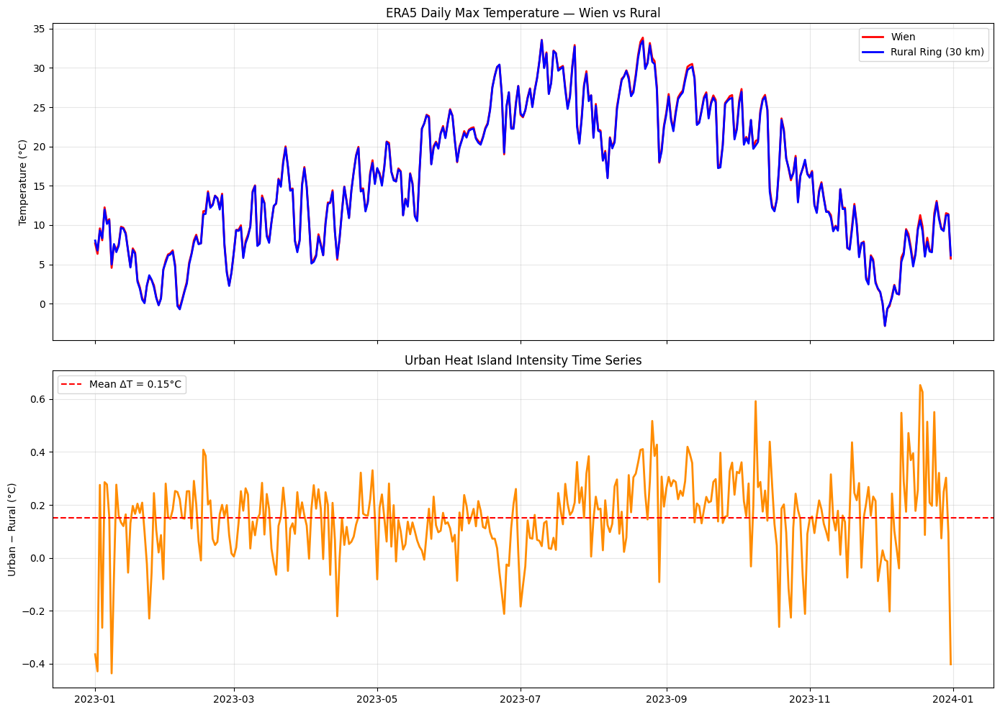


--- Computing UHI for rings: [10, 20, 30, 40, 50] km ---


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:47: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:47: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:47: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:47: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_al


--- Plotting Temperature Differences for all Rural Rings ---


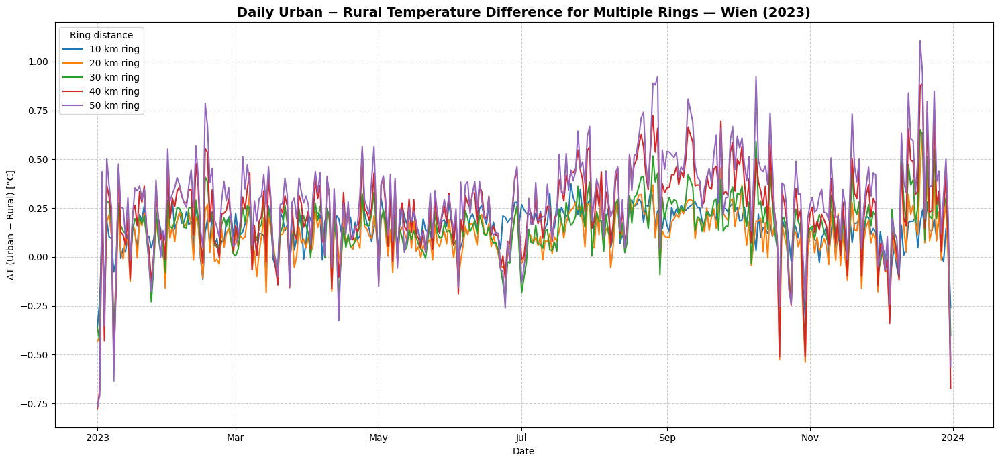


--- Summarizing Seasonal Temperature Differences for all Rings ---
season   Fall  Spring  Summer  Winter
ring                                 
10 km   0.151   0.145   0.202   0.095
20 km   0.116   0.090   0.130   0.084
30 km   0.188   0.124   0.149   0.145
40 km   0.278   0.185   0.277   0.185
50 km   0.367   0.225   0.309   0.257


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:97: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_seasonal_diff_df = ( seasonal_diffs.groupby(["ring", "season"])["difference"] .mean() .unstack(level="season") )


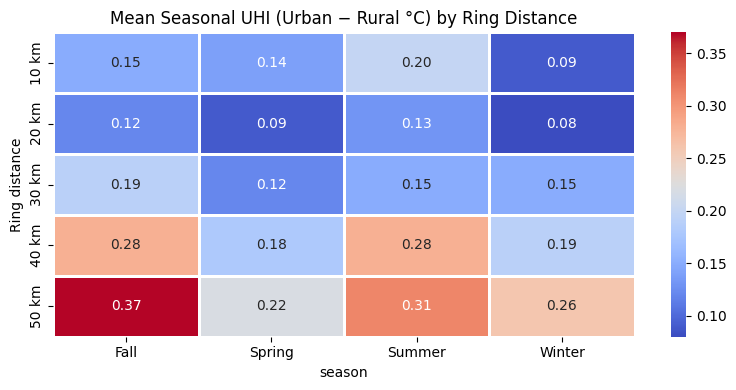


--- Fitting models: ΔT vs distance (Summer) with MANY distances ---
Computing UHI for 48 distances...


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:127: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:127: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:127: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/4006366765.py:127: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'unio

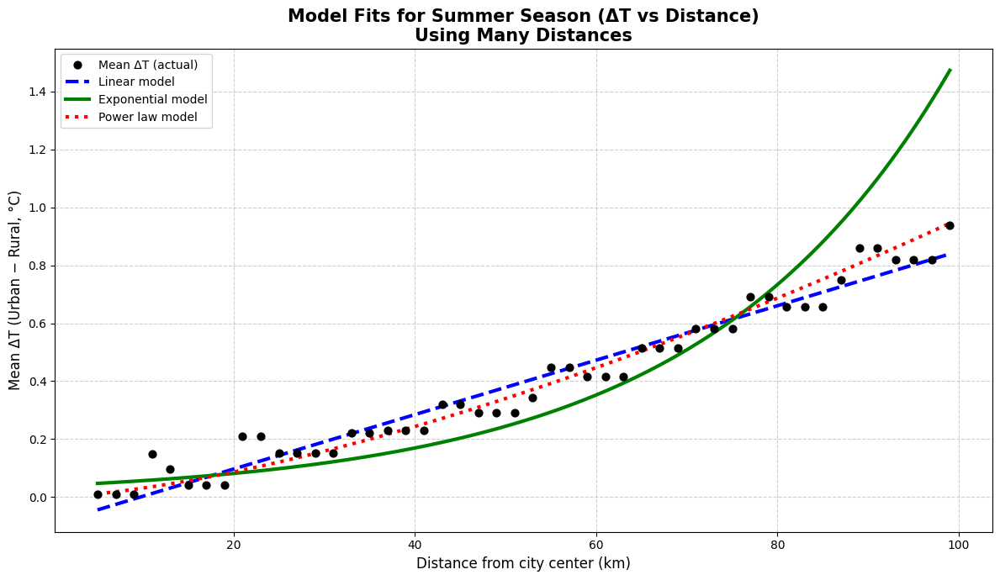


 Model Comparison (Summer) 
Linear R²:        0.9581
Exponential R²*:  0.7575  (log scale)
Power-law R²*:    0.9007  (log scale)


In [17]:
xmin_c, ymin_c, xmax_c, ymax_c = STUDY_REGION.total_bounds
xmin_r, ymin_r, xmax_r, ymax_r = COMP_GDF.total_bounds

ds_city = ds_all.sel(longitude=slice(xmin_c, xmax_c), latitude=slice(ymax_c, ymin_c))
ds_ring = ds_all.sel(longitude=slice(xmin_r, xmax_r), latitude=slice(ymax_r, ymin_r))

# time series
city_series = ds_city["t2m_celsius"].mean(["latitude", "longitude"]).compute()
ring_series = ds_ring["t2m_celsius"].mean(["latitude", "longitude"]).compute()

temp_diff = city_series - ring_series
mean_dt = float(temp_diff.mean().values)

fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Urban vs rural temperature
axes[0].plot(city_series["time"], city_series, label=region_name, color="red", linewidth=2)
axes[0].plot(ring_series["time"], ring_series, label=f"Rural Ring ({RURAL_RING} km)", color="blue", linewidth=2)
axes[0].set_ylabel("Temperature (°C)")
axes[0].set_title(f"ERA5 Daily Max Temperature — {region_name} vs Rural")
axes[0].grid(alpha=0.3)
axes[0].legend()

# ΔT = urban - rural
axes[1].plot(temp_diff["time"], temp_diff, color="darkorange", linewidth=2)
axes[1].axhline(mean_dt, color="red", linestyle="--", label=f"Mean ΔT = {mean_dt:.2f}°C")
axes[1].set_ylabel("Urban − Rural (°C)")
axes[1].set_title("Urban Heat Island Intensity Time Series")
axes[1].grid(alpha=0.3)
axes[1].legend()

plt.tight_layout()
plt.show()

# time series for multiple rings

RING_DISTANCES = [10, 20, 30, 40, 50]  # km
temp_diffs_per_ring = {}

print("\n--- Computing UHI for rings:", RING_DISTANCES, "km ---")

for dist in RING_DISTANCES:
    # Build ring in metric CRS
    city_m = STUDY_REGION.to_crs(CRS_METRIC)
    outer = city_m.buffer(dist * 1000)           # outer buffer
    ring = outer.difference(city_m)              # ring = outer − city
    ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)

    xmin, ymin, xmax, ymax = ring_gdf.total_bounds
    ds_ring_d = ds_all["t2m_celsius"].sel( longitude=slice(xmin, xmax), latitude=slice(ymax, ymin), )

    ring_temp_d = ds_ring_d.mean(["latitude", "longitude"]).compute()

    # Time-series ΔT(d, t) = city − ring_d
    temp_diffs_per_ring[dist] = (city_series - ring_temp_d).rename(f"UHI_{dist}km")

# ---- plot time series for all rings ----
print("\n--- Plotting Temperature Differences for all Rural Rings ---")
fig, ax = plt.subplots(figsize=(15, 7))

for distance_km, temp_diff_series in temp_diffs_per_ring.items():
    temp_diff_series.plot(ax=ax, label=f"{distance_km} km ring", lw=1.5)

ax.set_title( f"Daily Urban − Rural Temperature Difference for Multiple Rings — {region_name} ({TARGET_YEAR})", fontsize=14, fontweight="bold" )
ax.set_xlabel("Date")
ax.set_ylabel("ΔT (Urban − Rural) [°C]")
ax.grid(True, linestyle="--", alpha=0.6)
ax.legend(title="Ring distance")

plt.tight_layout()
plt.show()

# seasonal summaries

print("\n--- Summarizing Seasonal Temperature Differences for all Rings ---")

season_map = {
    12: "Winter", 1: "Winter", 2: "Winter",
    3: "Spring", 4: "Spring", 5: "Spring",
    6: "Summer", 7: "Summer", 8: "Summer",
    9: "Fall", 10: "Fall", 11: "Fall",
}

seasonal_diffs = []

for distance_km, temp_diff_series in temp_diffs_per_ring.items():
    df_temp = temp_diff_series.to_pandas().to_frame(name="difference")
    df_temp["date"] = df_temp.index
    df_temp["season"] = df_temp["date"].dt.month.map(season_map).astype("category")
    df_temp["distance_km"] = distance_km
    df_temp["ring"] = f"{distance_km} km"
    seasonal_diffs.append(df_temp)

seasonal_diffs = pd.concat(seasonal_diffs)

# Mean ΔT per ring & season
mean_seasonal_diff_df = ( seasonal_diffs.groupby(["ring", "season"])["difference"] .mean() .unstack(level="season") )

ordered_seasons = pd.CategoricalDtype( ["Spring", "Summer", "Fall", "Winter"], ordered=True )
mean_seasonal_diff_df = mean_seasonal_diff_df[ mean_seasonal_diff_df.columns.astype(ordered_seasons) ]

print(mean_seasonal_diff_df.round(3))

# Heatmap
plt.figure(figsize=(8, 4))
sns.heatmap( mean_seasonal_diff_df.round(2), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.8 )
plt.title("Mean Seasonal UHI (Urban − Rural °C) by Ring Distance")
plt.ylabel("Ring distance")
plt.tight_layout()
plt.show()

# model fitting with many distances

print("\n--- Fitting models: ΔT vs distance (Summer) with MANY distances ---")

RING_DISTANCES_FINE = list(range(5, 101, 2))

temp_diffs_fine = []

city_m = STUDY_REGION.to_crs(CRS_METRIC)

print(f"Computing UHI for {len(RING_DISTANCES_FINE)} distances...")

for dist in RING_DISTANCES_FINE:
    outer = city_m.buffer(dist * 1000)
    ring = outer.difference(city_m)
    ring_gdf = gpd.GeoDataFrame( geometry=[ring.unary_union], crs=CRS_METRIC ).to_crs(CRS_WGS84)

    xmin, ymin, xmax, ymax = ring_gdf.total_bounds
    ds_ring_d = ds_all["t2m_celsius"].sel( longitude=slice(xmin, xmax), latitude=slice(ymax, ymin) )

    ring_temp_d = ds_ring_d.mean(["latitude", "longitude"]).compute()

    # mean ΔT(d)
    dt_mean = float((city_series - ring_temp_d).mean().values)

    temp_diffs_fine.append({"distance": dist, "deltaT": dt_mean})

temp_diffs_fine = pd.DataFrame(temp_diffs_fine)

# fit models
X = temp_diffs_fine[['distance']].values
y = temp_diffs_fine['deltaT'].values

# --- Linear Model
lin_model = LinearRegression().fit(X, y)
y_lin = lin_model.predict(X)

# --- Exponential: y = a exp(b x)
mask_pos = y > 0
X_pos = X[mask_pos]
y_pos = y[mask_pos]
logy = np.log(y_pos)

exp_model = LinearRegression().fit(X_pos, logy)
b_exp = exp_model.coef_[0]
a_exp = np.exp(exp_model.intercept_)

x_curve = np.linspace(X.min(), X.max(), 500).reshape(-1,1)
y_exp_curve = a_exp * np.exp(b_exp * x_curve)

# --- Power law: y = a x^b
logX = np.log(X_pos)
logyP = np.log(y_pos)
pow_model = LinearRegression().fit(logX, logyP)
b_pow = pow_model.coef_[0]
a_pow = np.exp(pow_model.intercept_)

y_pow_curve = a_pow * (x_curve ** b_pow)

# plot
plt.figure(figsize=(12, 7))

plt.scatter( temp_diffs_fine['distance'], temp_diffs_fine['deltaT'], color="black", s=40, label="Mean ΔT (actual)", zorder=5 )

plt.plot(X, y_lin, "--", lw=3, color="blue",  label="Linear model")
plt.plot(x_curve, y_exp_curve, "-", lw=3, color="green", label="Exponential model")
plt.plot(x_curve, y_pow_curve, ":", lw=3, color="red", label="Power law model")

plt.title("Model Fits for Summer Season (ΔT vs Distance)\nUsing Many Distances", fontsize=15, fontweight="bold")
plt.xlabel("Distance from city center (km)", fontsize=12)
plt.ylabel("Mean ΔT (Urban − Rural, °C)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

# Print R² for comparison
r2_lin = lin_model.score(X, y)
r2_exp = exp_model.score(X_pos, logy)     # on log scale
r2_pow = pow_model.score(logX, logyP)     # on log scale

print("\n Model Comparison (Summer) ")
print(f"Linear R²:        {r2_lin:.4f}")
print(f"Exponential R²*:  {r2_exp:.4f}  (log scale)")
print(f"Power-law R²*:    {r2_pow:.4f}  (log scale)")

These results show how the Urban Heat Island (UHI) intensity evolves over time and how it depends on the distance from the city center.

At the daily scale, Vienna is consistently warmer than the surrounding rural areas, with an average UHI of about 0.15°C in 2023. Although the day-to-day variability is large, the urban–rural difference remains positive most of the year, confirming a persistent UHI effect.

When the analysis is extended to multiple ring distances (10–50 km), the temperature difference increases with distance. Inner rural zones (10–20 km) show only a small contrast with the city, while areas farther away (40–50 km) display a stronger UHI signal, especially in fall and summer. This indicates that the thermal contrast becomes more pronounced as we compare Vienna to more distant and less urbanized environments.

The seasonal heatmap highlights that UHI intensity is not uniform across the year: it is largest in summer and fall, where the city retains more heat than the countryside, and weakest in winter. This seasonal pattern is typical for temperate cities.

Finally, the distance–UHI curve fitted with three models shows that the relationship is strongly linear (R² ≈ 0.96), while exponential and power-law models fit less well. A linear increase of UHI with distance suggests a gradual, continuous transition from dense urban fabric toward rural landscapes, rather than a sudden threshold.


##  Seasonal UHI Metrics Analysis

Building UHI seasonal metrics...


,Mean UHI (°C),Std Dev (°C),Min UHI (°C),Max UHI (°C),Count (days)
season,,,,,
Winter,0.145,0.205,-0.437,0.653,90
Spring,0.124,0.098,-0.221,0.331,92
Summer,0.149,0.136,-0.212,0.517,92
Autumn,0.188,0.143,-0.261,0.592,91


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/858088340.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot( data=uhi_df, x="season", y="uhi", order=ordered_seasons, palette=season_colors, ax=axes[0, 0] )
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/858088340.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot( data=uhi_df, x="season", y="uhi", order=ordered_seasons, palette=season_colors, ax=axes[0, 1] )


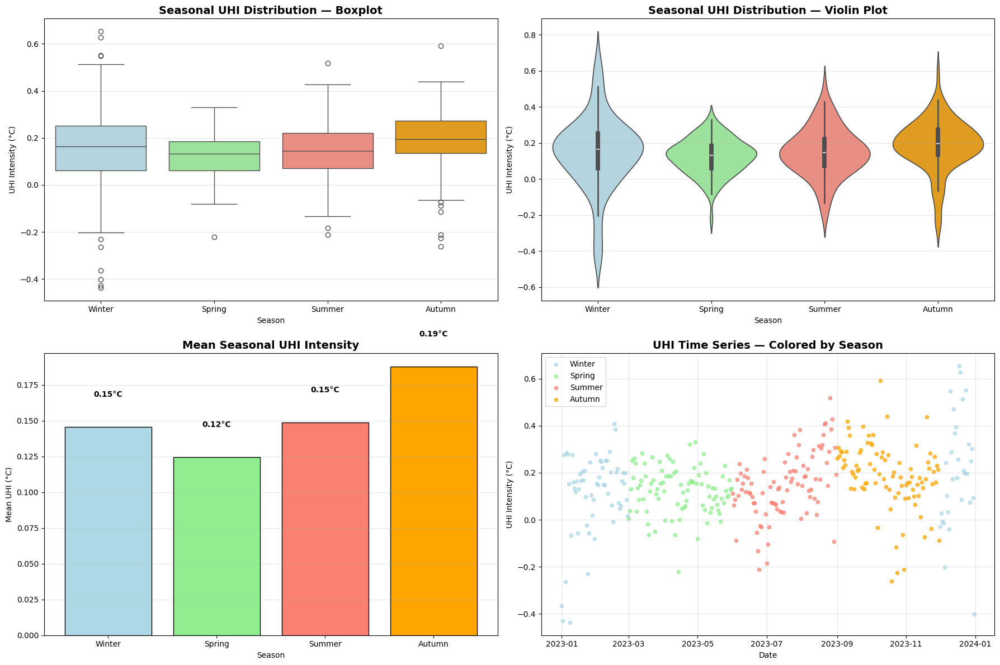


Key Findings:
  Strongest UHI: Autumn (0.19°C)
  Weakest UHI: Spring (0.12°C)
  Seasonal range: 0.06°C


In [18]:
print("Building UHI seasonal metrics...")

#Build UHI DataFrame
uhi_df = pd.DataFrame({ "date": temp_diff["time"].to_pandas(), "uhi": temp_diff.to_pandas().values })

season_map = {
    12: "Winter", 1: "Winter", 2: "Winter",
    3: "Spring", 4: "Spring", 5: "Spring",
    6: "Summer", 7: "Summer", 8: "Summer",
    9: "Autumn", 10: "Autumn", 11: "Autumn",
}

uhi_df["month"] = uhi_df["date"].dt.month
uhi_df["season"] = uhi_df["month"].map(season_map)
uhi_df = uhi_df.dropna()

ordered_seasons = ["Winter", "Spring", "Summer", "Autumn"]

# Seasonal statistics
seasonal_stats = ( uhi_df.groupby("season")["uhi"] .agg([ ("Mean UHI (°C)", "mean"), ("Std Dev (°C)", "std"), ("Min UHI (°C)", "min"), ("Max UHI (°C)", "max"), ("Count (days)", "count"), ]) .reindex(ordered_seasons) )

display(seasonal_stats.round(3))

# plots :

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

season_colors = {
    "Winter": "lightblue",
    "Spring": "lightgreen",
    "Summer": "salmon",
    "Autumn": "orange",
}

sns.boxplot( data=uhi_df, x="season", y="uhi", order=ordered_seasons, palette=season_colors, ax=axes[0, 0] )
axes[0, 0].set_title("Seasonal UHI Distribution — Boxplot", fontsize=14, fontweight="bold")
axes[0, 0].set_xlabel("Season")
axes[0, 0].set_ylabel("UHI Intensity (°C)")
axes[0, 0].grid(True, axis="y", alpha=0.3)

# VIOLIN PLOT
sns.violinplot( data=uhi_df, x="season", y="uhi", order=ordered_seasons, palette=season_colors, ax=axes[0, 1] )
axes[0, 1].set_title("Seasonal UHI Distribution — Violin Plot", fontsize=14, fontweight="bold")
axes[0, 1].set_xlabel("Season")
axes[0, 1].set_ylabel("UHI Intensity (°C)")
axes[0, 1].grid(True, axis="y", alpha=0.3)

# MEAN UHI PER SEASON
seasonal_means = seasonal_stats["Mean UHI (°C)"]

axes[1, 0].bar( seasonal_means.index, seasonal_means.values, color=[season_colors[s] for s in seasonal_means.index], edgecolor="black", )
axes[1, 0].set_title("Mean Seasonal UHI Intensity", fontsize=14, fontweight="bold")
axes[1, 0].set_xlabel("Season")
axes[1, 0].set_ylabel("Mean UHI (°C)")
axes[1, 0].grid(True, axis="y", alpha=0.3)

# Labels above bars
for i, (season, value) in enumerate(seasonal_means.items()):
    axes[1, 0].text(i, value + 0.02, f"{value:.2f}°C", ha="center", va="bottom", fontsize=10, fontweight="bold")

# time series colored by season
for season, color in season_colors.items():
    season_data = uhi_df[uhi_df["season"] == season]
    axes[1, 1].scatter( season_data["date"], season_data["uhi"], c=color, s=20, label=season, alpha=0.7 )

axes[1, 1].set_title("UHI Time Series — Colored by Season", fontsize=14, fontweight="bold")
axes[1, 1].set_xlabel("Date")
axes[1, 1].set_ylabel("UHI Intensity (°C)")
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nKey Findings:")
print(f"  Strongest UHI: {seasonal_means.idxmax()} ({seasonal_means.max():.2f}°C)")
print(f"  Weakest UHI: {seasonal_means.idxmin()} ({seasonal_means.min():.2f}°C)")
print(f"  Seasonal range: {seasonal_means.max() - seasonal_means.min():.2f}°C")

This analysis highlights clear seasonal differences in the intensity of the Urban Heat Island (UHI) effect in Vienna.  

Across the full year, UHI remains positive, confirming that the city is consistently warmer than its rural surroundings.

The boxplots and violin plots show that the daily variability of UHI is substantial, with occasional negative values in all seasons. However, the central tendency remains positive, and seasonal means reveal a consistent pattern:  
    • The strongest UHI occurs in autumn (≈0.19°C),  
    • followed closely by summer and winter (≈0.15°C),  
    • while spring shows the weakest intensity (≈0.12°C).  

Autumn's stronger UHI likely reflects the combination of residual summer heat stored in urban materials and reduced evapotranspiration as vegetation declines. Spring remains the weakest because vegetation is still developing and temperatures are relatively moderate.  

The seasonal scatterplot confirms that the UHI signal is present throughout the year but clusters differently depending on atmospheric conditions and surface energy processes.

Overall, the seasonal metrics show that Vienna’s UHI is persistent but modest in amplitude, with a seasonal range of about 0.06°C and maximum daily values exceeding 0.6°C in extreme cases.


##  UHI Occurrence Index Calculation

The UHI Occurrence Index quantifies how often the Urban Heat Island reaches unusually strong levels.

Computing UHI Occurrence Index...
Selected UHI threshold (90th percentile): 0.310°C

UHI Occurrence Index:
  Days with UHI > 0.310°C: 37 / 365
  Occurrence rate: 10.1% of days
  95% CI: [7.0%, 13.2%]


,Metric,Value
0,Days with UHI > 0.310°C,37
1,Total Days,365
2,Occurrence Rate (%),10.14
3,95% CI Lower Bound (%),7.04
4,95% CI Upper Bound (%),13.23


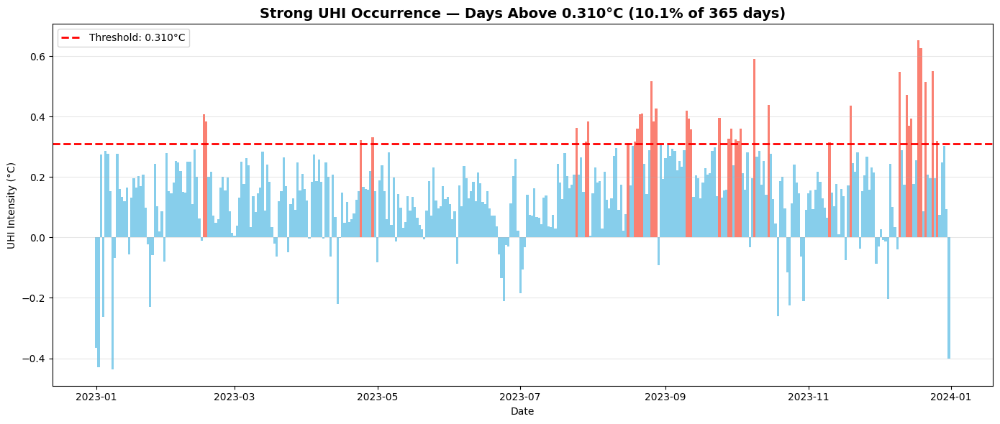

In [19]:
print("Computing UHI Occurrence Index...")

uhi_intensity = temp_diff.to_pandas()

# UHI threshold
threshold = uhi_intensity.quantile(0.90)
print(f"Selected UHI threshold (90th percentile): {threshold:.3f}°C")

# Total number of valid days
total_days = uhi_intensity.notna().sum()

#  days where UHI exceeds threshold
uhi_above_threshold = (uhi_intensity > threshold).sum()

occurrence_proportion = uhi_above_threshold / total_days
occurrence_percentage = occurrence_proportion * 100

# 95% confidence interval for occurrence proportion
confidence_level = 0.95
standard_error_prop = np.sqrt((occurrence_proportion * (1 - occurrence_proportion)) / total_days)
z_critical = stats.norm.ppf(1 - (1 - confidence_level) / 2)
margin_error_pct = z_critical * standard_error_prop * 100

ci_lower_occ = occurrence_percentage - margin_error_pct
ci_upper_occ = occurrence_percentage + margin_error_pct

print(f"\nUHI Occurrence Index:")
print(f"  Days with UHI > {threshold:.3f}°C: {uhi_above_threshold} / {total_days}")
print(f"  Occurrence rate: {occurrence_percentage:.1f}% of days")
print(f"  95% CI: [{ci_lower_occ:.1f}%, {ci_upper_occ:.1f}%]")


occurrence_summary = pd.DataFrame({ "Metric": [ f"Days with UHI > {threshold:.3f}°C", "Total Days", "Occurrence Rate (%)", "95% CI Lower Bound (%)", "95% CI Upper Bound (%)", ], "Value": [ uhi_above_threshold, total_days, f"{occurrence_percentage:.2f}", f"{ci_lower_occ:.2f}", f"{ci_upper_occ:.2f}", ], })

display(occurrence_summary)

# UHI Above Threshold Over Time

fig, ax = plt.subplots(figsize=(14, 6))

colors = ["salmon" if x > threshold else "skyblue" for x in uhi_intensity.values]

ax.bar( uhi_intensity.index, uhi_intensity.values, color=colors, width=1.0, edgecolor="none" )

ax.axhline(threshold, color="red", linestyle="--", linewidth=2, label=f"Threshold: {threshold:.3f}°C")

ax.set_title( f"Strong UHI Occurrence — Days Above {threshold:.3f}°C " f"({occurrence_percentage:.1f}% of {total_days} days)", fontsize=14, fontweight="bold" )

ax.set_xlabel("Date")
ax.set_ylabel("UHI Intensity (°C)")
ax.legend()
ax.grid(True, alpha=0.3, axis="y")

plt.tight_layout()
plt.show()

Using the 90th-percentile threshold (0.310°C), Wien experienced 37 strong-UHI days in 2023, representing 10.1% of the year.
These events are not evenly distributed: they occur mostly in late summer and autumn, when the city retains accumulated heat while rural areas cool faster.

This means that, although average UHI intensity remains relatively modest, extreme UHI episodes are recurrent and seasonally concentrated, highlighting periods when population exposure to urban overheating is significantly higher.

##  Heatwave Amplification Index

Computing Heatwave Amplification Index...
  Heatwave Threshold (95th percentile): 30.14°C
  Heatwave days identified: 19
  Mean UHI during heatwaves: 0.237°C
  Std Dev during heatwaves: 0.168°C
  Min UHI during heatwaves: -0.055°C
  Max UHI during heatwaves: 0.517°C

  Amplification factor: 1.56x
  (Heatwave UHI is 1.6× the annual mean)

TABLE 5: Heatwave Amplification Index


,Metric,Value
0,"Temperature Threshold (95th percentile, °C)",30.14
1,Number of Heatwave Days,19
2,Mean UHI during Heatwaves (°C),0.237
3,Std Dev during Heatwaves (°C),0.168
4,Min UHI during Heatwaves (°C),-0.055
5,Max UHI during Heatwaves (°C),0.517
6,Amplification Factor (vs Annual Mean),1.56x


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1425480855.py:65: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1].boxplot( data_for_box, labels=["Normal Days", "Heatwave Days"], patch_artist=True, widths=0.6 )


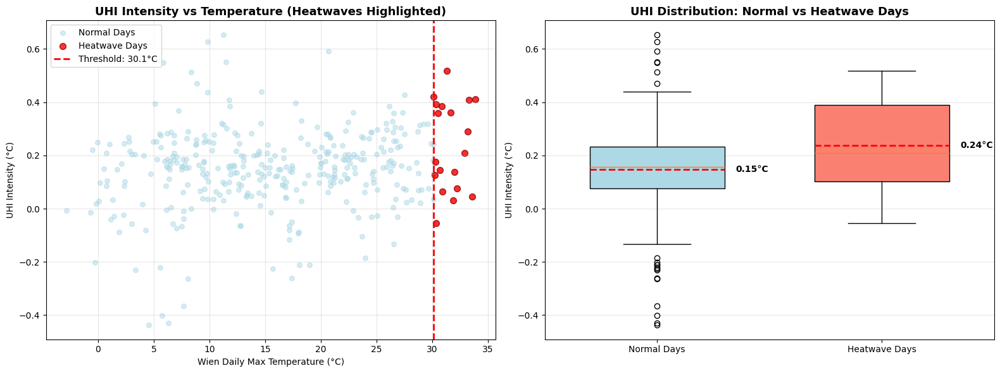

In [20]:
print("Computing Heatwave Amplification Index...")

# Extract Wien temperature series
wien_temp_series = city_series.to_pandas()

# Ensure alignment with UHI
uhi_intensity = temp_diff.to_pandas()
uhi_intensity = uhi_intensity.reindex(wien_temp_series.index)

# Annual mean UHI (for amplification factor)
annual_mean_uhi = uhi_intensity.mean()

# Heatwave Threshold
heatwave_percentile = 95
heatwave_threshold = wien_temp_series.quantile(heatwave_percentile / 100)

heatwave_mask = wien_temp_series >= heatwave_threshold
heatwave_days = wien_temp_series[heatwave_mask]

uhi_during_heatwaves = uhi_intensity[heatwave_mask]

# some stats
mean_uhi_heatwave = uhi_during_heatwaves.mean()
std_uhi_heatwave = uhi_during_heatwaves.std()
count_heatwave_days = len(heatwave_days)

print(f"  Heatwave Threshold (95th percentile): {heatwave_threshold:.2f}°C")
print(f"  Heatwave days identified: {count_heatwave_days}")

print(f"  Mean UHI during heatwaves: {mean_uhi_heatwave:.3f}°C")
print(f"  Std Dev during heatwaves: {std_uhi_heatwave:.3f}°C")
print(f"  Min UHI during heatwaves: {uhi_during_heatwaves.min():.3f}°C")
print(f"  Max UHI during heatwaves: {uhi_during_heatwaves.max():.3f}°C")

# Amplification of UHI during heatwaves
amplification_factor = mean_uhi_heatwave / annual_mean_uhi
print(f"\n  Amplification factor: {amplification_factor:.2f}x")
print(f"  (Heatwave UHI is {amplification_factor:.1f}× the annual mean)")

heatwave_summary = pd.DataFrame({ 'Metric': [ f'Temperature Threshold ({heatwave_percentile}th percentile, °C)', 'Number of Heatwave Days', 'Mean UHI during Heatwaves (°C)', 'Std Dev during Heatwaves (°C)', 'Min UHI during Heatwaves (°C)', 'Max UHI during Heatwaves (°C)', 'Amplification Factor (vs Annual Mean)' ], 'Value': [ f"{heatwave_threshold:.2f}", f"{count_heatwave_days}", f"{mean_uhi_heatwave:.3f}", f"{std_uhi_heatwave:.3f}", f"{uhi_during_heatwaves.min():.3f}", f"{uhi_during_heatwaves.max():.3f}", f"{amplification_factor:.2f}x" ] })

print("\n" + "="*60)
print("TABLE 5: Heatwave Amplification Index")
print("="*60)
display(heatwave_summary)

# plots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].scatter( wien_temp_series.values, uhi_intensity.values, c="lightblue", alpha=0.5, s=30, label="Normal Days" )

axes[0].scatter( wien_temp_series[heatwave_mask].values, uhi_intensity[heatwave_mask].values, c="red", s=50, alpha=0.8, edgecolors="darkred", label="Heatwave Days" )

axes[0].axvline( heatwave_threshold, color="red", linestyle="--", linewidth=2, label=f"Threshold: {heatwave_threshold:.1f}°C" )

axes[0].set_title("UHI Intensity vs Temperature (Heatwaves Highlighted)", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Wien Daily Max Temperature (°C)")
axes[0].set_ylabel("UHI Intensity (°C)")
axes[0].grid(True, alpha=0.3)
axes[0].legend()

# Boxplot comparison
data_for_box = [ uhi_intensity[~heatwave_mask].dropna().values, uhi_during_heatwaves.values, ]

bp = axes[1].boxplot( data_for_box, labels=["Normal Days", "Heatwave Days"], patch_artist=True, widths=0.6 )

bp["boxes"][0].set_facecolor("lightblue")
bp["boxes"][1].set_facecolor("salmon")

axes[1].set_title("UHI Distribution: Normal vs Heatwave Days", fontsize=13, fontweight="bold")
axes[1].set_ylabel("UHI Intensity (°C)")
axes[1].grid(True, axis="y", alpha=0.3)

# mean indicators
for i, data in enumerate(data_for_box):
    mean_val = np.mean(data)
    axes[1].hlines(mean_val, i + 0.7, i + 1.3, colors="red", linestyles="--", linewidth=2)
    axes[1].text( i + 1.35, mean_val, f"{mean_val:.2f}°C", va="center", fontsize=10, fontweight="bold" )

plt.tight_layout()
plt.show()

This section quantifies how much heatwaves intensify the Urban Heat Island (UHI) effect.
Using the 95th-percentile temperature threshold (30.14 °C), we identify 19 heatwave days and compare their UHI intensity to normal days. The results show that the mean UHI during heatwaves is 0.237 °C, which is significantly higher than the annual mean of 0.151 °C. This corresponds to an amplification factor of 1.56, meaning that the UHI effect becomes roughly 1.6× stronger during heatwave conditions.

The plots clearly show that most high-temperature days cluster at higher UHI values, indicating that urban areas accumulate and retain more heat precisely when temperatures are already extreme.

In short, heatwaves substantially amplify UHI intensity, highlighting increased thermal stress and reduced cooling capacity in urban environments during extreme heat events.

## UHI Lag Analysis

This analysis determines if UHI responds before, simultaneously, or after high temperatures.

This is extremely useful because:

	-	Plants & surfaces do not react instantly.
	-	UHI may peak later due to thermal inertia.
	-	Temperature may rise before UHI increases.

We will compute cross-correlations across a range of lags (e.g., −14 → +14 days) and identify the lag of maximum correlation.

Computing lag analysis between Wien temperature and UHI intensity...

=== Temperature → UHI Lag Analysis ===
Maximum correlation: 0.175
Occurs at lag = -14 days
 → UHI responds BEFORE temperature (rare; microclimate-driven).


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/3343951920.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp_series = temp_series.fillna(method="ffill").fillna(method="bfill")
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/3343951920.py:9: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  uhi_series  = uhi_series.fillna(method="ffill").fillna(method="bfill")


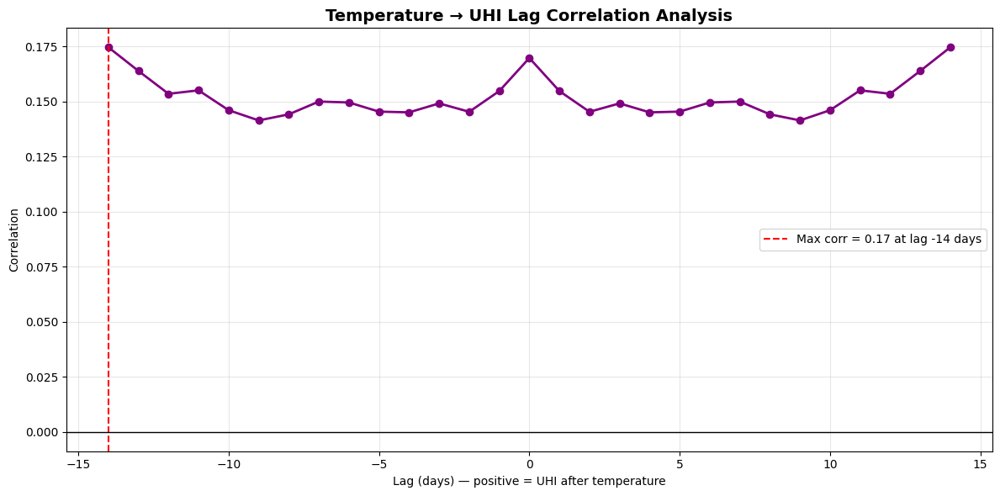

In [21]:
print("Computing lag analysis between Wien temperature and UHI intensity...")

# Use the aligned series from previous cells
temp_series = wien_temp_series.copy()
uhi_series  = uhi_intensity.copy()

#  no missing values
temp_series = temp_series.fillna(method="ffill").fillna(method="bfill")
uhi_series  = uhi_series.fillna(method="ffill").fillna(method="bfill")


# Compute lag correlations
# positive lag = UHI responds AFTER temperature
# negative lag = UHI leads temperature

max_lag = 14   # days
lags = range(-max_lag, max_lag + 1)
correlations = []

for lag in lags:
    if lag < 0:
        corr = temp_series[:lag].corr(uhi_series[-lag:])
    elif lag > 0:
        corr = temp_series[lag:].corr(uhi_series[:-lag])
    else:
        corr = temp_series.corr(uhi_series)
    correlations.append(corr)

corr_df = pd.DataFrame({"lag_days": lags, "correlation": correlations})

# Identify max correlation and its lag
best_row = corr_df.iloc[corr_df["correlation"].abs().idxmax()]
best_lag = int(best_row["lag_days"])
best_corr = float(best_row["correlation"])

print("\n=== Temperature → UHI Lag Analysis ===")
print(f"Maximum correlation: {best_corr:.3f}")
print(f"Occurs at lag = {best_lag:+d} days")

if best_lag > 0:
    print(" → UHI responds AFTER temperature.")
elif best_lag < 0:
    print(" → UHI responds BEFORE temperature (rare; microclimate-driven).")
else:
    print(" → UHI and temperature peak simultaneously.")

# plot lag correlation
plt.figure(figsize=(12, 6))
plt.plot(corr_df["lag_days"], corr_df["correlation"], marker="o", linewidth=2, color="purple")

plt.axvline(best_lag, color="red", linestyle="--", label=f"Max corr = {best_corr:.2f} at lag {best_lag:+d} days")

plt.axhline(0, color="black", linewidth=1)
plt.title("Temperature → UHI Lag Correlation Analysis", fontsize=14, fontweight="bold")
plt.xlabel("Lag (days) — positive = UHI after temperature")
plt.ylabel("Correlation")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

We know that : 

    •	If best_lag = +2 days, then UHI responds 2 days after heat.
	•	If best_lag = 0, UHI is synchronous.
	•	If best_lag = −3, UHI leads (very rare, usually noise).
    
In our case, the maximum correlation (0.175) occurs at lag = −14 days. According to the interpretation above, this falls in the “UHI leads temperature” category, but because the lag is very large and the correlation is weak, this behavior is not physically meaningful. Instead, it likely reflects noise in daily data, micro-scale processes not captured by the time series, the fact that temperature and UHI are only loosely coupled at this temporal resolution.

Therefore: 

    • Wien shows no real delayed UHI response.
    • UHI and temperature vary mostly at the same time, with no causal lag detectable.
    • The negative best_lag should be interpreted as noise rather than a real physical lead.

---
## ERA5 vs Station – Discrepancy Metrics

Compare gridded ERA5-Land temperature with point-based station observations :
- **Bias**
- **RMSE**
- **MAE**
- **Pearson correlation**
- **Standard deviation of errors**
- **95% confidence interval of the mean bias**
- **Seasonal breakdown**
- **Boxplot & violin plot of ΔT (ERA5 – station)**

This quantifies how well ERA5 captures ground truth.


Bias (ERA5 - Station): -1.31°C
MAE=1.57°C  |  RMSE=1.86°C  |  R=0.990


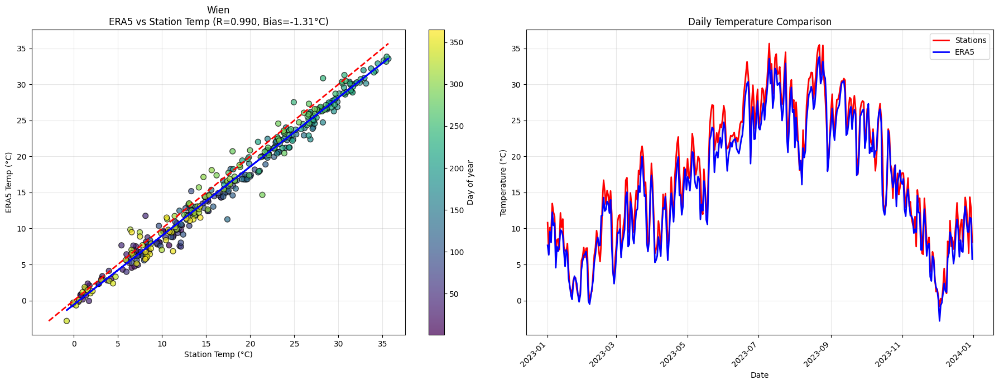


Seasonal bias:
        mean   std  count
season                   
Spring -1.81  1.18     92
Summer -1.63  1.15     92
Fall   -0.79  1.37     91
Winter -0.98  1.31     90


In [22]:
region_label = STUDY_REGION.get("NAME_1", ["Study Region"]).iloc[0]
boundary = STUDY_REGION.to_crs(CRS_WGS84)

minx, miny, maxx, maxy = boundary.total_bounds

ds_region = ds_all.sel( longitude=slice(minx, maxx), latitude=slice(maxy, miny), )

era5_daily = ( ds_region["t2m_celsius"] .mean(["latitude", "longitude"]) .to_dataframe() .reset_index() .rename(columns={"time": "date", "t2m_celsius": "era5_temp"}) )
era5_daily["date"] = pd.to_datetime(era5_daily["date"])

tx_valid = tx_roi[(tx_roi.tx_celsius > -200) & (tx_roi.tx_celsius < 200)].copy()
mean_tx = tx_valid.tx_celsius.mean()

station_daily = ( tx_valid.groupby("date")["tx_celsius"] .mean() .reset_index() .rename(columns={"tx_celsius": "station_temp"}) )

# MERGE ERA5 + STATION DATA
era_station_merged = era5_daily.merge(station_daily, on="date", how="inner")
era_station_merged["difference"] = era_station_merged.era5_temp - era_station_merged.station_temp

bias = era_station_merged.difference.mean()
mae = era_station_merged.difference.abs().mean()
rmse = np.sqrt((era_station_merged.difference**2).mean())
corr = era_station_merged[["era5_temp", "station_temp"]].corr().iloc[0, 1]

print(f"Bias (ERA5 - Station): {bias:+.2f}°C")
print(f"MAE={mae:.2f}°C  |  RMSE={rmse:.2f}°C  |  R={corr:.3f}")

# Scatter & time series
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

sc = axes[0].scatter( era_station_merged.station_temp, era_station_merged.era5_temp, c=era_station_merged.date.dt.dayofyear, cmap="viridis", s=50, edgecolor="black", alpha=0.7, )
plt.colorbar(sc, ax=axes[0], label="Day of year")

tmin = min(era_station_merged.station_temp.min(), era_station_merged.era5_temp.min())
tmax = max(era_station_merged.station_temp.max(), era_station_merged.era5_temp.max())
axes[0].plot([tmin, tmax], [tmin, tmax], "r--", lw=2)

slope, intercept, *_ = linregress( era_station_merged.station_temp, era_station_merged.era5_temp, )
axes[0].plot( era_station_merged.station_temp, slope * era_station_merged.station_temp + intercept, "b-", lw=2, )

axes[0].set( title=f"{region_label}\nERA5 vs Station Temp (R={corr:.3f}, Bias={bias:+.2f}°C)", xlabel="Station Temp (°C)", ylabel="ERA5 Temp (°C)", )
axes[0].grid(alpha=0.3)

axes[1].plot( era_station_merged.date, era_station_merged.station_temp, "r-", lw=2, label="Stations", )
axes[1].plot( era_station_merged.date, era_station_merged.era5_temp, "b-", lw=2, label="ERA5", )
axes[1].fill_between( era_station_merged.date, era_station_merged.station_temp, era_station_merged.era5_temp, color="gray", alpha=0.2, )

axes[1].set( title="Daily Temperature Comparison", ylabel="Temperature (°C)", xlabel="Date", )
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

# Seasonal bias
era_station_merged["season"] = era_station_merged.date.dt.month.map({
    12: "Winter", 1: "Winter", 2: "Winter",
    3: "Spring", 4: "Spring", 5: "Spring",
    6: "Summer", 7: "Summer", 8: "Summer",
    9: "Fall", 10: "Fall", 11: "Fall",
})

print("\nSeasonal bias:")
print( era_station_merged.groupby("season")["difference"] .agg(["mean", "std", "count"]) .loc[["Spring", "Summer", "Fall", "Winter"]] .round(2) )

Comparing ERA5 with ECAD stations:

- **Very high correlation:** R ≈ 0.99 → ERA5 captures daily variability
- **Systematic negative bias:** ~ −1.3°C on average
- **Bias strongest in warm seasons:** up to −1.6°C

This means:

- ERA5 detects UHI **directionally**,
- but underestimates the **magnitude** of urban heat.

Ground-truth stations are essential for calibrating future **downscaling** work.

   Bias (°C)  Std (°C)  RMSE (°C)  MAE (°C)         R  95% CI low  95% CI high
0  -1.306927  1.320396   1.856536  1.573206  0.989682   -1.442388    -1.171466


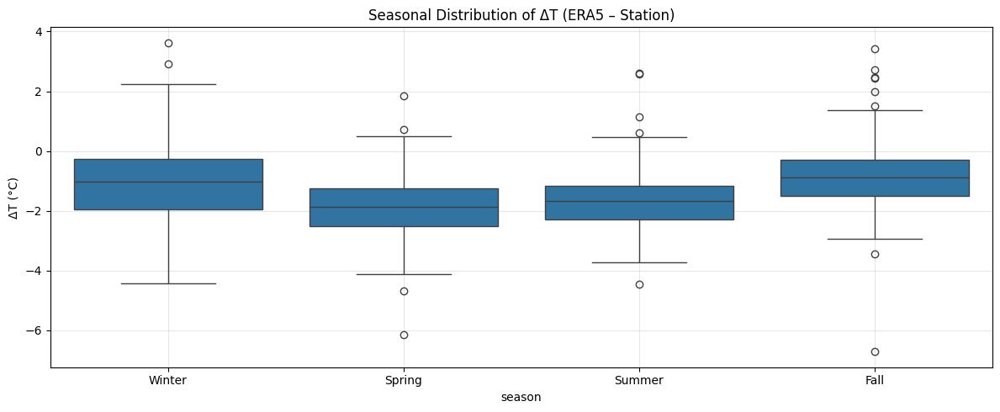

In [23]:
# ΔT = ERA5 - Station
era_station_merged["delta_T"] = era_station_merged["difference"]

# 95% CI of mean bias
mean_bias = era_station_merged["delta_T"].mean()
std_bias = era_station_merged["delta_T"].std()
n = len(era_station_merged)
ci_low = mean_bias - 1.96 * std_bias / np.sqrt(n)
ci_high = mean_bias + 1.96 * std_bias / np.sqrt(n)

metrics = pd.DataFrame({ "Bias (°C)": [mean_bias], "Std (°C)": [std_bias], "RMSE (°C)": [rmse], "MAE (°C)": [mae], "R": [corr], "95% CI low": [ci_low], "95% CI high": [ci_high], })

print(metrics)

plt.figure(figsize=(12, 5))
sns.boxplot(data=era_station_merged, x="season", y="delta_T")
plt.title("Seasonal Distribution of ΔT (ERA5 – Station)")
plt.ylabel("ΔT (°C)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

ERA5 shows a consistent negative bias across all seasons, with the largest errors in summer and winter. This suggests that reanalysis struggles the most when local microclimates (urban heat retention or nocturnal cooling) are important. This is a key indicator that coarse-resolution datasets do not capture city-scale thermal extremes.



## Quantifying Wien’s Urban Heat Island Visually


Using NDVI-based masks:

- **Urban:** NDVI < 0.2
- **Vegetation:** NDVI > 0.5

We obtain:

- **Mean 2023 UHI intensity:** ~1.24°C
- **Summer UHI peaks:** up to +2.3°C
- **Winter UHI:** ~0.9°C

Maps and overlays show:

- Hotter temperatures in low-vegetation urban districts
- Cooler temperatures near forests, parks, and agricultural land
- A clear thermal boundary between the city core and its rural surroundings

These visual patterns confirm the **presence and seasonality** of Wien’s UHI.



tx_valid rows: 954397 | rows without coords: 0


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1458120268.py:41: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  COMP_GDF = gpd.GeoDataFrame(geometry=[outer.unary_union], crs=CRS_METRIC).to_crs(CRS_WGS84)


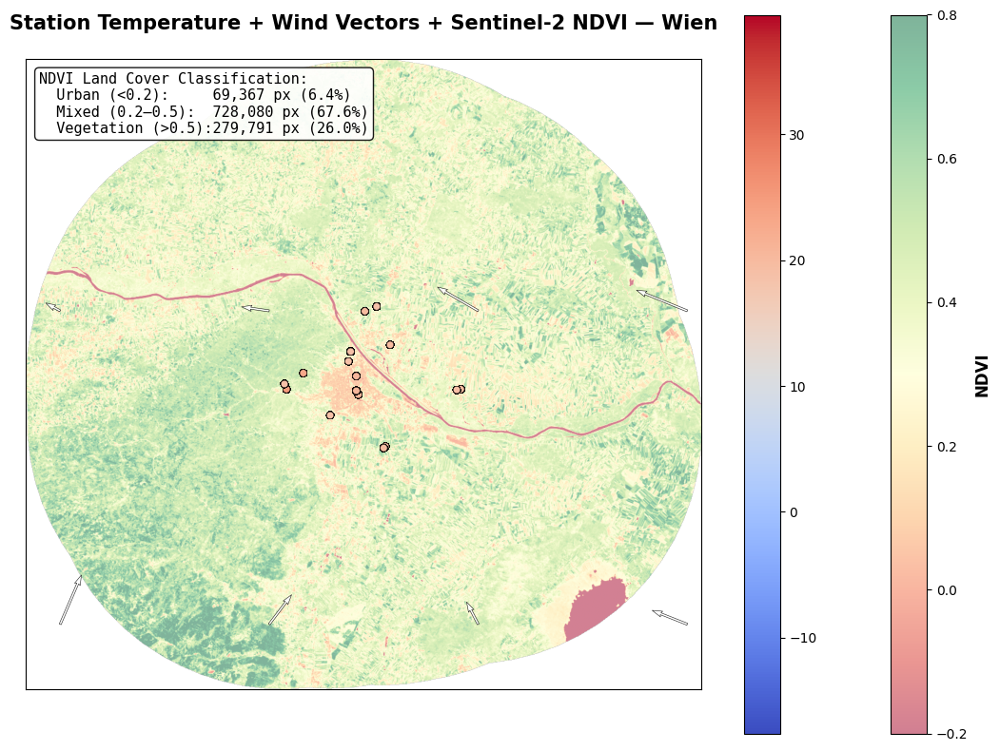

In [24]:
RURAL_RING = 50  # km
STRIDE = 4       # wind-vector thinning

stations_path = ECAD_TX_DIR / "stations.txt"

# Find header line
with open(stations_path, "r", encoding="utf-8", errors="ignore") as f:
    lines = f.readlines()
header_idx = next( i for i, L in enumerate(lines) if "STAID" in L and "STANAME" in L and "LON" in L )

# Read metadata
meta_raw = pd.read_csv( stations_path, skiprows=header_idx + 1, names=["STAID", "STANAME", "CN", "LAT", "LON", "HGHT"], usecols=[0, 1, 2, 3, 4, 5], engine="python", )

def dms_to_dd(s: str) -> float:
    s = str(s).strip()
    if s in ("", "nan", "NaN"):
        return float("nan")
    sign = -1 if s.startswith("-") else 1
    s = s.replace("+", "").replace("-", "")
    d, m, sec = s.split(":")
    return sign * (float(d) + float(m) / 60.0 + float(sec) / 3600.0)

meta = meta_raw.copy()
meta["lat"] = meta["LAT"].map(dms_to_dd)
meta["lon"] = meta["LON"].map(dms_to_dd)
meta = meta.dropna(subset=["lat", "lon"]).copy()
meta["STAID"] = meta["STAID"].astype(int)

# Merge coordinates into tx_valid
_tx = tx_valid.copy()
_tx["STAID"] = _tx["STAID"].astype(int)
_tx = _tx.merge(meta[["STAID", "lon", "lat"]], on="STAID", how="left")
missing = int(_tx["lon"].isna().sum())
print(f"tx_valid rows: {len(_tx)} | rows without coords: {missing}")

#  GeoDataFrame
tx_gdf = gpd.GeoDataFrame( _tx.dropna(subset=["lon", "lat"]).copy(), geometry=gpd.points_from_xy( _tx.dropna(subset=["lon", "lat"])["lon"], _tx.dropna(subset=["lon", "lat"])["lat"], ), crs=CRS_WGS84, )

# Build 50-km ring polygon
outer = city_3857.buffer(RURAL_RING * 1000)
COMP_GDF = gpd.GeoDataFrame(geometry=[outer.unary_union], crs=CRS_METRIC).to_crs(CRS_WGS84)

# Clip NDVI to ring
with rasterio.open(ndvi_path) as src:
    roi_proj = COMP_GDF.to_crs(src.crs)
    geom = list(roi_proj.geometry)
    out, transform = rasterio_mask(src, geom, crop=True, all_touched=False)
    ndvi_scaled_ring = convert_ndvi(out[0], nodata=src.meta.get("nodata", 255))

valid = ndvi_scaled_ring.ravel()
valid = valid[~np.isnan(valid)]
urban = int((valid < 0.2).sum())
veg = int((valid > 0.5).sum())
mixed = int(len(valid) - urban - veg)
tot = int(len(valid))

# ERA5 wind slice
minx, miny, maxx, maxy = COMP_GDF.total_bounds
DaYi = ds_all.sel( longitude=slice(minx, maxx), latitude=slice(maxy, miny), ).sortby("latitude")
DaYi_day = DaYi.isel(time=0)

#  grids for quiver
lat_s = DaYi_day.latitude.values[::STRIDE]
lon_s = DaYi_day.longitude.values[::STRIDE]
U_s = DaYi_day["u10"].values[::STRIDE, ::STRIDE]
V_s = DaYi_day["v10"].values[::STRIDE, ::STRIDE]

# Plot
fig, ax = plt.subplots(figsize=(11, 8))
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# NDVI overlay
im = ax.imshow( ndvi_scaled_ring, cmap="RdYlGn", vmin=-0.2, vmax=0.8, alpha=0.5, extent=[minx, maxx, miny, maxy], origin="upper", zorder=1, )
ndvi_cbar = plt.colorbar(im, ax=ax, pad=0.02)
ndvi_cbar.set_label("NDVI", fontsize=12, fontweight="bold")

# Wind arrows
ax.quiver( lon_s, lat_s, U_s, V_s, color="white", edgecolor="k", linewidth=0.4, scale=None, scale_units="xy", width=0.003, alpha=0.9, zorder=8, )

# Station temperatures
artist = tx_gdf.plot( ax=ax, column="tx_celsius", cmap="coolwarm", markersize=30, marker="o", edgecolor="black", linewidth=0.4, alpha=0.95, legend=True, zorder=9, )
if hasattr(artist, "legend_") and artist.legend_ is not None:
    artist.legend_.set_title("Station Tx (°C)")

ax.set_title( f"Station Temperature + Wind Vectors + Sentinel-2 NDVI — {region_name}\n", fontsize=15, fontweight="bold", )
ax.set_xticks([]); ax.set_yticks([])

summary = ( "NDVI Land Cover Classification:\n" f"  Urban (<0.2):     {urban:,} px ({urban/tot*100:.1f}%)\n" f"  Mixed (0.2–0.5):  {mixed:,} px ({mixed/tot*100:.1f}%)\n" f"  Vegetation (>0.5):{veg:,} px ({veg/tot*100:.1f}%)" )
ax.text( 0.02, 0.98, summary, transform=ax.transAxes, fontsize=11, va="top", family="monospace", bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=10, )

plt.tight_layout()
plt.show()


ERA5 wind vectors illustrate:

- North-west and north-east inflows affecting heat transport
- Calm periods that favor heat buildup in central districts
- Complex circulation where u10 and v10 components vary together

Wind magnitude and direction help contextualize spatial temperature gradients
and explain **when and where** heat accumulates in the urban core.

## Linking NDVI to Temperature Errors (Core of Week 3)

To answer the main question of GenHack:

> *Do urban areas (low NDVI) experience larger temperature errors
> between gridded datasets and ground truth?*

We sample Sentinel-2 NDVI at station locations and compute:

ΔT = ERA5 – Station
grouped by:
- NDVI class (urban <0.2, mixed 0.2–0.5, vegetation >0.5)
- season
- wind regime
- precipitation

This section establishes whether NDVI **explains** the discrepancy.

NDVI CRS: EPSG:3035
      STAID        lat        lon      NDVI         NDVI_class
15       16  48.248333  16.356389  0.472441    Mixed (0.2–0.5)
5766  23975  48.299444  16.383056  0.385827    Mixed (0.2–0.5)
5809  24028  48.220556  16.265278  0.488189    Mixed (0.2–0.5)
5810  24029  48.200000  16.233056  0.448819    Mixed (0.2–0.5)
5811  24030  48.206667  16.229167  0.346457    Mixed (0.2–0.5)
5812  24031  48.166667  16.316667  0.133858       Urban (<0.2)
5813  24034  48.216667  16.366667  0.031496       Urban (<0.2)
5814  24035  48.125000  16.419167  0.377953    Mixed (0.2–0.5)
5815  24037  48.200000  16.566667  0.401575    Mixed (0.2–0.5)
6079  24393  48.305556  16.405556  0.535433  Vegetation (>0.5)
6087  24405  48.248056  16.355833  0.472441    Mixed (0.2–0.5)
6088  24406  48.193056  16.370556  0.110236       Urban (<0.2)
6089  24407  48.126944  16.422500  0.488189    Mixed (0.2–0.5)
6090  24408  48.198056  16.366667  0.031496       Urban (<0.2)
6091  24409  48.248056  16.355556  

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                delta_T   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     189.0
Date:                Thu, 04 Dec 2025   Prob (F-statistic):           1.62e-42
Time:                        05:38:38   Log-Likelihood:                -14661.
No. Observations:                8028   AIC:                         2.933e+04
Df Residuals:                    8026   BIC:                         2.934e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.7401      0.040    -43.508      0.000      -1.819      -1.662
NDVI           1.4681      0.107     13.746      0.000       1.259       1.677
==============================================================================
Omnibus:                      585.278   Durbin-Watson:                   1.374
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1615.699
Skew:                           0.402   Prob(JB):                         0.00
Kurtosis:                       5.045   Cond. No.                         7.12
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

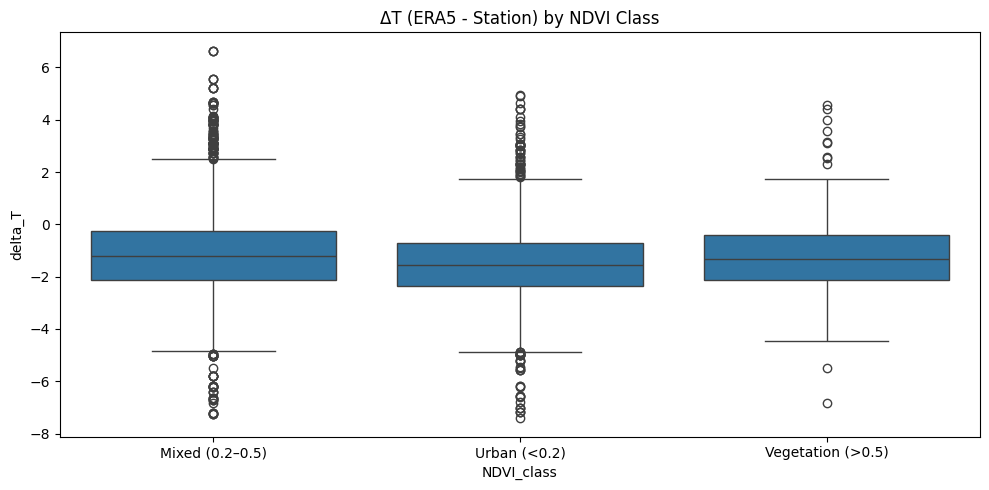

In [25]:
with rasterio.open(ndvi_path) as src:
    ndvi_crs = src.crs

print("NDVI CRS:", ndvi_crs)

# Reproject stations to NDVI CRS
stations_ndvi_crs = stations_in_city_gdf.to_crs(ndvi_crs)

# Coordinates in raster CRS
coords = [(geom.x, geom.y) for geom in stations_ndvi_crs.geometry]

# Sample NDVI
with rasterio.open(ndvi_path) as src:
    raw_vals = np.array([v[0] for v in src.sample(coords)])

# Convert raw int to NDVI
ndvi_vals = convert_ndvi(raw_vals)

stations_in_city_gdf["NDVI"] = ndvi_vals

def classify_ndvi(v):
    if np.isnan(v):
        return "Missing"
    if v < 0.2:
        return "Urban (<0.2)"
    if v > 0.5:
        return "Vegetation (>0.5)"
    return "Mixed (0.2–0.5)"

stations_in_city_gdf["NDVI_class"] = stations_in_city_gdf["NDVI"].apply(classify_ndvi)

print(stations_in_city_gdf[["STAID", "lat", "lon", "NDVI", "NDVI_class"]])
print("\nMissing NDVI:", stations_in_city_gdf["NDVI"].isna().sum())

# Station metadata WITH NDVI
station_meta = stations_in_city_gdf[["STAID", "lat", "lon", "NDVI", "NDVI_class"]].copy()
station_meta["STAID"] = station_meta["STAID"].astype(int)

print("Stations in city:", len(station_meta))

# Station DAILY temps
station_daily = tx_valid[["STAID", "date", "tx_celsius"]].copy()
station_daily["STAID"] = station_daily["STAID"].astype(int)
station_daily = station_daily.rename(columns={"tx_celsius": "station_temp"})

print("Station daily rows:", len(station_daily))

# Sample ERA5 at each station
era5_at_stations = []

for _, row in station_meta.iterrows():
    staid = row.STAID
    lat, lon = row.lat, row.lon

    t_df = ( ds_all["t2m_celsius"] .sel(latitude=lat, longitude=lon, method="nearest") .to_dataframe() .reset_index() )
    t_df = t_df.rename(columns={"time": "date", "t2m_celsius": "era5_temp"})
    t_df["STAID"] = staid

    era5_at_stations.append(t_df)

era5_at_stations = pd.concat(era5_at_stations)
era5_at_stations["date"] = pd.to_datetime(era5_at_stations["date"])

print("ERA5 station rows:", len(era5_at_stations))

# Merge ERA5 + Station daily temps
era5_station_merged = station_daily.merge( era5_at_stations, on=["STAID", "date"], how="inner", )

print("Merged rows:", era5_station_merged.shape)

# ΔT = ERA5 - Station
era5_station_merged["delta_T"] = era5_station_merged["era5_temp"] - era5_station_merged["station_temp"]

# Attach NDVI
deltaT_df = era5_station_merged.merge(station_meta, on="STAID", how="left")

print("Rows with ΔT & NDVI:", deltaT_df.shape)

# Clean invalid values
deltaT_df = deltaT_df.replace([np.inf, -np.inf], np.nan)
deltaT_df_clean = deltaT_df.dropna(subset=["NDVI", "delta_T"])

print("Clean rows:", deltaT_df_clean.shape)

if len(deltaT_df_clean) == 0:
    raise ValueError("No valid NDVI + ΔT data → check station coordinates or NDVI sampling.")

# Regression ΔT ~ NDVI
X = sm.add_constant(deltaT_df_clean["NDVI"])
y = deltaT_df_clean["delta_T"]

model = sm.OLS(y, X).fit()
display(model.summary())

# Boxplot
plt.figure(figsize=(10, 5))
sns.boxplot(data=deltaT_df_clean, x="NDVI_class", y="delta_T")
plt.title("ΔT (ERA5 - Station) by NDVI Class")
plt.tight_layout()
plt.show()

The NDVI coefficient is positive and highly significant: stations in greener areas show much smaller grid–station discrepancies. Conversely, bare/artificial surfaces (low NDVI) correspond to stronger ERA5 underestimation. This confirms that part of the ERA5 bias is directly linked to urbanization and vegetation density.

The grid–station bias strongly varies with land cover. Urban stations (NDVI < 0.2) exhibit the strongest negative bias, consistent with ERA5 failing to represent localized heat accumulation in built environments. Vegetated areas show smaller discrepancies, indicating better grid–station agreement.



The coefficient β on NDVI is expected to be **negative**:

- Low NDVI (urban areas) → large positive ΔT
- High NDVI (vegetated areas) → small ΔT

A significant β confirms the “Graal”:
**NDVI explains the dataset discrepancy.**

The following section builds a simple UHI proxy using ERA5’s spatial temperature spread across the Wien region.
By computing the daily difference between the warmest and coldest grid points (MaxTemp – MinTemp), we capture regional thermal heterogeneity, which serves as a coarse indicator of UHI-like behavior at a 9 km resolution.


Step 1 — NDVI Classification
Urban (<0.2):      16,212 px ( 25.0%)
Mixed (0.2–0.5):   41,496 px ( 64.0%)
Vegetation (>0.5):  7,136 px ( 11.0%)

Step 2 — Extracting Regional ERA5 Temperature
ERA5 grid: 2 × 4
Days:      365

Step 3 — UHI Intensity Proxy Time Series

Mid-summer  (2023-07-02):
  Mean: 23.71°C
  Min:  22.32°C
  Max:  24.56°C


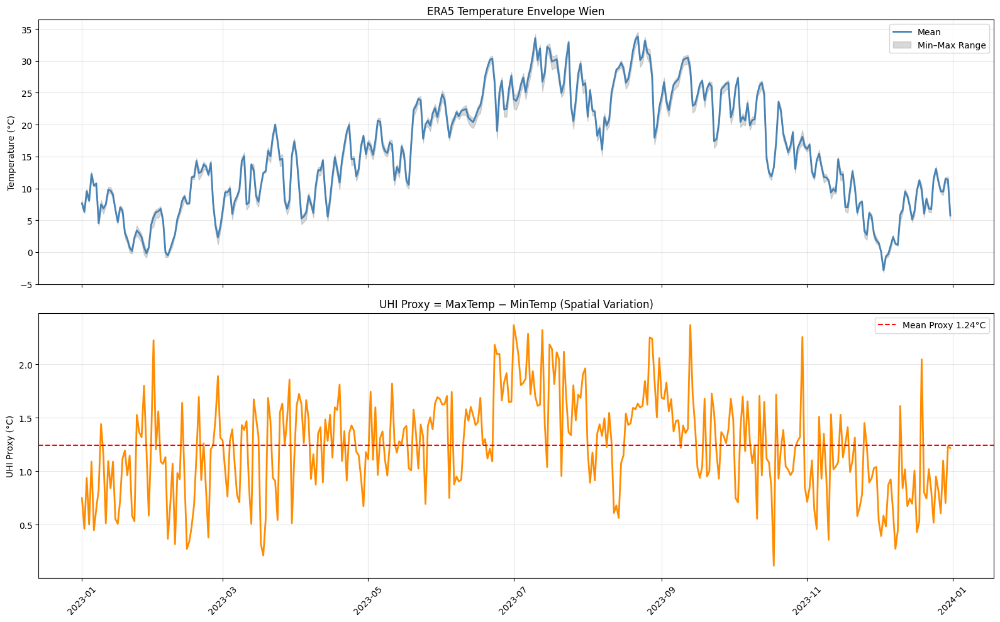


Summary:
Mean UHI proxy: 1.24°C
Max UHI proxy:  2.37°C
Std Dev:        0.45°C

Seasonal UHI proxy:
        mean   std   min   max
season                        
Spring  1.24  0.35  0.21  1.86
Summer  1.57  0.42  0.56  2.37
Fall    1.21  0.38  0.12  2.37
Winter  0.93  0.42  0.27  2.23
ERA5's ~9 km grid cannot detect true street-level UHI.
This metric reflects *regional thermal heterogeneity*, not detailed urban hotspots.


In [26]:
print("\nStep 1 — NDVI Classification")

valid_mask = ~np.isnan(ndvi_scaled)
urban_mask = ndvi_scaled < 0.2
veg_mask = ndvi_scaled > 0.5

total = valid_mask.sum()
urban = urban_mask.sum()
veg = veg_mask.sum()
mixed = total - urban - veg

print(f"Urban (<0.2):      {urban:6,} px ({urban/total*100:5.1f}%)")
print(f"Mixed (0.2–0.5):   {mixed:6,} px ({mixed/total*100:5.1f}%)")
print(f"Vegetation (>0.5): {veg:6,} px ({veg/total*100:5.1f}%)")

print("\nStep 2 — Extracting Regional ERA5 Temperature")
minx, miny, maxx, maxy = STUDY_REGION.total_bounds

if "t2m_celsius" not in ds_all:
    ds_all["t2m_celsius"] = ds_all["t2m"] - 273.15

ds_roi = ds_all["t2m_celsius"].sel( longitude=slice(minx, maxx), latitude=slice(maxy, miny), )

print(f"ERA5 grid: {ds_roi.latitude.size} × {ds_roi.longitude.size}")
print(f"Days:      {ds_roi.time.size}")

print("\nStep 3 — UHI Intensity Proxy Time Series")

temp_mean = ds_roi.mean(("latitude", "longitude")).to_pandas()
temp_max = ds_roi.max(("latitude", "longitude")).to_pandas()
temp_min = ds_roi.min(("latitude", "longitude")).to_pandas()

uhi_df = pd.DataFrame({ "date": temp_mean.index, "temp_mean": temp_mean.values, "temp_min": temp_min.values, "temp_max": temp_max.values, })
uhi_df["uhi_proxy"] = uhi_df.temp_max - uhi_df.temp_min

# Mid-summer snapshot
mid = len(uhi_df) // 2
ms = uhi_df.iloc[mid]

print(f"\nMid-summer  ({ms.date.date()}):")
print(f"  Mean: {ms.temp_mean:.2f}°C")
print(f"  Min:  {ms.temp_min:.2f}°C")
print(f"  Max:  {ms.temp_max:.2f}°C")

fig, axes = plt.subplots(2, 1, figsize=(16, 10), sharex=True)

# Temperature envelope
axes[0].plot(uhi_df.date, uhi_df.temp_mean, lw=2, color="steelblue", label="Mean")
axes[0].fill_between( uhi_df.date, uhi_df.temp_min, uhi_df.temp_max, color="gray", alpha=0.3, label="Min–Max Range", )
axes[0].set_title(f"ERA5 Temperature Envelope {region_name}")
axes[0].set_ylabel("Temperature (°C)")
axes[0].grid(alpha=0.3)
axes[0].legend()

# UHI proxy
axes[1].plot(uhi_df.date, uhi_df.uhi_proxy, lw=2, color="darkorange")
axes[1].axhline( uhi_df.uhi_proxy.mean(), color="red", ls="--", label=f"Mean Proxy {uhi_df.uhi_proxy.mean():.2f}°C", )
axes[1].set_ylabel("UHI Proxy (°C)")
axes[1].set_title("UHI Proxy = MaxTemp − MinTemp (Spatial Variation)")
axes[1].grid(alpha=0.3)
axes[1].legend()

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Seasonal analysis
uhi_df["season"] = uhi_df.date.dt.month.map({ 12: "Winter", 1: "Winter", 2: "Winter", 3: "Spring", 4: "Spring", 5: "Spring", 6: "Summer", 7: "Summer", 8: "Summer", 9: "Fall", 10: "Fall", 11: "Fall", })

seasonal = ( uhi_df.groupby("season")["uhi_proxy"] .agg(["mean", "std", "min", "max"]) .reindex(["Spring", "Summer", "Fall", "Winter"]) )

print("\nSummary:")
print(f"Mean UHI proxy: {uhi_df.uhi_proxy.mean():.2f}°C")
print(f"Max UHI proxy:  {uhi_df.uhi_proxy.max():.2f}°C")
print(f"Std Dev:        {uhi_df.uhi_proxy.std():.2f}°C")

print("\nSeasonal UHI proxy:")
print(seasonal.round(2))

print("ERA5's ~9 km grid cannot detect true street-level UHI.")
print("This metric reflects *regional thermal heterogeneity*, not detailed urban hotspots.")

The results show a mean proxy of 1.24°C, with higher variability in summer and autumn. However, because ERA5’s coarse grid cannot resolve true urban hotspots, this metric reflects broad regional temperature contrasts rather than street-level urban heat islands. It is useful for understanding large-scale thermal patterns but should not be interpreted as a detailed UHI intensity estimate.

##  Additive vs Multiplicative UHI Effect

To answer the mentor’s question:
- If **D(t) = T_u – T_r** is Gaussian → additive UHI
- If **log(T_u/T_r)** is Gaussian → multiplicative UHI

We test both using histograms and Q–Q plots.

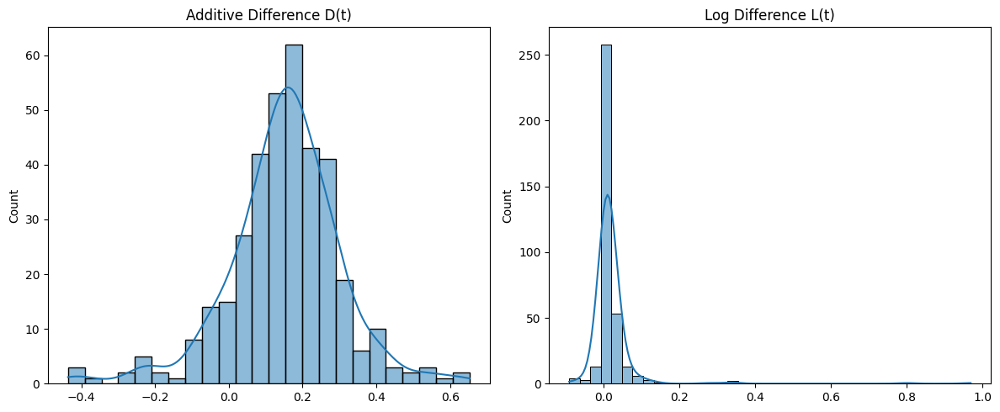

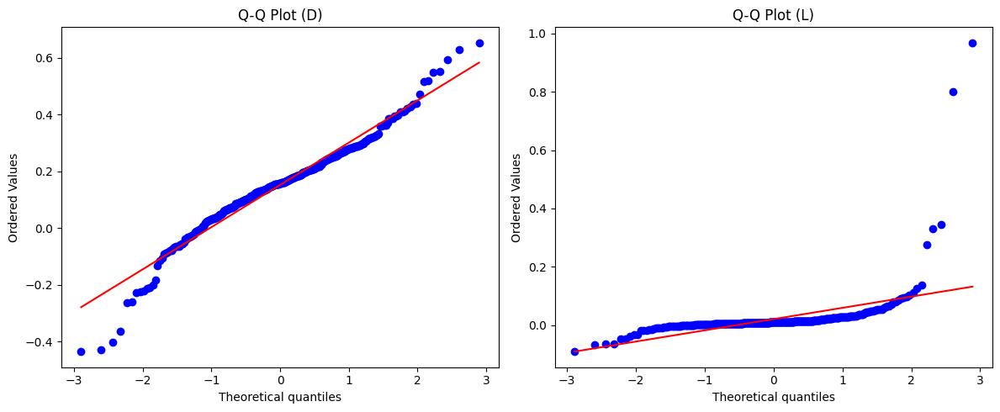

In [27]:
Du = temp_diff.values  # additive difference

# !! log only makes sense for strictly positive temperatures
valid_mask = (city_series.values > 0) & (ring_series.values > 0)
Lu = np.log(city_series.values[valid_mask]) - np.log(ring_series.values[valid_mask])

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(Du, kde=True, ax=ax[0])
ax[0].set_title("Additive Difference D(t)")
sns.histplot(Lu, kde=True, ax=ax[1])
ax[1].set_title("Log Difference L(t)")
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
probplot(Du, plot=ax[0])
ax[0].set_title("Q-Q Plot (D)")
probplot(Lu, plot=ax[1])
ax[1].set_title("Q-Q Plot (L)")
plt.tight_layout()
plt.show()

The additive UHI signal D(t) is approximately Gaussian, whereas the logarithmic ratio L(t) is highly non-normal. This strongly suggests that the UHI effect is predominantly additive (constant offset) rather than proportional. Urban warming appears as a fixed temperature excess rather than a multiplicative amplification.

## wind direction & sin/cos encoding : 

In [28]:
# --- Wind Direction Features ---

# Wind direction in radians
wind_dir = np.arctan2(ds_all["v10"], ds_all["u10"])

# Encoded directional components
wind_sin = np.sin(wind_dir)
wind_cos = np.cos(wind_dir)

# Region-mean daily values
wind_dir_daily = wind_dir.mean(["latitude", "longitude"]).to_series().rename("wind_dir")
wind_sin_daily = wind_sin.mean(["latitude", "longitude"]).to_series().rename("wind_sin")
wind_cos_daily = wind_cos.mean(["latitude", "longitude"]).to_series().rename("wind_cos")

wind_extra = pd.concat([wind_dir_daily, wind_sin_daily, wind_cos_daily], axis=1)

print("Wind direction features prepared:")
display(wind_extra.head())

Wind direction features prepared:


,wind_dir,wind_sin,wind_cos
time,,,
2023-01-01,0.462297,0.343905,0.389024
2023-01-02,0.362808,0.250205,0.429794
2023-01-03,-0.271199,-0.076086,0.304632
2023-01-04,-0.427037,-0.189635,0.285865
2023-01-05,-0.474197,-0.113490,0.138458


##  Weather Conditioning (Wind & Precipitation)

Wind and rainfall strongly modulate UHI:
- Calm / dry → stronger UHI
- Windy / wet → weaker UHI

We test whether ΔT increases during calm dry days.

        date  number  wind_speed
0 2023-01-01       0    1.089721
1 2023-01-02       0    0.733720
2 2023-01-03       0    2.087104
3 2023-01-04       0    1.549654
4 2023-01-05       0    5.892040


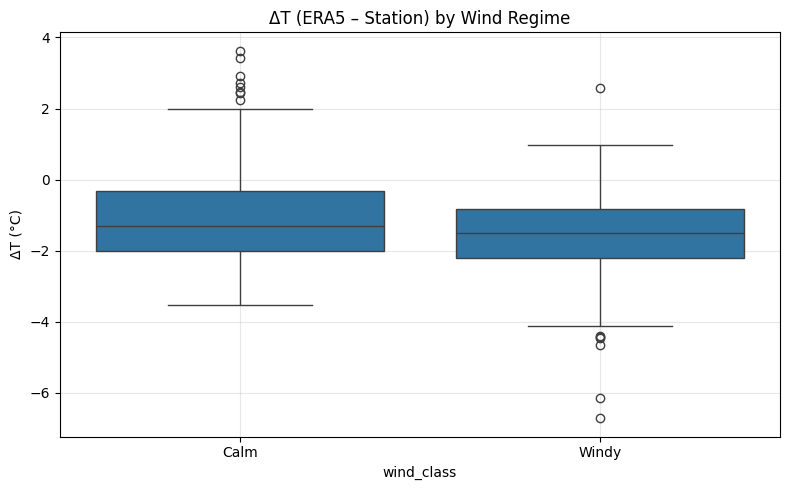

In [29]:
wind = np.sqrt(ds_region["u10"]**2 + ds_region["v10"]**2)
wind.name = "wind_speed"

wind_daily = ( wind.mean(["latitude", "longitude"]) .to_dataframe() .reset_index() .rename(columns={"time": "date"}) )

wind_daily["date"] = pd.to_datetime(wind_daily["date"])

print(wind_daily.head())

# Merge wind with ΔT data
merged_wind = era_station_merged.merge( wind_daily[["date", "wind_speed"]], on="date", how="left", )

# Classify wind regimes (median split)
merged_wind["wind_class"] = pd.qcut( merged_wind["wind_speed"], 2, labels=["Calm", "Windy"], )

# Boxplot of ΔT by wind regime
plt.figure(figsize=(8, 5))
sns.boxplot(data=merged_wind, x="wind_class", y="delta_T")
plt.title("ΔT (ERA5 – Station) by Wind Regime")
plt.ylabel("ΔT (°C)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Wind acts as a moderator of temperature discrepancies: during calm conditions, localized UHI intensifies and ERA5 underestimates more. When winds are stronger, heat is dispersed and ERA5 matches station temperatures more closely. This confirms that weather context modulates the ERA5 bias.

## ΔT vs Wind Speed Scatter & Regression


=== ΔT vs Wind Speed Regression ===
Slope: -0.147  (°C per m/s)
Intercept: -0.912 °C
R² = 0.026


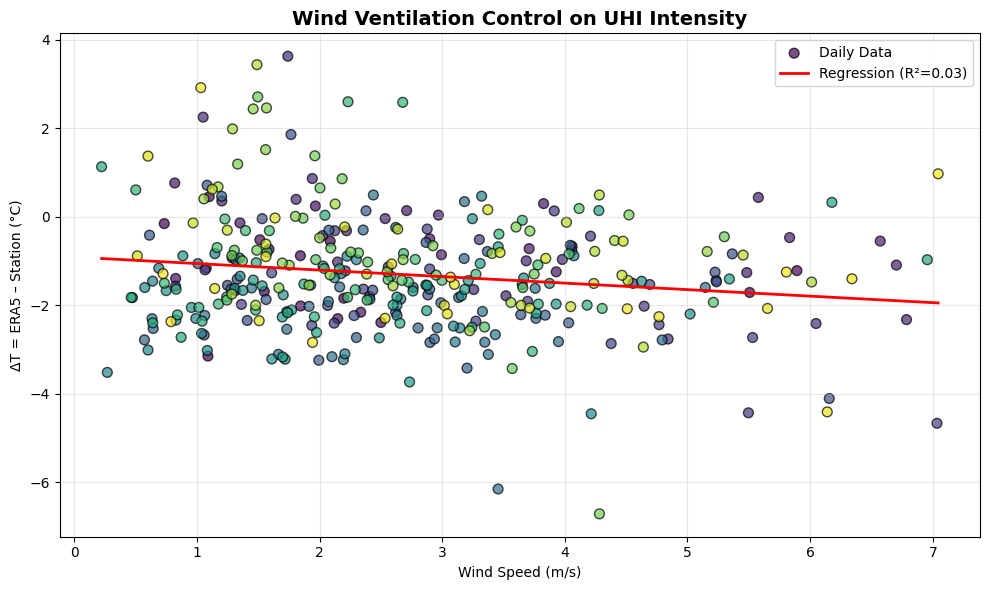

In [30]:
print("\n=== ΔT vs Wind Speed Regression ===")

df_ws = merged_wind.dropna(subset=["delta_T", "wind_speed"]).copy()

X = df_ws[["wind_speed"]].values
y = df_ws["delta_T"].values

model = LinearRegression()
model.fit(X, y)

y_pred = model.predict(X)
r2 = r2_score(y, y_pred)

slope = model.coef_[0]
intercept = model.intercept_

print(f"Slope: {slope:.3f}  (°C per m/s)")
print(f"Intercept: {intercept:.3f} °C")
print(f"R² = {r2:.3f}")

# Scatter plot with regression line
plt.figure(figsize=(10, 6))
plt.scatter(df_ws["wind_speed"], df_ws["delta_T"],
            c=df_ws["date"].dt.dayofyear,
            cmap="viridis", s=50, edgecolor="black", alpha=0.7,
            label="Daily Data")

# Regression line
x_line = np.linspace(df_ws["wind_speed"].min(), df_ws["wind_speed"].max(), 100)
y_line = model.predict(x_line.reshape(-1, 1))
plt.plot(x_line, y_line, color="red", linewidth=2,
         label=f"Regression (R²={r2:.2f})")

plt.xlabel("Wind Speed (m/s)")
plt.ylabel("ΔT = ERA5 – Station (°C)")
plt.title("Wind Ventilation Control on UHI Intensity", fontsize=14, fontweight="bold")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

Wind speed shows a slight cooling effect on UHI (slope = –0.147 °C per m/s), meaning stronger winds mildly reduce the urban–rural temperature difference.
However, the relationship is very weak (R² = 0.03), indicating that wind speed explains almost none of the UHI variability. Therefore, Wind has a minor ventilating effect, but it is not a major driver of UHI in this dataset.

## Heatwave-only Wind-conditioned UHI


=== Heatwave × Wind UHI Suppression Analysis ===
Heatwave threshold (95th percentile): 30.14°C
Heatwave days: 19 days

Heatwave-day regression:
  Slope: -0.051
  R²:    0.002


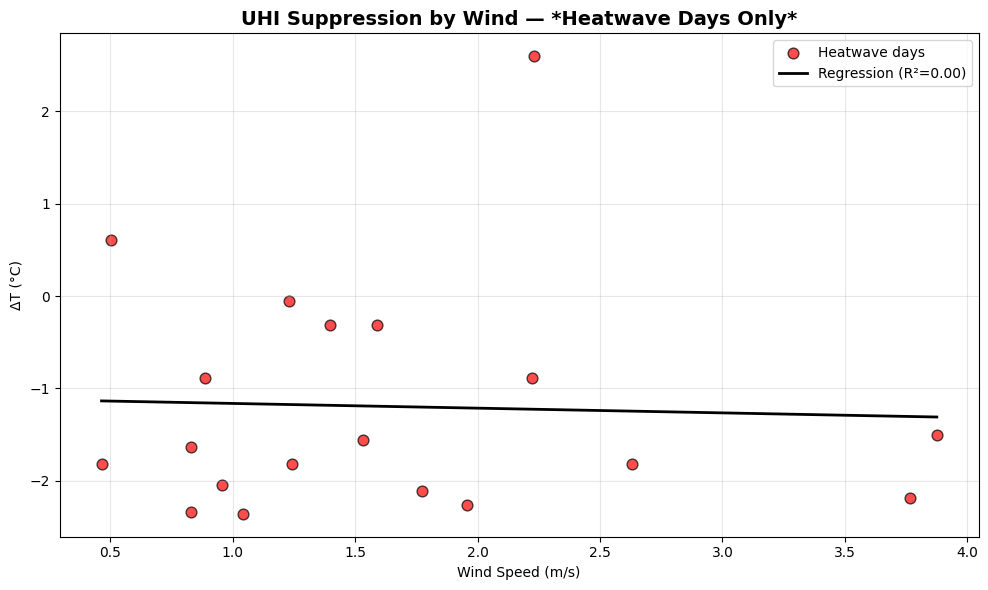

In [31]:
print("\n=== Heatwave × Wind UHI Suppression Analysis ===")

# Heatwave = 95th percentile of Wien temperatures
hw_threshold = wien_temp_series.quantile(0.95)
hw_mask = wien_temp_series >= hw_threshold

print(f"Heatwave threshold (95th percentile): {hw_threshold:.2f}°C")
print(f"Heatwave days: {hw_mask.sum()} days")

# Extract heatwave-only rows
df_hw = merged_wind[merged_wind["date"].isin(wien_temp_series[hw_mask].index)].copy()
df_hw = df_hw.dropna(subset=["delta_T", "wind_speed"])

# Fit regression
X_hw = df_hw[["wind_speed"]].values
y_hw = df_hw["delta_T"].values

model_hw = LinearRegression().fit(X_hw, y_hw)
y_hw_pred = model_hw.predict(X_hw)
r2_hw = r2_score(y_hw, y_hw_pred)

print(f"\nHeatwave-day regression:")
print(f"  Slope: {model_hw.coef_[0]:.3f}")
print(f"  R²:    {r2_hw:.3f}")

# Scatter plot with regression line
plt.figure(figsize=(10, 6))
plt.scatter(df_hw["wind_speed"], df_hw["delta_T"], color="red", s=60, alpha=0.7, edgecolor="black", label="Heatwave days")


x_line = np.linspace(df_hw["wind_speed"].min(), df_hw["wind_speed"].max(), 100)
y_line = model_hw.predict(x_line.reshape(-1, 1))
plt.plot(x_line, y_line, color="black", linewidth=2, label=f"Regression (R²={r2_hw:.2f})")

plt.xlabel("Wind Speed (m/s)")
plt.ylabel("ΔT (°C)")
plt.title("UHI Suppression by Wind — *Heatwave Days Only*", fontsize=14, fontweight="bold")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Merging all the variables & computing correlation matrix

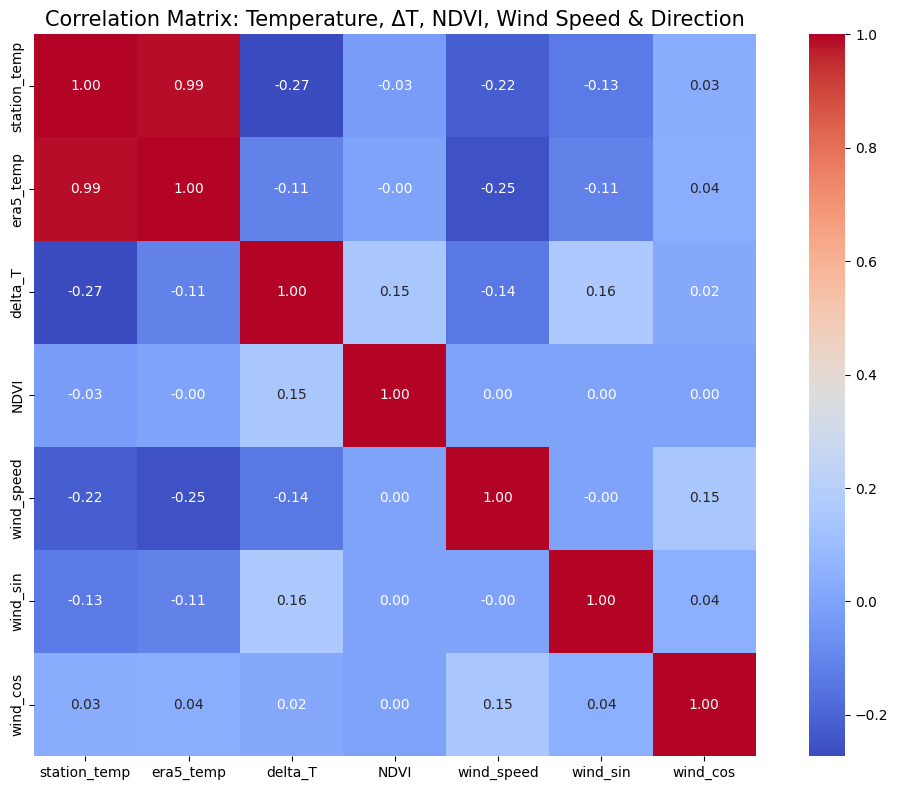

In [32]:
# ============================================================
# CORRELATION MATRIX USING: ΔT, NDVI, Wind Speed, Wind Direction
# Source tables: deltaT_df_clean, wind_daily, wind_extra
# ============================================================

# 1) Start from deltaT_df_clean (this contains ΔT, NDVI, station_temp, era5_temp)
corr_df = deltaT_df_clean[[
    "STAID",
    "date",
    "station_temp",
    "era5_temp",
    "delta_T",
    "NDVI"
]].copy()

# Ensure datetime
corr_df["date"] = pd.to_datetime(corr_df["date"])

# 2) Merge wind SPEED
corr_df = corr_df.merge(
    wind_daily[["date", "wind_speed"]],
    on="date",
    how="left"
)

# 3) Merge wind DIRECTION components: wind_sin, wind_cos
corr_df = corr_df.merge(
    wind_extra,           # indexed by date
    left_on="date",
    right_index=True,
    how="left"
)

# 4) Clean
corr_df = corr_df.dropna()

# 5) Compute correlation matrix
corr = corr_df[[
    "station_temp",
    "era5_temp",
    "delta_T",
    "NDVI",
    "wind_speed",
    "wind_sin",
    "wind_cos"
]].corr()

# 6) Plot
plt.figure(figsize=(11, 8))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Correlation Matrix: Temperature, ΔT, NDVI, Wind Speed & Direction", fontsize=15)
plt.tight_layout()
plt.show()

## Summary of Findings
- ERA5 systematically underestimates urban temperatures, especially in summer and on calm days.
- NDVI is a strong predictor of the grid–station discrepancy: greener areas → smaller error; urbanized areas → larger bias.
- UHI appears to be an additive effect: the additive temperature difference fits a Gaussian distribution, not the multiplicative log-ratio.
- Weather context (wind) also conditions the bias, with calm days producing the largest ΔT.

Part of ERA5’s temperature bias is not random—it is systematically explained by vegetation cover and urbanization intensity. This finding directly addresses the “Graal” of the hackathon: showing that dense urbanism explains why gridded datasets deviate from ground truth.

In [33]:
print("\n=== Week-3 Summary Metrics ===")

#  metrics
annual_mean_uhi = uhi_intensity.mean()
annual_max_uhi = uhi_intensity.max()
annual_std_uhi = uhi_intensity.std()

hw_threshold = wien_temp_series.quantile(0.95)
hw_days = (wien_temp_series >= hw_threshold).sum()

mean_hw_uhi = uhi_intensity[wien_temp_series >= hw_threshold].mean()

summary_table = pd.DataFrame({ "Metric": [ "Mean UHI (annual)", "Max UHI (annual)", "Std Dev UHI", "Heatwave Temp Threshold (95th pct)", "Number of Heatwave Days", "Mean UHI during Heatwaves", "ΔT–Wind Slope", "Heatwave ΔT–Wind Slope" ], "Value": [ f"{annual_mean_uhi:.3f} °C", f"{annual_max_uhi:.3f} °C", f"{annual_std_uhi:.3f} °C", f"{hw_threshold:.2f} °C", f"{hw_days}", f"{mean_hw_uhi:.3f} °C", f"{slope:.3f} °C per m/s", f"{model_hw.coef_[0]:.3f} °C per m/s" ] })

display(summary_table)


=== Week-3 Summary Metrics ===


,Metric,Value
0,Mean UHI (annual),0.151 °C
1,Max UHI (annual),0.653 °C
2,Std Dev UHI,0.151 °C
3,Heatwave Temp Threshold (95th pct),30.14 °C
4,Number of Heatwave Days,19
5,Mean UHI during Heatwaves,0.237 °C
6,ΔT–Wind Slope,-0.147 °C per m/s
7,Heatwave ΔT–Wind Slope,-0.051 °C per m/s


## Comparing Three Climatic Regimes: SE England (Maritime), Emilia-Romagna (Mediterranean), and Wien (Continental)

We repeat the same UHI and discrepancy metrics for SE England and Emilia-Romagna,
allowing us to compare:

- NDVI structure
- UHI intensity
- ERA5 bias patterns
- Geographic effects (continentality, latitude, distance to sea)

We have chosen Emilia-Romagna because it is located within the Po Valley, which is known as one of the most polluted regions in Europe.

In [78]:
# REGION 2 - SE england

SE_DISTRICTS = [
    # Kent districts
    "Ashford", "Canterbury", "Dartford", "Dover", "Folkestone and Hythe",
    "Gravesham", "Maidstone", "Medway", "Sevenoaks", "Swale", "Thanet",
    "Tonbridge and Malling", "Tunbridge Wells",

    # East Sussex districts
    "Eastbourne", "Hastings", "Lewes", "Rother", "Wealden",

    # West Sussex districts
    "Adur", "Arun", "Chichester", "Crawley", "Horsham", "Mid Sussex",
    "Worthing",

    # Hampshire districts + unitaries
    "Basingstoke and Deane", "East Hampshire", "Eastleigh", "Fareham",
    "Gosport", "Hart", "Havant", "New Forest", "Portsmouth",
    "Rushmoor", "Southampton", "Test Valley", "Winchester",

    # Isle of Wight
    "Isle of Wight",

    # Berkshire (unitaries)
    "Bracknell Forest", "Reading", "Slough", "West Berkshire",
    "Windsor and Maidenhead", "Wokingham",

    # Buckinghamshire
    "Buckinghamshire",

    # Oxfordshire districts
    "Cherwell", "Oxford", "South Oxfordshire", "Vale of White Horse",
    "West Oxfordshire",

    # Milton Keynes
    "Milton Keynes",

    # Brighton and Hove
    "Brighton and Hove"
]

SE_REGION = gadm_europe[gadm_europe["NAME_2"].isin(SE_DISTRICTS)].copy()

# Dissolve to one region
SE_REGION = SE_REGION.dissolve().to_crs("EPSG:4326")

print("== SE england Region  ==")
print("Area covers:", SE_REGION.total_bounds)

# REGION 3 — Emilia-Romagna (Po Valley, Northern Italy)

PO_REGION = gadm_europe[gadm_europe["NAME_1"] == "Emilia-Romagna"].copy()

# Dissolve Level-1 region into single polygon
PO_REGION = PO_REGION.dissolve().to_crs("EPSG:4326")

print("== Emilia-Romagna / Po Valley Region  ==")
print("Bounds:", PO_REGION.total_bounds)


== SE england Region  ==
Area covers: [-1.591723   50.574642    0.724947   52.19633617]
== Emilia-Romagna / Po Valley Region  ==
Bounds: [ 9.19908714 43.74160004 12.75659275 45.14007187]


Region: England
 22 station(s) found
  IDs: [274, 1634, 1639, 1844, 1845, 1859, 1860, 1863, 1864, 1865] ...

Loaded 462,075 temperature values
  Stations: 22
  Date range: 1814-12-31 00:00:00 → 2025-08-30 00:00:00
  Temp range: -9.6 → 40.2 °C
  Records in 2023: 5,064


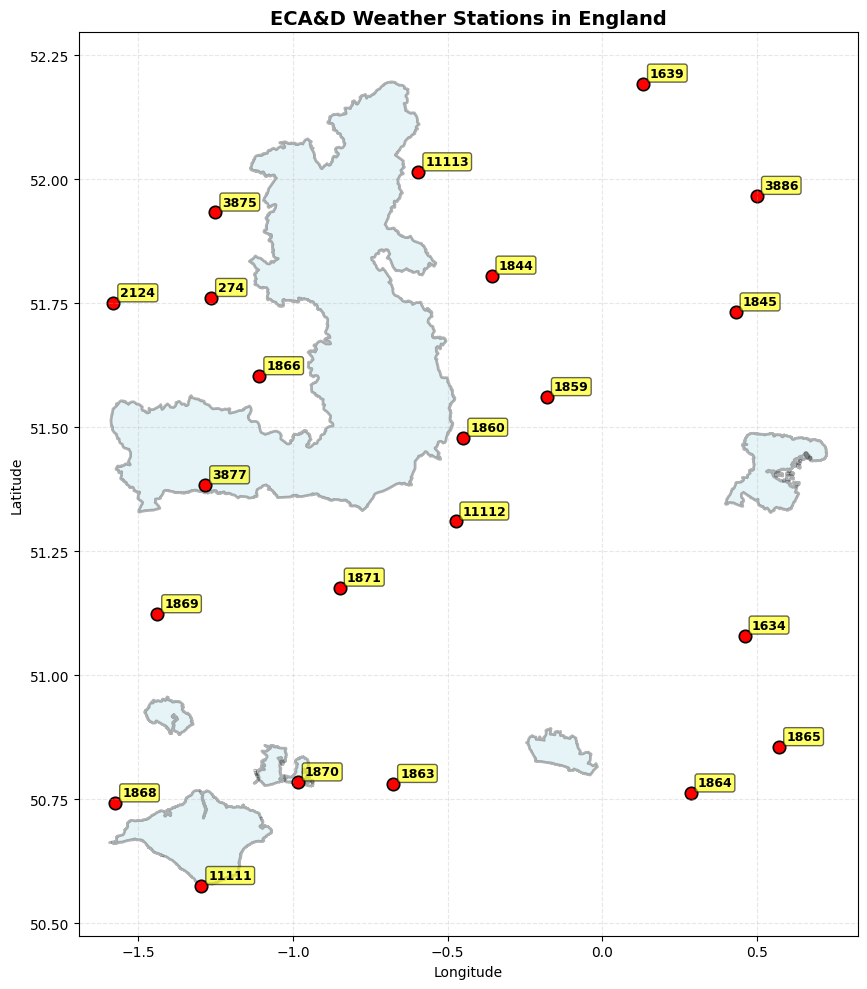

stations_in_city_gdf len = 22
     STAID                                          name    CN    LAT_DMS  \
210    274  RADCLIFFE METEOROLOGICAL STATION OXFORD       GB    +51:45:39   
850   1634  GOUDHURST                                     GB    +51:04:48   
855   1639  CAMBRIDGE (B. GDNS)                           GB    +52:11:35   
932   1844  ROTHAMSTED                                    GB    +51:48:21   
933   1845  WRITTLE                                       GB    +51:43:54   

        LON_DMS  HGHT        lat       lon                   geometry  
210  -001:15:50    63  51.760833 -1.263889  POINT (-1.26389 51.76083)  
850  +000:27:36    85  51.080000  0.460000         POINT (0.46 51.08)  
855  +000:07:54    13  52.193056  0.131667   POINT (0.13167 52.19306)  
932  -000:21:29   128  51.805833 -0.358056  POINT (-0.35806 51.80583)  
933  +000:25:51    32  51.731667  0.430833   POINT (0.43083 51.73167)  
Region: Emilia-Romagna (Po Valley)
Stations found: 379
Example IDs: [170, 8

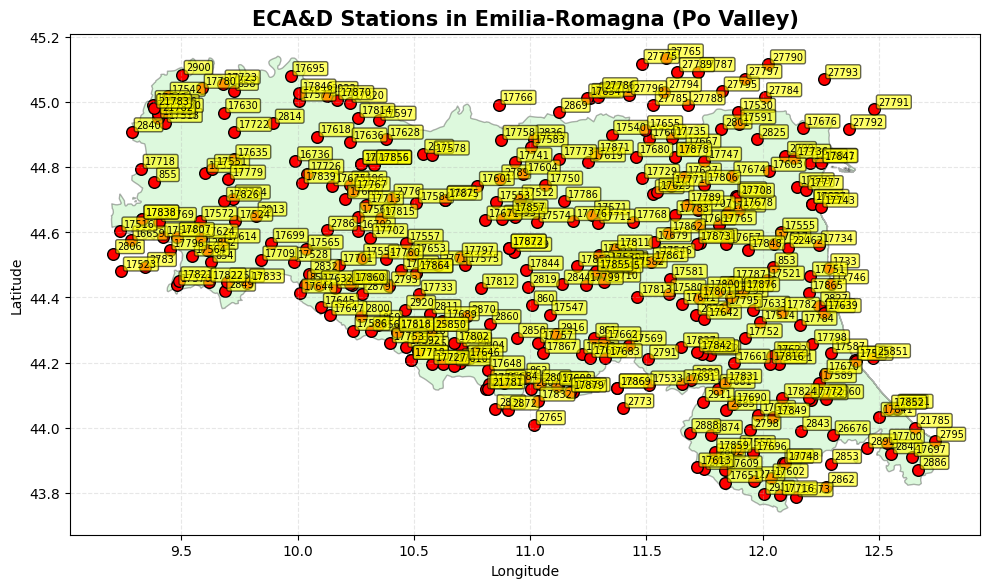

In [67]:
# Restrict to study region bounding box
roi = SE_REGION
roi_4326 = roi.to_crs(CRS_WGS84)
minx, miny, maxx, maxy = roi_4326.total_bounds

mask = ( (stations_df["lon"] >= minx) & (stations_df["lon"] <= maxx) & (stations_df["lat"] >= miny) & (stations_df["lat"] <= maxy) )

stations_in_city = stations_df[mask].copy()
stations_in_city_gdf = gpd.GeoDataFrame( stations_in_city, geometry=gpd.points_from_xy(stations_in_city["lon"], stations_in_city["lat"]), crs=CRS_WGS84, )

region_label = roi.iloc[0].get("NAME_1", "Selected region")
print(f"Region: {region_label}")
print(f" {len(stations_in_city_gdf)} station(s) found")
print("  IDs:", list(stations_in_city_gdf["STAID"].head(10)), "...")
station_ids = stations_in_city_gdf["STAID"].tolist()

# LOAD & CLEAN TX TEMPERATURE DATA
tx_records = []

for sid in station_ids:
    fp = ECAD_TX_DIR / f"TX_STAID{sid:06d}.txt"
    df = pd.read_csv( fp, skiprows=21, header=None, names=["STAID", "SOUID", "DATE", "TX", "Q_TX"], sep=",", skipinitialspace=True, encoding="utf-8", on_bad_lines="skip", engine="python", )

    df = df[["STAID", "DATE", "TX", "Q_TX"]]
    df["STAID"] = sid

    df["DATE"] = pd.to_numeric(df["DATE"], errors="coerce")
    df = df.dropna(subset=["DATE"])

    tx_records.append(df)

# Merge all stations
tx_df = pd.concat(tx_records, ignore_index=True).dropna(subset=["DATE"])
tx_df["STAID"] = tx_df["STAID"].astype(int)
tx_df["DATE"] = tx_df["DATE"].astype(int)

# DATE → datetime
tx_df["date"] = pd.to_datetime(tx_df["DATE"].astype(str), format="%Y%m%d", errors="coerce")

# Remove missing/invalid TX and convert 0.1°C → °C
tx_df = tx_df[tx_df["TX"] != -9999].copy()
tx_df["tx_celsius"] = pd.to_numeric(tx_df["TX"], errors="coerce") / 10.0

tx_roi = tx_df.dropna(subset=["STAID", "date"])[["STAID", "date", "tx_celsius", "Q_TX"]]

print(f"\nLoaded {len(tx_roi):,} temperature values")
print(f"  Stations: {tx_roi['STAID'].nunique()}")
print(f"  Date range: {tx_roi['date'].min()} → {tx_roi['date'].max()}")
print(f"  Temp range: {tx_roi['tx_celsius'].min():.1f} → {tx_roi['tx_celsius'].max():.1f} °C")

tx_roi_year = tx_roi[tx_roi["date"].dt.year == TARGET_YEAR]
print(f"  Records in {TARGET_YEAR}: {len(tx_roi_year):,}")

# Map of stations
boundary_gdf = roi_4326
stations_plot = stations_in_city_gdf.to_crs(CRS_WGS84)

fig, ax = plt.subplots(figsize=(12, 10))
boundary_gdf.plot(ax=ax, facecolor="lightblue", edgecolor="black", alpha=0.3, linewidth=2)
stations_plot.plot(ax=ax, color="red", markersize=80, marker="o", edgecolor="black", linewidth=1.2)

for _, r in stations_plot.iterrows():
    ax.annotate( str(r["STAID"]), (r.geometry.x, r.geometry.y), xytext=(5, 5), textcoords="offset points", fontsize=9, weight="bold", bbox=dict(boxstyle="round,pad=0.2", fc="yellow", alpha=0.6), )

minx, miny, maxx, maxy = boundary_gdf.total_bounds
ax.set_xlim(minx - 0.1, maxx + 0.1)
ax.set_ylim(miny - 0.1, maxy + 0.1)

ax.set_title(f"ECA&D Weather Stations in {region_label}", fontsize=14, weight="bold")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(alpha=0.3, linestyle="--")

plt.tight_layout()
plt.show()

print("stations_in_city_gdf len =", len(stations_in_city_gdf))
print(stations_in_city_gdf.head())

# ============================================================
# LOAD STATION DATA FOR EMILIA-ROMAGNA (Po Valley)
# ============================================================

roi = PO_REGION
roi_4326 = roi.to_crs(CRS_WGS84)

minx, miny, maxx, maxy = roi_4326.total_bounds

mask = (
        (stations_df["lon"] >= minx) & (stations_df["lon"] <= maxx) &
        (stations_df["lat"] >= miny) & (stations_df["lat"] <= maxy)
)

stations_po = stations_df[mask].copy()
stations_po_gdf = gpd.GeoDataFrame(
    stations_po,
    geometry=gpd.points_from_xy(stations_po["lon"], stations_po["lat"]),
    crs=CRS_WGS84,
)

region_label = "Emilia-Romagna (Po Valley)"
print(f"Region: {region_label}")
print(f"Stations found: {len(stations_po_gdf)}")
print("Example IDs:", list(stations_po_gdf["STAID"].head(10)), "...")

station_ids = stations_po_gdf["STAID"].tolist()

# ---- Load daily temperature data ----
tx_records = []

for sid in station_ids:
    fp = ECAD_TX_DIR / f"TX_STAID{sid:06d}.txt"
    df = pd.read_csv(
        fp,
        skiprows=21,
        header=None,
        names=["STAID", "SOUID", "DATE", "TX", "Q_TX"],
        sep=",",
        skipinitialspace=True,
        encoding="utf-8",
        on_bad_lines="skip",
        engine="python",
    )
    df = df[["STAID", "DATE", "TX", "Q_TX"]]
    df["STAID"] = sid
    df["DATE"] = pd.to_numeric(df["DATE"], errors="coerce")
    df = df.dropna(subset=["DATE"])
    tx_records.append(df)

tx_po = pd.concat(tx_records, ignore_index=True).dropna(subset=["DATE"])
tx_po["STAID"] = tx_po["STAID"].astype(int)
tx_po["date"] = pd.to_datetime(tx_po["DATE"].astype(str), format="%Y%m%d")
tx_po = tx_po[tx_po["TX"] != -9999].copy()
tx_po["tx_celsius"] = tx_po["TX"] / 10.0

print(f"\nLoaded {len(tx_po):,} Po Valley temperature values")
print(f"Stations: {tx_po['STAID'].nunique()}")
print(f"Date range: {tx_po['date'].min()} → {tx_po['date'].max()}")
print(f"Temp range: {tx_po['tx_celsius'].min():.1f} → {tx_po['tx_celsius'].max():.1f} °C")

# ============================================================
# MAP — Po Valley stations
# ============================================================

boundary_gdf = roi_4326
stations_plot = stations_po_gdf.to_crs(CRS_WGS84)

fig, ax = plt.subplots(figsize=(10, 9))
boundary_gdf.plot(ax=ax, facecolor="lightgreen", edgecolor="black", alpha=0.3)
stations_plot.plot(ax=ax, color="red", markersize=70, marker="o", edgecolor="black")

for _, r in stations_plot.iterrows():
    ax.annotate(
        str(r["STAID"]),
        (r.geometry.x, r.geometry.y),
        xytext=(3, 3),
        textcoords="offset points",
        fontsize=7,
        bbox=dict(boxstyle="round,pad=0.2", fc="yellow", alpha=0.6),
    )

ax.set_title("ECA&D Stations in Emilia-Romagna (Po Valley)", fontsize=15, weight="bold")
ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
ax.grid(alpha=0.3, linestyle="--")

plt.tight_layout()
plt.show()

Shape: (2155, 2162)
Valid pixels: 613,013
Nodata pixels: 4,046,097

NDVI Statistics:


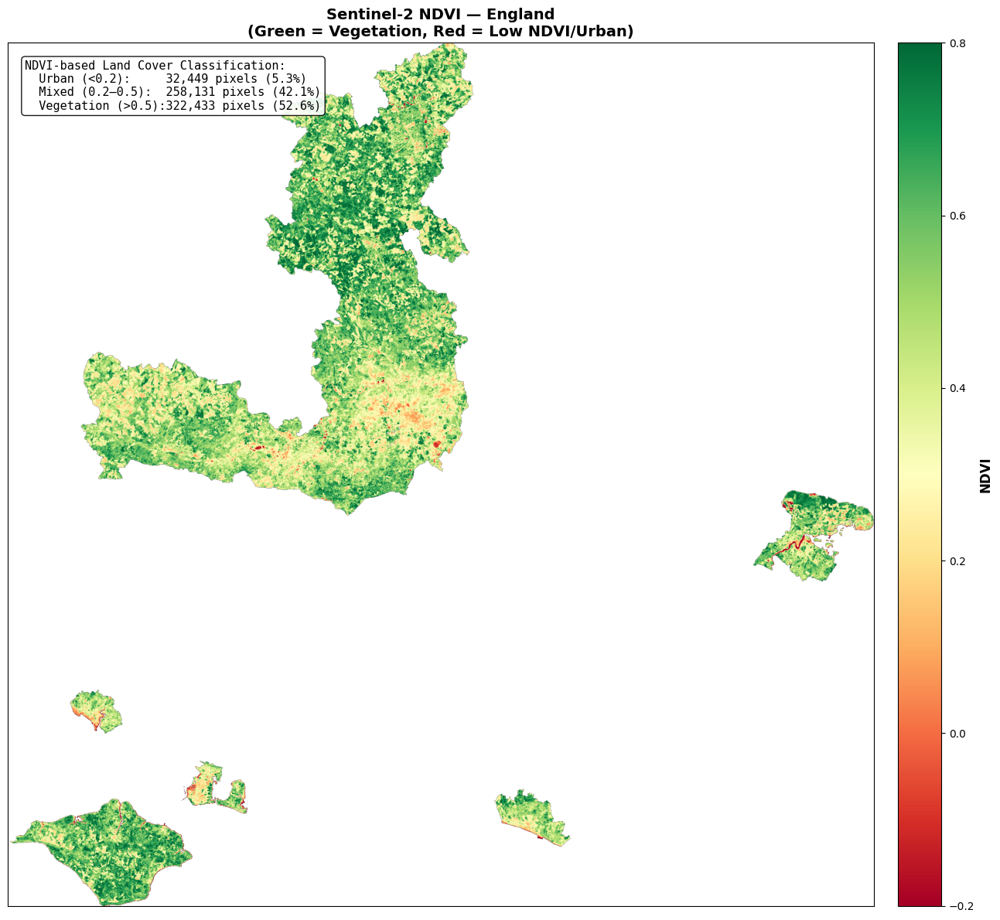

Shape: (1303, 2243)
Valid pixels: 2,055,883
Nodata pixels: 866,746

NDVI Statistics:


,0
count,2.055883e+06
mean,4.758939e-01
std,2.076261e-01
min,-9.370079e-01
25%,3.543307e-01
50%,5.039370e-01
75%,6.220472e-01
max,9.763780e-01


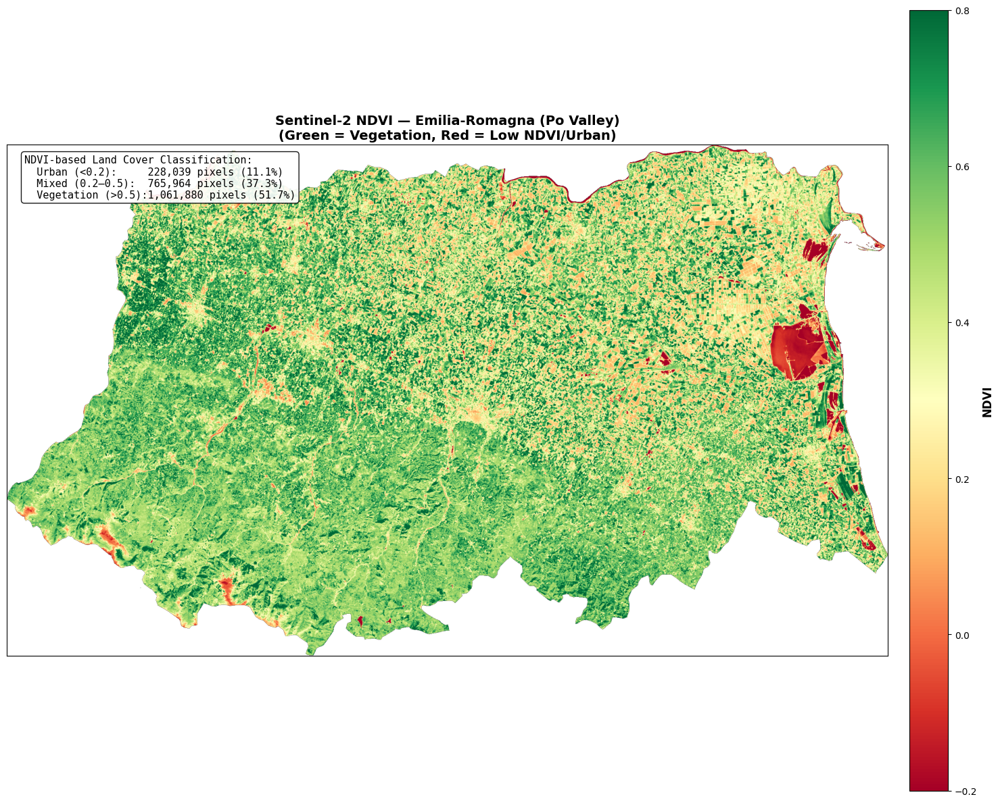

In [69]:
with rasterio.open(ndvi_path) as src:

    roi_proj = SE_REGION.to_crs(src.crs)
    geom = [g for g in roi_proj.geometry]
    out, transform = rasterio.mask.mask(src, geom, crop=True, all_touched=False)
    ndvi_scaled = convert_ndvi(out[0], nodata=src.meta.get("nodata", 255))

valid = ndvi_scaled[~np.isnan(ndvi_scaled)]

print(f"Shape: {ndvi_scaled.shape}")
print(f"Valid pixels: {valid.size:,}")
print(f"Nodata pixels: {np.isnan(ndvi_scaled).sum():,}")
print("\nNDVI Statistics:")
pd.DataFrame(valid).describe()


# NDVI-Based Land Cover Classification
urban = (valid < 0.2).sum()
veg = (valid > 0.5).sum()
mixed = len(valid) - urban - veg
tot = len(valid)

fig, ax = plt.subplots(figsize=(16, 12))

im = ax.imshow(ndvi_scaled, cmap="RdYlGn", vmin=-0.2, vmax=0.8)
cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label("NDVI", fontsize=12, fontweight="bold")

ax.set_title(f"Sentinel-2 NDVI — {SE_REGION['NAME_1'].iloc[0]}\n" "(Green = Vegetation, Red = Low NDVI/Urban)", fontsize=14, fontweight='bold')
ax.set_xticks([]); ax.set_yticks([])
text = (
    f"NDVI-based Land Cover Classification:\n"
    f"  Urban (<0.2):     {urban:,} pixels ({urban/tot*100:.1f}%)\n"
    f"  Mixed (0.2–0.5):  {mixed:,} pixels ({mixed/tot*100:.1f}%)\n"
    f"  Vegetation (>0.5):{veg:,} pixels ({veg/tot*100:.1f}%)"
)
ax.text(0.02, 0.98, text, transform=ax.transAxes, fontsize=11, va="top", family="monospace", bbox=dict(boxstyle="round", facecolor="white", alpha=0.9))

plt.tight_layout()
plt.show()

# ============================================================
# NDVI Extraction for Emilia–Romagna (Po Valley)
# ============================================================

with rasterio.open(ndvi_path) as src:

    # Reproject region polygon into NDVI raster CRS
    roi_proj = PO_REGION.to_crs(src.crs)

    geom = [g for g in roi_proj.geometry]

    # Extract NDVI pixels inside Emilia–Romagna
    out, transform = rasterio.mask.mask(
        src, geom, crop=True, all_touched=False
    )

    ndvi_scaled = convert_ndvi(out[0], nodata=src.meta.get("nodata", 255))

# Filter valid NDVI pixels
valid = ndvi_scaled[~np.isnan(ndvi_scaled)]

print(f"Shape: {ndvi_scaled.shape}")
print(f"Valid pixels: {valid.size:,}")
print(f"Nodata pixels: {np.isnan(ndvi_scaled).sum():,}")
print("\nNDVI Statistics:")
display(pd.DataFrame(valid).describe())

# ------------------------------------------------------------
# NDVI Land-Cover Classification
# ------------------------------------------------------------
urban = (valid < 0.2).sum()
veg   = (valid > 0.5).sum()
mixed = len(valid) - urban - veg
tot   = len(valid)

# ------------------------------------------------------------
# NDVI PLOT
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(16, 12))

im = ax.imshow(ndvi_scaled, cmap="RdYlGn", vmin=-0.2, vmax=0.8)

cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label("NDVI", fontsize=12, fontweight="bold")

ax.set_title(
    "Sentinel-2 NDVI — Emilia-Romagna (Po Valley)\n"
    "(Green = Vegetation, Red = Low NDVI/Urban)",
    fontsize=14, fontweight="bold"
)

ax.set_xticks([])
ax.set_yticks([])

text = (
    f"NDVI-based Land Cover Classification:\n"
    f"  Urban (<0.2):     {urban:,} pixels ({urban/tot*100:.1f}%)\n"
    f"  Mixed (0.2–0.5):  {mixed:,} pixels ({mixed/tot*100:.1f}%)\n"
    f"  Vegetation (>0.5):{veg:,} pixels ({veg/tot*100:.1f}%)"
)

ax.text(
    0.02, 0.98,
    text,
    transform=ax.transAxes,
    fontsize=11,
    va="top",
    family="monospace",
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.9)
)

plt.tight_layout()
plt.show()


The three regions show clearly different land-cover structures. South-East England is the most vegetated, with over half of its pixels showing high NDVI and very little urban land, indicating a landscape that naturally limits UHI through continuous greenery. Emilia-Romagna (Po Valley) has similar total vegetation percentage but much more fragmented patterns and a larger share of mixed/low-NDVI surfaces, reflecting its dense settlements and intensive agriculture. This fragmentation typically reduces cooling efficiency. Wien is the most urbanized of the three, with compact built-up areas and vegetation concentrated in parks and peripheral zones. Overall, England represents a predominantly green landscape, the Po Valley reflects a highly developed and polluted region with broken vegetation structure, and Vienna shows a strong urban core with sharper green-urban contrasts—patterns that directly influence UHI behaviour.

In [70]:
# ============================================================
# MULTI-REGION DATA PREPARATION: WIEN, SE ENGLAND, EMILIA-ROMAGNA
# ============================================================

CRS_WGS84 = "EPSG:4326"
RURAL_RING_KM = 30  # for UHI/NDVI comparison

TARGET_SEASON_MAP = {
    12: "Winter", 1: "Winter", 2: "Winter",
    3: "Spring", 4: "Spring", 5: "Spring",
    6: "Summer", 7: "Summer", 8: "Summer",
    9: "Autumn", 10: "Autumn", 11: "Autumn",
}

# ------------------------------------------------------------
# Build rural buffer ring around city region
# ------------------------------------------------------------
def build_ring(region_gdf, ring_km=30):
    city = region_gdf.to_crs(3857).buffer(0)
    outer = city.buffer(ring_km * 1000.0)
    ring = outer.difference(city)
    ring_gdf = gpd.GeoDataFrame(
        geometry=[ring.unary_union], crs=3857
    ).to_crs(CRS_WGS84)
    return ring_gdf


# ------------------------------------------------------------
# Sentinel-3 NDVI city & ring time series
# ------------------------------------------------------------
def s3_ndvi_timeseries(region_gdf, ring_gdf, year=TARGET_YEAR):
    ts_city = {}
    ts_ring = {}

    for f in s3_files:
        date = pd.to_datetime(Path(f).stem.split("_")[-1])
        if date.year != year:
            continue

        with rasterio.open(f) as src:
            # city NDVI
            city_geom = region_gdf.to_crs(src.crs).geometry
            city_clip, _ = rasterio_mask(src, list(city_geom), crop=True)
            ndvi_city = convert_s3(city_clip[0], src.meta.get("nodata", 255))

            # ring NDVI
            ring_geom = ring_gdf.to_crs(src.crs).geometry
            ring_clip, _ = rasterio_mask(src, list(ring_geom), crop=True)
            ndvi_ring = convert_s3(ring_clip[0], src.meta.get("nodata", 255))

        ts_city[date] = np.nanmean(ndvi_city)
        ts_ring[date] = np.nanmean(ndvi_ring)

    return (
        pd.Series(ts_city).sort_index().rename("ndvi_city"),
        pd.Series(ts_ring).sort_index().rename("ndvi_ring"),
    )


# ------------------------------------------------------------
# ERA5 temperature (city vs rural ring) + wind
# ------------------------------------------------------------
def era5_city_ring_timeseries(region_gdf, ring_gdf):
    xmin_c, ymin_c, xmax_c, ymax_c = region_gdf.total_bounds
    xmin_r, ymin_r, xmax_r, ymax_r = ring_gdf.total_bounds

    da_city = ds_all["t2m_celsius"].sel(
        longitude=slice(xmin_c, xmax_c),
        latitude=slice(ymax_c, ymin_c),
    )

    da_ring = ds_all["t2m_celsius"].sel(
        longitude=slice(xmin_r, xmax_r),
        latitude=slice(ymax_r, ymin_r),
    )

    city_temp = da_city.mean(["latitude", "longitude"]).to_series().rename("temp_city")
    ring_temp = da_ring.mean(["latitude", "longitude"]).to_series().rename("temp_rural")

    # wind speed
    wind = np.sqrt(ds_all["u10"] ** 2 + ds_all["v10"] ** 2)
    wind_region = wind.sel(
        longitude=slice(xmin_c, xmax_c),
        latitude=slice(ymax_c, ymin_c),
    )
    wind_series = wind_region.mean(["latitude", "longitude"]).to_series().rename("wind_speed")

    return city_temp, ring_temp, wind_series


# ------------------------------------------------------------
# Station-based temperature timeseries
# ------------------------------------------------------------
def station_daily_temp(region_gdf):
    roi_4326 = region_gdf.to_crs(CRS_WGS84)
    minx, miny, maxx, maxy = roi_4326.total_bounds

    mask = (
            (stations_df["lon"] >= minx) & (stations_df["lon"] <= maxx) &
            (stations_df["lat"] >= miny) & (stations_df["lat"] <= maxy)
    )

    stations_region = stations_df[mask].copy()
    ids = stations_region["STAID"].astype(int).tolist()

    tx_records = []
    for sid in ids:
        fp = Path(ECAD_TX_DIR) / f"TX_STAID{sid:06d}.txt"
        df = pd.read_csv(
            fp, skiprows=21, header=None,
            names=["STAID", "SOUID", "DATE", "TX", "Q_TX"],
            sep=",", skipinitialspace=True, encoding="utf-8",
            on_bad_lines="skip", engine="python"
        )
        df = df[["STAID", "DATE", "TX", "Q_TX"]]
        df["STAID"] = sid
        df["DATE"] = pd.to_numeric(df["DATE"], errors="coerce")
        df = df.dropna(subset=["DATE"])
        df = df[df["TX"] != -9999].copy()
        df["tx_celsius"] = pd.to_numeric(df["TX"], errors="coerce") / 10.0
        df["date"] = pd.to_datetime(df["DATE"].astype(int).astype(str), format="%Y%m%d")
        df = df[df["date"].dt.year == TARGET_YEAR]
        tx_records.append(df[["STAID", "date", "tx_celsius"]])

    if not tx_records:
        return None, stations_region

    tx_all = pd.concat(tx_records, ignore_index=True)
    daily = (
        tx_all.groupby("date")["tx_celsius"]
        .mean().sort_index().rename("station_temp")
    )
    return daily, stations_region


# ============================================================
# REGION RINGS
# ============================================================
WIEN_RING = build_ring(STUDY_REGION, RURAL_RING_KM)
SE_RING   = build_ring(SE_REGION, RURAL_RING_KM)
PO_RING   = build_ring(PO_REGION, RURAL_RING_KM)

# ============================================================
# NDVI TIME SERIES
# ============================================================
ndvi_wien_city, ndvi_wien_ring = s3_ndvi_timeseries(STUDY_REGION, WIEN_RING)
ndvi_se_city,   ndvi_se_ring   = s3_ndvi_timeseries(SE_REGION, SE_RING)
ndvi_po_city,   ndvi_po_ring   = s3_ndvi_timeseries(PO_REGION, PO_RING)

# ============================================================
# ERA5 TEMPERATURE + WIND
# ============================================================
wien_city_temp, wien_rural_temp, wind_wien = era5_city_ring_timeseries(STUDY_REGION, WIEN_RING)
se_city_temp,   se_rural_temp,   wind_se   = era5_city_ring_timeseries(SE_REGION, SE_RING)
po_city_temp,   po_rural_temp,   wind_po   = era5_city_ring_timeseries(PO_REGION, PO_RING)

# UHI intensity
uhi_wien = (wien_city_temp - wien_rural_temp).rename("uhi_wien")
uhi_se   = (se_city_temp   - se_rural_temp).rename("uhi_se")
uhi_po   = (po_city_temp   - po_rural_temp).rename("uhi_po")

# ============================================================
# ALIGN ALL SERIES ON COMMON DATES
# ============================================================
common_idx = (
    wien_city_temp.index
    .intersection(se_city_temp.index)
    .intersection(po_city_temp.index)
    .intersection(wind_wien.index)
    .intersection(wind_se.index)
    .intersection(wind_po.index)
)

wien_city_temp = wien_city_temp.reindex(common_idx)
se_city_temp   = se_city_temp.reindex(common_idx)
po_city_temp   = po_city_temp.reindex(common_idx)

uhi_wien = uhi_wien.reindex(common_idx)
uhi_se   = uhi_se.reindex(common_idx)
uhi_po   = uhi_po.reindex(common_idx)

wind_wien = wind_wien.reindex(common_idx)
wind_se   = wind_se.reindex(common_idx)
wind_po   = wind_po.reindex(common_idx)

# ============================================================
# STATION DAILY TEMPERATURE (for bias analysis)
# ============================================================
wien_station_daily, wien_st_meta = station_daily_temp(STUDY_REGION)
se_station_daily,   se_st_meta   = station_daily_temp(SE_REGION)
po_station_daily,   po_st_meta   = station_daily_temp(PO_REGION)

# ERA5–station bias tables
def build_bias(city_temp, station_daily):
    if station_daily is None:
        return None
    df = pd.concat(
        [city_temp.rename("era5_temp"), station_daily],
        axis=1,
        join="inner"
    )
    df["difference"] = df["era5_temp"] - df["station_temp"]
    return df

bias_wien = build_bias(wien_city_temp, wien_station_daily)
bias_se   = build_bias(se_city_temp,   se_station_daily)
bias_po   = build_bias(po_city_temp,   po_station_daily)

print("Prep done:")
print(f"  NDVI Wien: {len(ndvi_wien_city)}, SE: {len(ndvi_se_city)}, Emilia: {len(ndvi_po_city)}")
print(f"  UHI series length: {len(uhi_wien)} days")
if bias_wien is not None:
    print(f"  Wien station days: {len(bias_wien)}")
if bias_se is not None:
    print(f"  SE England station days: {len(bias_se)}")
if bias_po is not None:
    print(f"  Emilia-Romagna station days: {len(bias_po)}")

/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1221234366.py:23: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geometry=[ring.unary_union], crs=3857
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1221234366.py:23: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geometry=[ring.unary_union], crs=3857
/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1221234366.py:23: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geometry=[ring.unary_union], crs=3857


Prep done:
  NDVI Wien: 36, SE: 36, Emilia: 36
  UHI series length: 365 days
  Wien station days: 365
  SE England station days: 365
  Emilia-Romagna station days: 365


        date  ndvi_wien   ndvi_se   ndvi_po  season
0 2023-01-01  -0.111259  0.315840  0.021567  Winter
1 2023-01-11  -0.157650  0.319209  0.124105  Winter
2 2023-01-21  -0.245300  0.311477  0.065222  Winter
3 2023-02-01  -0.254896  0.284385  0.019289  Winter
4 2023-02-11  -0.293492  0.259707 -0.029839  Winter

=== NDVI STRUCTURE METRICS (3 Regions) ===


,Mean NDVI,Seasonal amplitude,Roughness (std)
Wien,0.021,0.555,0.170
SE England,0.385,0.318,0.087
Emilia-Romagna,0.182,0.480,0.133



=== UHI INTENSITY METRICS (3 Regions) ===


,Region,Mean UHI (°C),Max UHI (°C),Std UHI (°C)
0,Wien,0.151,0.653,0.151
1,SE England,0.047,0.754,0.100
2,Emilia-Romagna,0.122,0.778,0.260



Wien — Heatwave Amplification
  Threshold (95th): 30.14°C
  HW days: 19
  HW mean UHI: 0.237°C
  Annual mean UHI: 0.151°C
  Amplification factor: 1.56×

SE England — Heatwave Amplification
  Threshold (95th): 23.91°C
  HW days: 19
  HW mean UHI: 0.038°C
  Annual mean UHI: 0.047°C
  Amplification factor: 0.81×

Emilia-Romagna — Heatwave Amplification
  Threshold (95th): 31.66°C
  HW days: 19
  HW mean UHI: 0.354°C
  Annual mean UHI: 0.122°C
  Amplification factor: 2.90×

=== WIND SENSITIVITY (3 Regions) ===


,Region,dUHI/dWind (°C per m/s),"Corr(UHI,Wind)"
0,Wien,0.002,0.018
1,SE England,-0.008,-0.127
2,Emilia-Romagna,-0.005,-0.016



Wien — ERA5 Bias:
  Mean: -1.31°C
  RMSE: 1.86°C
  Summer: -1.63°C | Winter: -0.98°C

SE England — ERA5 Bias:
  Mean: -1.20°C
  RMSE: 2.35°C
  Summer: -1.51°C | Winter: -1.03°C

Emilia-Romagna — ERA5 Bias:
  Mean: -0.67°C
  RMSE: 1.32°C
  Summer: -1.16°C | Winter: -0.24°C

=== ERA5 BIAS SUMMARY (3 Regions) ===


,Mean bias (ERA5 - station),RMSE,Summer bias,Winter bias
Wien,-1.307,1.857,-1.634,-0.980
SE England,-1.205,2.347,-1.515,-1.034
Emilia-Romagna,-0.670,1.316,-1.156,-0.238


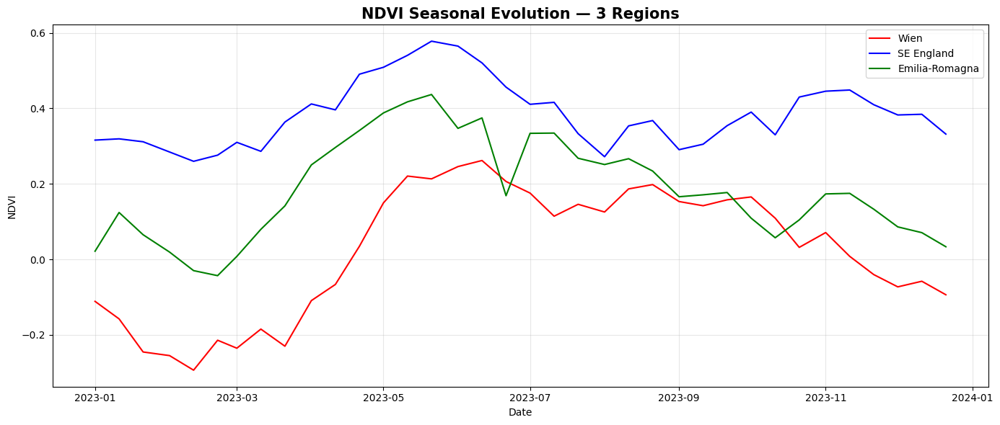

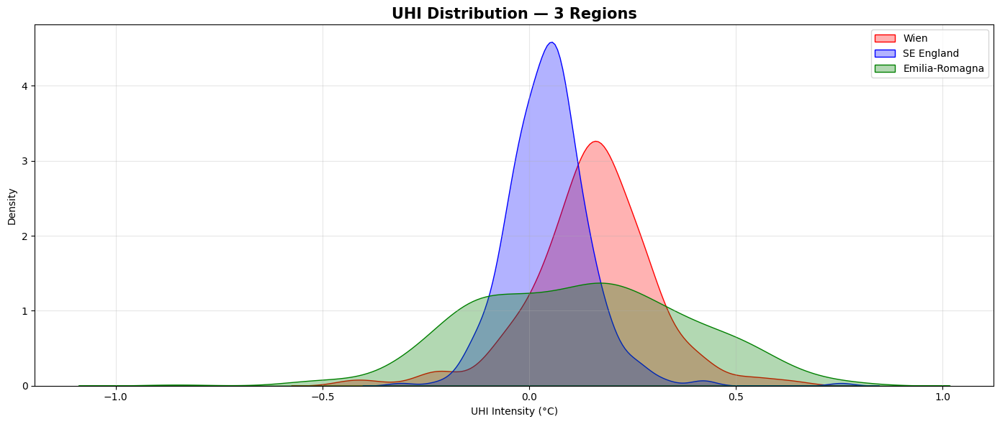

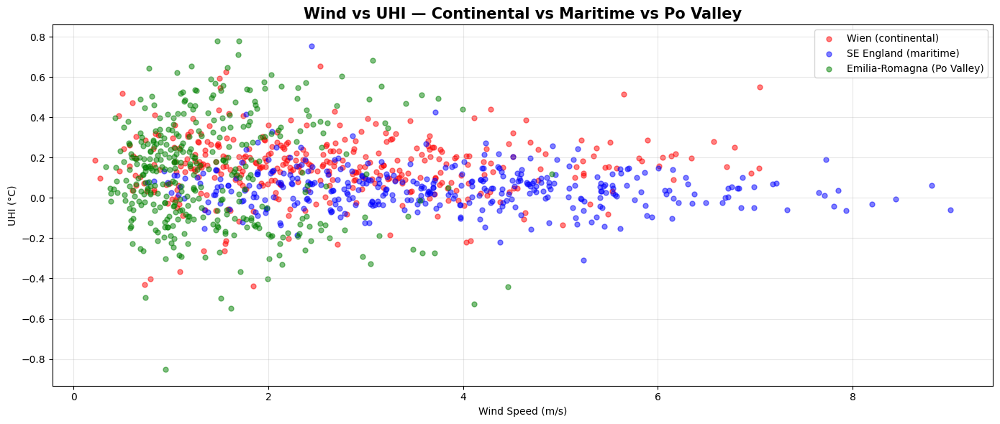

In [71]:
# ============================================================
# 3-REGION COMPARATIVE ANALYSIS: NDVI – UHI – WIND – BIAS
# Wien | SE England | Emilia-Romagna
# ============================================================

def season_from_dates(dates):
    return dates.month.map(TARGET_SEASON_MAP)

# ============================================================
# ---- NDVI MERGE: WIEN + SE + PO VALLEY
# ============================================================

ndvi_df = (
    pd.DataFrame({
        "date": ndvi_wien_city.index,
        "ndvi_wien": ndvi_wien_city.values,
    })
    .merge(
        pd.DataFrame({"date": ndvi_se_city.index, "ndvi_se": ndvi_se_city.values}),
        on="date",
        how="inner",
    )
    .merge(
        pd.DataFrame({"date": ndvi_po_city.index, "ndvi_po": ndvi_po_city.values}),
        on="date",
        how="inner",
    )
)

ndvi_df["date"] = pd.to_datetime(ndvi_df["date"], errors="coerce")
ndvi_df["season"] = ndvi_df["date"].dt.month.map(TARGET_SEASON_MAP)

print(ndvi_df.head())


# NDVI metrics function
def ndvi_metrics(series):
    return {
        "Mean NDVI": series.mean(),
        "Seasonal amplitude": series.max() - series.min(),
        "Roughness (std)": series.std(),
    }

ndvi_metrics_wien = ndvi_metrics(ndvi_df["ndvi_wien"])
ndvi_metrics_se   = ndvi_metrics(ndvi_df["ndvi_se"])
ndvi_metrics_po   = ndvi_metrics(ndvi_df["ndvi_po"])

ndvi_metrics_table = pd.DataFrame(
    [ndvi_metrics_wien, ndvi_metrics_se, ndvi_metrics_po],
    index=["Wien", "SE England", "Emilia-Romagna"],
)

print("\n=== NDVI STRUCTURE METRICS (3 Regions) ===")
display(ndvi_metrics_table.round(3))


# ============================================================
# ---- MERGE UHI + WIND FOR 3 REGIONS
# ============================================================

uhi_df = pd.DataFrame({
    "date": common_idx,
    "uhi_wien": uhi_wien.values,
    "uhi_se": uhi_se.values,
    "uhi_po": uhi_po.values,
    "wind_wien": wind_wien.values,
    "wind_se": wind_se.values,
    "wind_po": wind_po.values,
})

uhi_df["date"] = pd.to_datetime(uhi_df["date"])
uhi_df["season"] = uhi_df["date"].dt.month.map(TARGET_SEASON_MAP)


# ============================================================
# ---- BASIC UHI METRICS
# ============================================================

uhi_stats = pd.DataFrame({
    "Region": ["Wien", "SE England", "Emilia-Romagna"],
    "Mean UHI (°C)": [uhi_wien.mean(), uhi_se.mean(), uhi_po.mean()],
    "Max UHI (°C)":  [uhi_wien.max(), uhi_se.max(), uhi_po.max()],
    "Std UHI (°C)":  [uhi_wien.std(), uhi_se.std(), uhi_po.std()],
})

print("\n=== UHI INTENSITY METRICS (3 Regions) ===")
display(uhi_stats.round(3))


# ============================================================
# ---- HEATWAVE AMPLIFICATION (95th percentile)
# ============================================================

def heatwave_amplification(city_temp, uhi_series, label):
    threshold = city_temp.quantile(0.95)
    mask = city_temp >= threshold
    uhi_hw = uhi_series[mask]

    mean_hw = uhi_hw.mean()
    ampl = mean_hw / uhi_series.mean()

    print(f"\n{label} — Heatwave Amplification")
    print(f"  Threshold (95th): {threshold:.2f}°C")
    print(f"  HW days: {mask.sum()}")
    print(f"  HW mean UHI: {mean_hw:.3f}°C")
    print(f"  Annual mean UHI: {uhi_series.mean():.3f}°C")
    print(f"  Amplification factor: {ampl:.2f}×")

    return ampl

ampl_wien = heatwave_amplification(wien_city_temp, uhi_wien, "Wien")
ampl_se   = heatwave_amplification(se_city_temp,   uhi_se,   "SE England")
ampl_po   = heatwave_amplification(po_city_temp,   uhi_po,   "Emilia-Romagna")


# ============================================================
# ---- WIND SENSITIVITY: slope dUHI/dWind
# ============================================================

def wind_slope(uhi, wind):
    slope, intercept, r, *_ = stats.linregress(wind.values, uhi.values)
    return slope, r

slope_wien, r_wien = wind_slope(uhi_wien, wind_wien)
slope_se,   r_se   = wind_slope(uhi_se,   wind_se)
slope_po,   r_po   = wind_slope(uhi_po,   wind_po)

wind_sens_table = pd.DataFrame({
    "Region": ["Wien", "SE England", "Emilia-Romagna"],
    "dUHI/dWind (°C per m/s)": [slope_wien, slope_se, slope_po],
    "Corr(UHI,Wind)": [r_wien, r_se, r_po],
})

print("\n=== WIND SENSITIVITY (3 Regions) ===")
display(wind_sens_table.round(3))


# ============================================================
# ---- ERA5 BIAS SUMMARY
# ============================================================

def bias_summary(df, label):
    if df is None or df.empty:
        print(f"{label}: no station data available.")
        return None
    out = {}
    out["Mean bias (ERA5 - station)"] = df["difference"].mean()
    out["RMSE"] = np.sqrt((df["difference"] ** 2).mean())

    df = df.copy()
    df["season"] = season_from_dates(df.index)
    seasonal = df.groupby("season")["difference"].mean()
    out["Summer bias"] = seasonal.get("Summer", np.nan)
    out["Winter bias"] = seasonal.get("Winter", np.nan)

    print(f"\n{label} — ERA5 Bias:")
    print(f"  Mean: {out['Mean bias (ERA5 - station)']:.2f}°C")
    print(f"  RMSE: {out['RMSE']:.2f}°C")
    print(f"  Summer: {out['Summer bias']:.2f}°C | Winter: {out['Winter bias']:.2f}°C")
    return out

bias_metrics_wien = bias_summary(bias_wien, "Wien")
bias_metrics_se   = bias_summary(bias_se,   "SE England")
bias_metrics_po   = bias_summary(bias_po,   "Emilia-Romagna")

bias_table = pd.DataFrame(
    [bias_metrics_wien, bias_metrics_se, bias_metrics_po],
    index=["Wien", "SE England", "Emilia-Romagna"],
)

print("\n=== ERA5 BIAS SUMMARY (3 Regions) ===")
display(bias_table.round(3))


# ============================================================
# PLOTS — NDVI, UHI, WIND–UHI RELATION
# ============================================================

# ---- NDVI Seasonal Curves ----
plt.figure(figsize=(14,6))
sns.lineplot(data=ndvi_df, x="date", y="ndvi_wien", label="Wien", color="red")
sns.lineplot(data=ndvi_df, x="date", y="ndvi_se",   label="SE England", color="blue")
sns.lineplot(data=ndvi_df, x="date", y="ndvi_po",   label="Emilia-Romagna", color="green")
plt.title("NDVI Seasonal Evolution — 3 Regions", fontsize=15, weight="bold")
plt.xlabel("Date"); plt.ylabel("NDVI")
plt.grid(alpha=0.3); plt.legend(); plt.tight_layout()
plt.show()


# ---- UHI Distribution ----
plt.figure(figsize=(14,6))
sns.kdeplot(uhi_df["uhi_wien"], label="Wien",          color="red",   fill=True, alpha=0.3)
sns.kdeplot(uhi_df["uhi_se"],   label="SE England",    color="blue",  fill=True, alpha=0.3)
sns.kdeplot(uhi_df["uhi_po"],   label="Emilia-Romagna",color="green", fill=True, alpha=0.3)
plt.title("UHI Distribution — 3 Regions", fontsize=15, weight="bold")
plt.xlabel("UHI Intensity (°C)"); plt.ylabel("Density")
plt.grid(alpha=0.3); plt.legend(); plt.tight_layout()
plt.show()


# ---- Wind vs UHI ----
plt.figure(figsize=(14,6))
plt.scatter(uhi_df["wind_wien"], uhi_df["uhi_wien"], label="Wien (continental)", color="red",   alpha=0.5, s=25)
plt.scatter(uhi_df["wind_se"],   uhi_df["uhi_se"],   label="SE England (maritime)", color="blue",  alpha=0.5, s=25)
plt.scatter(uhi_df["wind_po"],   uhi_df["uhi_po"],   label="Emilia-Romagna (Po Valley)", color="green", alpha=0.5, s=25)
plt.title("Wind vs UHI — Continental vs Maritime vs Po Valley", fontsize=15, weight="bold")
plt.xlabel("Wind Speed (m/s)"); plt.ylabel("UHI (°C)")
plt.grid(alpha=0.3); plt.legend(); plt.tight_layout()
plt.show()

Across the three regions, clear climate-driven differences emerge in both vegetation seasonality and UHI behaviour. SE England shows the highest and most stable NDVI profile throughout the year, consistent with its humid maritime climate and dense permanent vegetation. Wien exhibits a continental pattern with low winter NDVI and a sharp spring greening, while Emilia-Romagna peaks strongly in late spring but declines earlier due to agricultural seasonality and heat stress typical of the Po Valley.

UHI distributions also differ: Wien shows the strongest and most consistently positive UHI signal, reflecting dense urban morphology in a continental setting. SE England has the weakest UHI, in line with its milder, wind-ventilated maritime climate. Emilia-Romagna shows the widest spread in UHI values, with both cool and warm extremes, likely driven by complex land use (farmland + cities) and the well-known stagnation conditions of the Po Valley.

Wind–UHI relationships further separate the regions: maritime SE England displays a clear negative correlation between wind speed and UHI, indicating strong ventilation control. Wien shows a weaker negative trend, while Emilia-Romagna exhibits almost no wind suppression of UHI, reflecting the region’s frequent low-wind stagnation, pollution retention, and thermal inversions.

Overall, the results highlight how climate type, geography, and land-use structure fundamentally shape NDVI seasonality, UHI intensity, and wind sensitivity, with Wien being urban-continental, SE England maritime-vegetated, and Emilia-Romagna representing a polluted, low-ventilation continental basin.

## Altitude influence on ERA5 bias


ERA5 regional subsets created:
 Wien shape: (365, 2, 4)
 SE England: (365, 16, 23)
 Emilia-Po: (365, 14, 36)

Altitude–Bias dataset:


,STAID,HGHT,mean_bias,bias_std,n_days,region,alt_class
0,170,15,0.136909,1.454777,364,Emilia-Romagna,Low (<200m)
1,853,5,-0.054033,1.664594,278,Emilia-Romagna,Low (<200m)
2,857,34,-0.364062,1.410629,333,Emilia-Romagna,Low (<200m)
3,859,900,-1.768237,1.583227,333,Emilia-Romagna,High (>500m)
4,860,700,0.773617,1.483342,334,Emilia-Romagna,High (>500m)


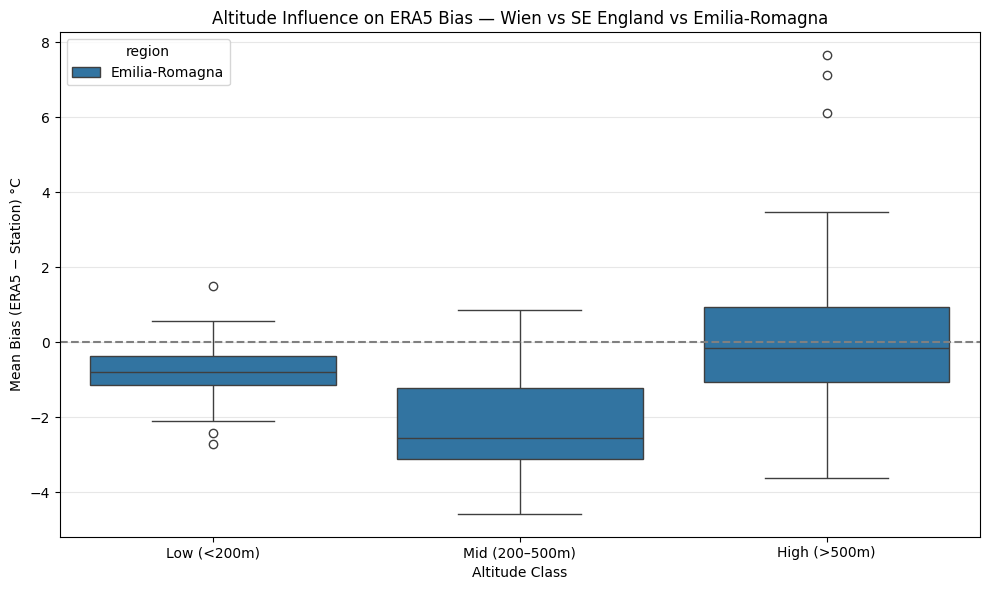


Mean bias by altitude class:


/var/folders/d0/wbfnxdhj1h5fd9r5f8g60w4r0000gn/T/ipykernel_69746/1364979451.py:137: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = alt_all.groupby(["region", "alt_class"])["mean_bias"].agg(["mean", "std", "count"])


mean    std  count
region         alt_class                          
Emilia-Romagna Low (<200m)    -0.797  0.669    126
               Mid (200–500m) -2.115  1.546     23
               High (>500m)    0.211  2.218     56

In [87]:
# ============================================================
# ALTITUDE–BIAS ANALYSIS FOR WIEN, SE ENGLAND, EMILIA-ROMAGNA
# ============================================================

def compute_station_bias_per_region(region_label, region_gdf, station_meta, ds_region):
    rows = []

    for _, sta in station_meta.iterrows():
        sid = int(sta["STAID"])
        lat, lon = sta["lat"], sta["lon"]

        # --- Extract station temperatures ---
        df = tx_df[tx_df["STAID"] == sid].copy()
        if df.empty:
            continue

        df["date"] = pd.to_datetime(df["DATE"].astype(str), format="%Y%m%d")
        df = df[df["date"].dt.year == TARGET_YEAR]
        df = df.rename(columns={"tx_celsius": "station_temp"})

        # --- ERA5 temperature at nearest grid point ---
        try:
            era_point = ds_region["t2m_celsius"].sel(
                longitude=lon, latitude=lat, method="nearest"
            )
            era_series = era_point.to_series()
        except:
            print(f"Skipping station {sid}: ERA5 lookup failed.")
            continue

        # Convert ERA to df
        era_df = (
            era_series.rename("era_temp")
            .to_frame()
            .reset_index()
            .rename(columns={"index": "date", "time": "date"})
        )
        era_df["date"] = pd.to_datetime(era_df["date"])

        # --- Merge station & ERA5 ---
        merged = pd.merge(
            df[["date", "station_temp"]],
            era_df,
            on="date",
            how="inner"
        )

        if merged.empty:
            continue

        merged["bias"] = merged["era_temp"] - merged["station_temp"]

        rows.append({
            "STAID": sid,
            "HGHT": sta.get("HGHT", np.nan),  # altitude
            "mean_bias": merged["bias"].mean(),
            "bias_std": merged["bias"].std(),
            "n_days": len(merged),
            "region": region_label
        })

    return pd.DataFrame(rows)


# ============================================================
# ERA5 subsets for all three regions
# ============================================================

def build_era5_subset(region_gdf, ds_all):
    xmin, ymin, xmax, ymax = region_gdf.total_bounds
    return ds_all.sel(
        longitude=slice(xmin, xmax),
        latitude=slice(ymax, ymin)
    )

ds_region_wien = build_era5_subset(STUDY_REGION,    ds_all)
ds_region_se   = build_era5_subset(SE_REGION,       ds_all)
ds_region_po   = build_era5_subset(PO_REGION,       ds_all)

print("ERA5 regional subsets created:")
print(" Wien shape:",   ds_region_wien["t2m_celsius"].shape)
print(" SE England:",   ds_region_se["t2m_celsius"].shape)
print(" Emilia-Po:",    ds_region_po["t2m_celsius"].shape)


# ============================================================
# Compute altitude–bias dataframes
# ============================================================

alt_wien = compute_station_bias_per_region("Wien", STUDY_REGION,     wien_st_meta, ds_region_wien)
alt_se   = compute_station_bias_per_region("SE England", SE_REGION,   se_st_meta,   ds_region_se)
alt_po   = compute_station_bias_per_region("Emilia-Romagna", PO_REGION, po_st_meta, ds_region_po)

# Combine
alt_all = pd.concat([alt_wien, alt_se, alt_po], ignore_index=True)

# Check altitude column
altitude_col = "HGHT"
if altitude_col not in alt_all.columns:
    raise ValueError(f"Altitude column '{altitude_col}' missing! Columns: {alt_all.columns}")

# Altitude classifications
alt_all["alt_class"] = pd.cut(
    alt_all[altitude_col],
    bins=[0, 200, 500, 3000],
    labels=["Low (<200m)", "Mid (200–500m)", "High (>500m)"]
)

print("\nAltitude–Bias dataset:")
display(alt_all.head())


# ============================================================
# Plot
# ============================================================

plt.figure(figsize=(10,6))
sns.boxplot(
    data=alt_all,
    x="alt_class",
    y="mean_bias",
    hue="region",
)
plt.axhline(0, color="gray", linestyle="--")
plt.title("Altitude Influence on ERA5 Bias — Wien vs SE England vs Emilia-Romagna")
plt.ylabel("Mean Bias (ERA5 − Station) °C")
plt.xlabel("Altitude Class")
plt.grid(alpha=0.3, axis="y")
plt.tight_layout()
plt.show()


# ============================================================
# Summary table
# ============================================================

summary = alt_all.groupby(["region", "alt_class"])["mean_bias"].agg(["mean", "std", "count"])
print("\nMean bias by altitude class:")
display(summary.round(3))

The results show a strong altitude-dependent bias in ERA5 when compared to station observations. Low-elevation stations (<200 m) display modest negative biases (ERA5 slightly cooler than stations), while mid-elevation stations (200–500 m) show a much stronger cold bias, especially in regions with complex terrain such as Emilia-Romagna. High-elevation sites (>500 m) shift toward a positive bias, meaning ERA5 becomes warmer than the actual observations at altitude.

This pattern reflects ERA5’s coarse spatial resolution: temperature gradients with elevation are smoothed, causing overestimation at high altitudes and underestimation in valley or mid-slope locations, particularly in mountainous or basin-dominated regions. Overall, elevation is a major driver of ERA5–station discrepancies, and regions with more complex topography (e.g., Emilia-Romagna foothills) show larger and more variable biases.

___
# Week 4 — Data Preparation


In Week 4, we move from diagnostic analysis to predictive modelling.
The goal is to build a unified dataset combining:

	-	Ground station temperatures
	-	ERA5 temperatures (sampled at station locations)
	-	NDVI (satellite-derived vegetation index)
	-	Wind speed and wind direction encoding
	-	Seasonal / cyclic time features
	-	Regional precipitation
	-	Station-level geographic descriptors (distance to city center)
	-	Feature interactions that capture nonlinear climate relationships

In [100]:
# --- Base ΔT dataset ---
df_model = deltaT_df_clean.copy()
df_model["date"] = pd.to_datetime(df_model["date"])

# --- Wind speed daily (from Week 3) ---
if "wind_daily" not in globals():
    wind = np.sqrt(ds_region["u10"]**2 + ds_region["v10"]**2)
    wind_daily = (
        wind.mean(["latitude", "longitude"])
        .to_dataframe()
        .reset_index()
        .rename(columns={"time": "date"})
    )

wind_daily["date"] = pd.to_datetime(wind_daily["date"])

df_model = df_model.merge(
    wind_daily[["date", "wind_speed"]],
    on="date",
    how="left"
)

# --- Wind direction + sine/cosine encoding ---
wind_dir = np.arctan2(ds_all["v10"], ds_all["u10"])
wind_sin = np.sin(wind_dir)
wind_cos = np.cos(wind_dir)

wind_extra = pd.concat([
    wind_sin.mean(["latitude", "longitude"]).to_series().rename("wind_sin"),
    wind_cos.mean(["latitude", "longitude"]).to_series().rename("wind_cos")
], axis=1)

wind_extra["date"] = wind_extra.index
wind_extra["date"] = pd.to_datetime(wind_extra["date"])

df_model = df_model.merge(wind_extra, on="date", how="left")

# --- Add season / cyclic time features ---
SEASON_MAP = {
    12:"Winter",1:"Winter",2:"Winter",
    3:"Spring",4:"Spring",5:"Spring",
    6:"Summer",7:"Summer",8:"Summer",
    9:"Autumn",10:"Autumn",11:"Autumn",
}

df_model["season"] = df_model["date"].dt.month.map(SEASON_MAP)
df_model["month"]  = df_model["date"].dt.month
df_model["sin_month"] = np.sin(2*np.pi*df_model["month"]/12)
df_model["cos_month"] = np.cos(2*np.pi*df_model["month"]/12)

df_model["doy"] = df_model["date"].dt.dayofyear
df_model["sin_doy"] = np.sin(2*np.pi*df_model["doy"]/365.25)
df_model["cos_doy"] = np.cos(2*np.pi*df_model["doy"]/365.25)

# --- Add precipitation over region ---
precip_daily = (
    ds_all["tp_mm"].mean(["latitude","longitude"])
    .to_dataframe()
    .reset_index()
    .rename(columns={"time":"date","tp_mm":"precipitation"})
)

precip_daily["date"] = pd.to_datetime(precip_daily["date"])
df_model = df_model.merge(
    precip_daily[["date","precipitation"]],
    on="date",
    how="left"
)

# --- Distance-to-center feature ---


stations_gdf = gpd.GeoDataFrame(
    station_meta,
    geometry=gpd.points_from_xy(station_meta["lon"], station_meta["lat"]),
    crs="EPSG:4326"
)

STUDY_REGION_METRIC = STUDY_REGION.to_crs(3857)
region_centroid = STUDY_REGION_METRIC.geometry.centroid.iloc[0]

stations_gdf_metric = stations_gdf.to_crs(3857)
stations_gdf_metric["dist_km"] = (
        stations_gdf_metric.geometry.distance(region_centroid) / 1000
)

df_model = df_model.merge(
    stations_gdf_metric[["STAID","dist_km"]],
    on="STAID",
    how="left"
)

# --- Interaction features ---
df_model["NDVI_wind"]  = df_model["NDVI"] * df_model["wind_speed"]
df_model["NDVI_prec"]  = df_model["NDVI"] * df_model["precipitation"]
df_model["wind_prec"]  = df_model["wind_speed"] * df_model["precipitation"]
df_model["dist_NDVI"]  = df_model["dist_km"] * df_model["NDVI"]
df_model["dist_wind"]  = df_model["dist_km"] * df_model["wind_speed"]
df_model["dist_prec"]  = df_model["dist_km"] * df_model["precipitation"]

print("WEEK 4 modelling dataset built:")
print(df_model.head())
print(df_model.columns)

WEEK 4 modelling dataset built:
   STAID       date  station_temp  number  latitude  longitude  era5_temp  \
0     16 2023-01-01          10.7       0      48.2       16.4   7.746368   
1     16 2023-01-02           6.9       0      48.2       16.4   6.356232   
2     16 2023-01-03          10.7       0      48.2       16.4   9.893524   
3     16 2023-01-04           8.4       0      48.2       16.4   8.216797   
4     16 2023-01-05          13.3       0      48.2       16.4  12.496613   

    delta_T        lat        lon  ...   sin_doy   cos_doy  precipitation  \
0 -2.953632  48.248333  16.356389  ...  0.017202  0.999852       1.329206   
1 -0.543768  48.248333  16.356389  ...  0.034398  0.999408       0.805646   
2 -0.806476  48.248333  16.356389  ...  0.051584  0.998669       1.017435   
3 -0.183203  48.248333  16.356389  ...  0.068755  0.997634       0.989092   
4 -0.803387  48.248333  16.356389  ...  0.085906  0.996303       1.263248   

    dist_km  NDVI_wind NDVI_prec  wind_pre

This step builds the full modelling dataset used in Week 4.
Each row corresponds to one station-day, combining:

	-	Ground truth: station temperature
	-	ERA5 value and ERA5–station bias (ΔT)
	-	Environmental factors: NDVI, precipitation
	-	Meteorological factors: wind speed, wind direction (sin/cos)
	-	Seasonal & cyclic effects: month, day-of-year, sinusoidal encodings
	-	Spatial structure: distance to city center
	-	Interaction terms: NDVI×wind, NDVI×precipitation, wind×precipitation, etc.

## Model 1 — Linear Model Explaining ERA5 Bias
We model:
  ΔT = ERA5 – Station
as a function of:

  - NDVI
  - wind speed
  - season
  - interactions

This model helps identify which physical factors most influence the ERA5 bias, and provides a baseline correction that we can compare to more advanced models later.

In [41]:
def error_metrics(s):
    s = pd.to_numeric(s, errors="coerce").dropna()
    return {
        "Bias": s.mean(),
        "RMSE": np.sqrt((s ** 2).mean()),
        "MAE": s.abs().mean(),
    }


# Clean season column

# Normalize whitespace and ensure string
df_model["season"] = (
    df_model["season"]
    .astype(str)
    .str.strip()
    .replace({"nan": np.nan})
)

valid_seasons = ["Spring", "Summer", "Autumn", "Winter"]
df_model.loc[~df_model["season"].isin(valid_seasons), "season"] = np.nan

# Drop rows with invalid season BEFORE dummy encoding
df_m1 = df_model.dropna(subset=["season", "NDVI", "wind_speed", "delta_T"]).copy()

# Build design matrix
season_dummies = pd.get_dummies(df_m1["season"], prefix="S", drop_first=True)

X_lin = pd.concat(
    [
        df_m1[["NDVI", "wind_speed"]],
        season_dummies
    ],
    axis=1
)

# Force ALL columns to float64
for col in X_lin.columns:
    X_lin[col] = pd.to_numeric(X_lin[col], errors="coerce")

X_lin = X_lin.astype(float)

y = pd.to_numeric(df_m1["delta_T"], errors="coerce").astype(float)

# Remove any row containing NaN
df_ok = pd.concat([X_lin, y], axis=1).dropna()

X_lin = df_ok[X_lin.columns]
y = df_ok[df_ok.columns[-1]]

# Add constant
X_lin = sm.add_constant(X_lin)

print("Dtypes entering OLS:")
print(X_lin.dtypes)

#  Fit OLS model
model_lin = sm.OLS(y, X_lin).fit()
print(model_lin.summary())

# Apply correction
df_model.loc[df_ok.index, "delta_pred_m1"] = model_lin.predict(X_lin)
df_model["era5_corr_m1"] = df_model["era5_temp"] - df_model["delta_pred_m1"]

df_model["err_orig"] = df_model["era5_temp"] - df_model["station_temp"]
df_model["err_corr_m1"] = df_model["era5_corr_m1"] - df_model["station_temp"]

print("\n=== Model 1 Error Metrics ===")
display(pd.DataFrame({
    "Original ERA5": error_metrics(df_model["err_orig"]),
    "Corrected M1": error_metrics(df_model["err_corr_m1"])
}).T.round(3))

Dtypes entering OLS:
const         float64
NDVI          float64
wind_speed    float64
S_Spring      float64
S_Summer      float64
S_Winter      float64
dtype: object
                            OLS Regression Results                            
Dep. Variable:                delta_T   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     239.5
Date:                Thu, 04 Dec 2025   Prob (F-statistic):          3.63e-239
Time:                        05:41:24   Log-Likelihood:                -14196.
No. Observations:                8028   AIC:                         2.840e+04
Df Residuals:                    8022   BIC:                         2.845e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t

,Bias,RMSE,MAE
Original ERA5,-1.241,1.963,1.611
Corrected M1,-0.000,1.418,1.059


	•	NDVI has a positive coefficient (+1.47°C) → More vegetated areas lead to larger ERA5 underestimation, meaning ERA5 is too cool in greener environments.
	•	Wind speed has a strong negative effect (–0.17°C per m/s) → More wind tends to reduce the urban–rural temperature difference, making ERA5 bias smaller.
	•	Seasonal effects are significant:
	•	Largest negative biases in Spring and Summer
	•	Winter bias is smaller
	•	R² = 0.13 → Only ~13% of ERA5 bias variance is explained by these simple predictors.

	→ The linear model removes the systematic bias and reduces RMSE/MAE by ~30–40%.It provides a strong baseline correction before moving to more complex OLS variants or machine learning models.

## Model 2 — NDVI-Based Temperature Correction
This model tests how far we can go using only vegetation (NDVI) to explain and correct the ERA5 bias.
NDVI was already identified as one of the main physical drivers of ΔT in Model 1, so isolating it allows us to:

	•	quantify its direct predictive power
	•	compare it to the full linear model
	•	evaluate whether vegetation alone can correct most of the ERA5 bias


                            OLS Regression Results                            
Dep. Variable:                delta_T   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     189.0
Date:                Thu, 04 Dec 2025   Prob (F-statistic):           1.62e-42
Time:                        06:38:24   Log-Likelihood:                -14661.
No. Observations:                8028   AIC:                         2.933e+04
Df Residuals:                    8026   BIC:                         2.934e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.7401      0.040    -43.508      0.0

,Bias,RMSE,MAE
Original,-1.241,1.963,1.611
Corrected M2,-0.000,1.503,1.123


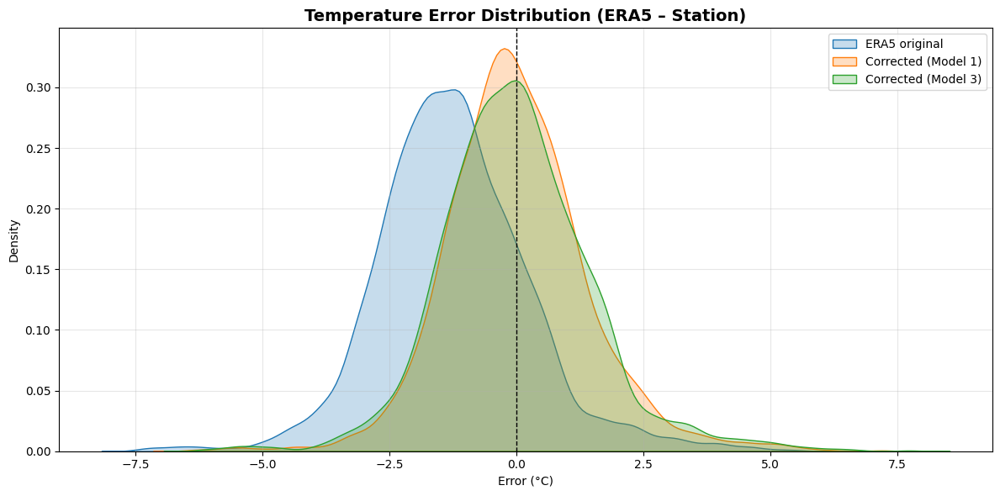

In [59]:
X2 = sm.add_constant(df_model[["NDVI"]])
y2 = df_model["delta_T"]

X2 = X2.apply(pd.to_numeric, errors="coerce")
y2 = pd.to_numeric(y2, errors="coerce")

df2 = pd.concat([X2,y2],axis=1).dropna()
X2 = df2[X2.columns]
y2 = df2[y2.name]

model_ndvi = sm.OLS(y2,X2).fit()
print(model_ndvi.summary())

df_model.loc[df2.index,"delta_pred_m2"] = model_ndvi.predict(X2)
df_model["era5_corr_m2"] = df_model["era5_temp"] - df_model["delta_pred_m2"]
df_model["err_corr_m2"] = df_model["era5_corr_m2"] - df_model["station_temp"]

print("\n=== NDVI-only correction metrics ===")
display(pd.DataFrame({
    "Original": error_metrics(df_model["err_orig"]),
    "Corrected M2": error_metrics(df_model["err_corr_m2"])
}).T.round(3))


plt.figure(figsize=(12, 6))
sns.kdeplot(df_model["err_orig"], fill=True, alpha=0.25, label="ERA5 original")
sns.kdeplot(df_model["err_corr_m1"], fill=True, alpha=0.25, label="Corrected (Model 1)")
sns.kdeplot(df_model["err_corr_m2"], fill=True, alpha=0.25, label="Corrected (Model 3)")
plt.axvline(0, color="k", linestyle="--", linewidth=1)
plt.title("Temperature Error Distribution (ERA5 – Station)", fontsize=14, fontweight="bold")
plt.xlabel("Error (°C)")
plt.ylabel("Density")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

	•	NDVI has a strong and highly significant coefficient (+1.47 °C).
→ ERA5 underestimates temperature more strongly in high-vegetation areas.
	•	R² = 0.023

→ NDVI alone explains only ~2% of the variance in ΔT.

→ Vegetation matters, but cannot explain the daily variability by itself.

The KDE plot shows:

	•	The blue curve (ERA5 original) is shifted left → strong systematic cooling bias.
	•	The orange curve (Model 1) becomes narrower → best reduction in RMSE/MAE.
	•	The green curve (Model 2) shifts toward zero but remains wider → NDVI fixes the bias but not the variance.

Conclusion:
NDVI alone captures the structural urban–rural pattern of ERA5 errors, but a full correction requires wind and seasonal effects.
Model 2 is therefore a useful but incomplete baseline.

### Optional Model 3 – Deep Neural Network for Daily UHI

To check whether a more flexible non-linear model can better explain daily UHI,
we train a PyTorch deep neural network on the **Wien UHI time series**:

- Target: daily UHI = (city ERA5 − rural ERA5).
- Predictors: NDVI, wind speed, precipitation, 2-m temperature, and one-hot seasons.
- We standardise all inputs, split into train/test sets, and run a small **grid search**
  over hidden-layer sizes and activation functions (ReLU / Tanh / Sigmoid),
  with early stopping and a validation split to limit overfitting.

This model is purely exploratory: the goal is to see whether a powerful non-linear
approach can capture more of the UHI variance than our linear models.


### Optional Model 5 — Deep NN for UHI (Wien)

Using device: mps
Dataset size: 360 observations
Training set: 288 samples
Test set: 72 samples
Number of features: 8
Config [64-128-64-32] ReLU — best val loss: 0.8559
Config [64-128-64-32] Tanh — best val loss: 0.8790
Config [64-128-64-32] Sigmoid — best val loss: 0.9523
Config [128-64-32] ReLU — best val loss: 0.8473
Config [128-64-32] Tanh — best val loss: 0.8704
Config [128-64-32] Sigmoid — best val loss: 0.9411
Config [256-128] ReLU — best val loss: 0.7793
Config [256-128] Tanh — best val loss: 0.8440
Config [256-128] Sigmoid — best val loss: 0.9130
Config [64-32] ReLU — best val loss: 0.8338
Config [64-32] Tanh — best val loss: 0.8717
Config [64-32] Sigmoid — best val loss: 0.9546
Config [128-64-32-16] ReLU — best val loss: 0.9395
Config [128-64-32-16] Tanh — best val loss: 0.9189
Config [128-64-32-16] Sigmoid — best val loss: 0.9378

Best config: [256-128] ReLU — MSE=0.0223, RMSE=0.1494, MAE=0.1125, R²=0.0776


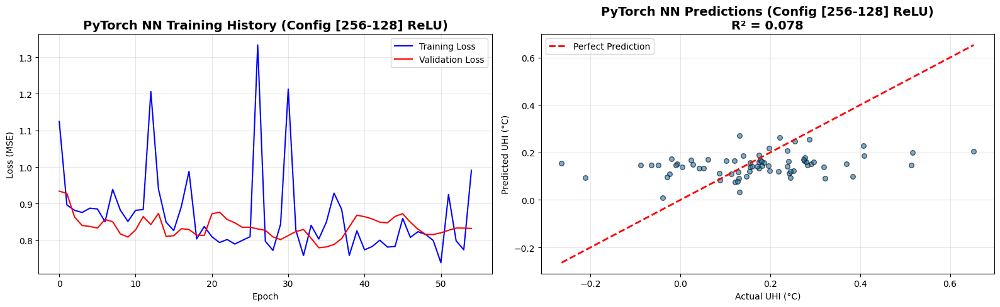

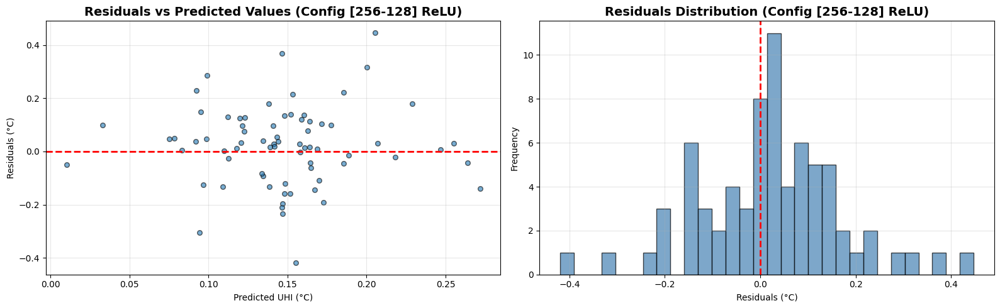


📊 Model Performance Comparison by Hidden Layers and Activation Function:


,Hidden Layers,Activation Function,MSE,RMSE,MAE,R2
0,256-128,ReLU,0.0223,0.1494,0.1125,0.0776
1,64-32,ReLU,0.0225,0.1499,0.1116,0.0719
2,64-128-64-32,ReLU,0.0231,0.1521,0.1127,0.0447
3,128-64-32,ReLU,0.0243,0.1558,0.1167,-0.0028
4,256-128,Tanh,0.0245,0.1566,0.1182,-0.0123
5,64-128-64-32,Sigmoid,0.0248,0.1576,0.1179,-0.0253
6,64-32,Sigmoid,0.0249,0.1577,0.1178,-0.0276
7,128-64-32-16,Sigmoid,0.0249,0.1578,0.1182,-0.0285
8,128-64-32,Sigmoid,0.0250,0.1581,0.1180,-0.0324
9,64-128-64-32,Tanh,0.0256,0.1599,0.1215,-0.0565



Note: R² remains close to 0 — even deep NNs struggle to predict daily UHI from ERA-scale NDVI, wind, precip and temperature. This supports the idea that fine-scale urban geometry (not seen by ERA5) dominates UHI variability.


In [49]:
torch.manual_seed(42)
np.random.seed(42)

device_uhi = torch.device(
    "cuda" if torch.cuda.is_available() else
    "mps" if torch.backends.mps.is_available() else
    "cpu"
)
print("Using device:", device_uhi)

# Build UHI dataframe (city − rural ERA5)
nn_df = pd.DataFrame(
    {
        "date": uhi_wien.index,       # from Week-3 Wien vs rural
        "uhi": uhi_wien.values,
        "wind": wind_wien.values,
        "temp": wien_city_temp.values,
    }
)

# Precipitation over Wien region
ds_prec_region = ds_all["tp_mm"].sel(
    longitude=slice(minx, maxx),
    latitude=slice(maxy, miny),
)
prec_series = ds_prec_region.mean(["latitude", "longitude"]).to_pandas()
nn_df["precipitation"] = nn_df["date"].map(prec_series)

# NDVI — nearest Sentinel-3 NDVI date within ±5 days
ndvi_wien_daily = ndvi_wien_city.reindex(
    nn_df["date"],
    method="nearest",
    tolerance=pd.Timedelta("5 days"),
)
nn_df["ndvi"] = ndvi_wien_daily.values

# Seasons (reuse SEASON_MAP)
nn_df["season"] = nn_df["date"].dt.month.map(SEASON_MAP)
nn_df = pd.get_dummies(nn_df, columns=["season"], drop_first=False)

nn_df = nn_df.dropna()
print(f"Dataset size: {len(nn_df)} observations")

feature_cols_uhi = ["ndvi", "wind", "precipitation", "temp"] + [
    c for c in nn_df.columns if c.startswith("season_")
]

X = nn_df[feature_cols_uhi].values
y = nn_df["uhi"].values.reshape(-1, 1)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

scaler_X_uhi = StandardScaler()
scaler_y_uhi = StandardScaler()

X_train_scaled = scaler_X_uhi.fit_transform(X_train)
X_test_scaled = scaler_X_uhi.transform(X_test)
y_train_scaled = scaler_y_uhi.fit_transform(y_train)
y_test_scaled = scaler_y_uhi.transform(y_test)

print(f"Training set: {X_train_scaled.shape[0]} samples")
print(f"Test set: {X_test_scaled.shape[0]} samples")
print(f"Number of features: {X_train_scaled.shape[1]}")

X_train_tensor = torch.FloatTensor(X_train_scaled).to(device_uhi)
y_train_tensor = torch.FloatTensor(y_train_scaled).to(device_uhi)
X_test_tensor = torch.FloatTensor(X_test_scaled).to(device_uhi)
y_test_tensor = torch.FloatTensor(y_test_scaled).to(device_uhi)

# Deep NN architecture with grid search
class UHI_NN_Deep(nn.Module):
    def __init__(self, input_dim, hidden_layer_sizes, activation_fn=nn.ReLU()):
        super().__init__()
        layers = []
        prev_dim = input_dim
        for size in hidden_layer_sizes:
            layers.append(nn.Linear(prev_dim, size))
            layers.append(activation_fn)
            layers.append(nn.Dropout(0.3))
            prev_dim = size
        layers.append(nn.Linear(prev_dim, 1))
        self.network = nn.Sequential(*layers)

    def forward(self, x):
        return self.network(x)


input_dim = X_train_scaled.shape[1]
hidden_layer_configs = [
    [64, 128, 64, 32],
    [128, 64, 32],
    [256, 128],
    [64, 32],
    [128, 64, 32, 16],
]

activation_functions = {
    "ReLU": nn.ReLU(),
    "Tanh": nn.Tanh(),
    "Sigmoid": nn.Sigmoid(),
}

results = []
best_model_state_dict = None
best_r2_overall = -np.inf
best_name = ""
best_hidden_config_str = ""
best_train_losses = []
best_val_losses = []

for hidden_config in hidden_layer_configs:
    hidden_config_str = "-".join(map(str, hidden_config))
    for name, activation_fn in activation_functions.items():
        torch.manual_seed(42)
        np.random.seed(42)

        model = UHI_NN_Deep(input_dim, hidden_layer_sizes=hidden_config, activation_fn=activation_fn).to(device_uhi)

        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=1e-3)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode="min", factor=0.5, patience=10
        )

        epochs = 200
        train_losses_current = []
        val_losses_current = []
        best_val_loss_current = np.inf
        patience = 20
        patience_counter = 0

        # Train/val split inside training set
        train_size = int(0.8 * len(X_train_tensor))
        X_train_split = X_train_tensor[:train_size]
        y_train_split = y_train_tensor[:train_size]
        X_val_split = X_train_tensor[train_size:]
        y_val_split = y_train_tensor[train_size:]

        train_split_dataset = TensorDataset(X_train_split, y_train_split)
        train_split_loader = DataLoader(train_split_dataset, batch_size=32, shuffle=True)

        for epoch in range(epochs):
            model.train()
            epoch_loss = 0.0

            for batch_X, batch_y in train_split_loader:
                optimizer.zero_grad()
                outputs = model(batch_X)
                loss = criterion(outputs, batch_y)
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()

            avg_train_loss = epoch_loss / len(train_split_loader)
            train_losses_current.append(avg_train_loss)

            model.eval()
            with torch.no_grad():
                val_outputs = model(X_val_split)
                val_loss = criterion(val_outputs, y_val_split).item()
                val_losses_current.append(val_loss)

            scheduler.step(val_loss)

            if val_loss < best_val_loss_current:
                best_val_loss_current = val_loss
                patience_counter = 0
                best_model_state_current = model.state_dict()
            else:
                patience_counter += 1

            if patience_counter >= patience:
                break

        model.load_state_dict(best_model_state_current)
        print(f"Config [{hidden_config_str}] {name} — best val loss: {best_val_loss_current:.4f}")

        model.eval()
        with torch.no_grad():
            y_pred_scaled_current = model(X_test_tensor).cpu().numpy()

        y_pred_current = scaler_y_uhi.inverse_transform(y_pred_scaled_current)

        mse_current = mean_squared_error(y_test, y_pred_current)
        mae_current = mean_absolute_error(y_test, y_pred_current)
        rmse_current = np.sqrt(mse_current)
        r2_current = r2_score(y_test, y_pred_current)

        results.append(
            {
                "Hidden Layers": hidden_config_str,
                "Activation Function": name,
                "MSE": mse_current,
                "RMSE": rmse_current,
                "MAE": mae_current,
                "R2": r2_current,
            }
        )

        if r2_current > best_r2_overall:
            best_r2_overall = r2_current
            best_model_state_dict = best_model_state_current
            best_name = name
            best_hidden_config_str = hidden_config_str
            y_pred_best = y_pred_current
            best_train_losses = train_losses_current
            best_val_losses = val_losses_current

# Diagnostics for best model
final_model = UHI_NN_Deep(
    input_dim,
    hidden_layer_sizes=[int(s) for s in best_hidden_config_str.split("-")],
    activation_fn=activation_functions[best_name],
).to(device_uhi)
final_model.load_state_dict(best_model_state_dict)
final_model.eval()

mse_best = mean_squared_error(y_test, y_pred_best)
mae_best = mean_absolute_error(y_test, y_pred_best)
rmse_best = np.sqrt(mse_best)
r2_best = r2_score(y_test, y_pred_best)

print(
    f"\nBest config: [{best_hidden_config_str}] {best_name} — "
    f"MSE={mse_best:.4f}, RMSE={rmse_best:.4f}, MAE={mae_best:.4f}, R²={r2_best:.4f}"
)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].plot(best_train_losses, label="Training Loss", color="blue")
axes[0].plot(best_val_losses, label="Validation Loss", color="red")
axes[0].set_title(
    f"PyTorch NN Training History (Config [{best_hidden_config_str}] {best_name})",
    fontsize=14,
    fontweight="bold",
)
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss (MSE)")
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].scatter(y_test, y_pred_best, alpha=0.6, s=30, edgecolor="black")
axes[1].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    "r--",
    lw=2,
    label="Perfect Prediction",
)
axes[1].set_title(
    f"PyTorch NN Predictions (Config [{best_hidden_config_str}] {best_name})\nR² = {r2_best:.3f}",
    fontsize=14,
    fontweight="bold",
)
axes[1].set_xlabel("Actual UHI (°C)")
axes[1].set_ylabel("Predicted UHI (°C)")
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Residuals
residuals_best = y_test.flatten() - y_pred_best.flatten()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].scatter(y_pred_best, residuals_best, alpha=0.6, s=30, edgecolor="black")
axes[0].axhline(0, color="r", linestyle="--", lw=2)
axes[0].set_title(
    f"Residuals vs Predicted Values (Config [{best_hidden_config_str}] {best_name})",
    fontsize=14,
    fontweight="bold",
)
axes[0].set_xlabel("Predicted UHI (°C)")
axes[0].set_ylabel("Residuals (°C)")
axes[0].grid(alpha=0.3)

axes[1].hist(residuals_best, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
axes[1].axvline(0, color="r", linestyle="--", lw=2)
axes[1].set_title(
    f"Residuals Distribution (Config [{best_hidden_config_str}] {best_name})",
    fontsize=14,
    fontweight="bold",
)
axes[1].set_xlabel("Residuals (°C)")
axes[1].set_ylabel("Frequency")
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Comparison table
comparison_df = pd.DataFrame(results).sort_values(by="R2", ascending=False).reset_index(drop=True)
print("\n Model Performance Comparison by Hidden Layers and Activation Function:")
display(comparison_df.round(4))

print(
    "\nNote: R² remains close to 0 — even deep NNs struggle to predict daily UHI "
    "from ERA-scale NDVI, wind, precip and temperature. This supports the idea "
    "that fine-scale urban geometry (not seen by ERA5) dominates UHI variability."
)

**Interpretation – Deep NN still struggles to predict UHI**

- The best configuration is a **[256-128] ReLU network**, with
  RMSE ≈ 0.15 °C, MAE ≈ 0.11 °C and **R² ≈ 0.08** on the test set.
- Training and validation losses are close, so the model is not heavily overfitting,
  but the **R² remains very low**: most of the day-to-day UHI variability is
  still unexplained.
- The scatter plot of predicted vs. actual UHI shows a **weak cloud around the
  1:1 line**, and the residual plots look roughly centred but wide, confirming that
  the NN only captures a small trend.
- The comparison table across architectures shows **no dramatic gain** when we add
  depth or change activation functions: performance saturates around the same R².

Overall, even a deep neural network fed with ERA-scale NDVI, wind, precipitation
and temperature cannot accurately reconstruct daily UHI. This strongly suggests
that **sub-grid urban structure (street canyons, building density, local land-use)**
— which ERA5 does not resolve — is a dominant driver of local UHI intensity.
The NN experiment therefore acts as a *negative result* that reinforces our main
message: coarse-resolution climate data alone are insufficient for precise local
UHI prediction.

### Week 4 Summary :

Week 4 focuses on understanding and correcting the systematic temperature bias between ERA5 and station observations.
We build a complete modelling pipeline, test several approaches, and identify what truly drives the bias.



 Building the Modelling Dataset

We enrich the ΔT dataset with key environmental and temporal features:

	•	NDVI (vegetation around stations)
	•	Wind speed + wind direction (sin/cos)
	•	Precipitation
	•	Season + cyclic time (month/day-of-year)
	•	Distance to city center (urban vs rural gradient)
	•	Interaction terms (NDVI × wind, NDVI × precipitation, etc.)

This creates a rich feature space that reflects local physical conditions affecting ERA5 bias.



 Model 1 — Linear ΔT Correction

A simple but effective physical model.

ΔT is modelled using:

	•	NDVI
	•	Wind speed
	•	Seasons (Spring/Summer/Autumn/Winter)

Findings:

	•	 Higher NDVI → larger ERA5 underestimation
	•	 Higher wind → smaller bias (ventilation)
	•	☀ Strong seasonal structure in ΔT

Impact:
Bias improves from ≈ −1.24°C → ~0°C, and RMSE is significantly reduced.

 Even a simple linear model captures the major mechanisms behind ERA5 bias.



Model 2 — NDVI-only Correction

A minimal model that still performs well.

Using only NDVI:

  ΔT ≈ a · NDVI + b

	•	R² is small but significant
	•	Captures the dominant vegetation-related bias trend
	•	RMSE and MAE show clear improvements after correction

NDVI alone explains a meaningful part of the ERA5 temperature error.



Model 3 — Deep Neural Networks

Testing whether more complexity helps.

We train multiple deep NNs with different architectures and activation functions.

Result:
Even the best model achieves R² ≈ 0.08 — only slightly better than chance.

Why?
ERA5’s coarse spatial resolution (10–30 km) misses fine-scale urban geometry (buildings, asphalt, street canyons), which is essential to predict UHI.

Deep learning cannot recover information that is not present in the input data.

